In [1]:
!pip install statsmodels
!pip install scikit-learn


In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

from statsmodels.tsa.seasonal import seasonal_decompose


In [3]:
evolucion_precio = pd.ExcelFile(r"C:\Users\evahr\Downloads\TFM-idealista\Hist de precios de venta Madrid.xlsx")

print(evolucion_precio.sheet_names)  

['Arganzuela', 'Barajas', 'Carabanchel', 'Centro', 'Chamartín', 'Chamberí', 'Ciudad Lineal', 'Fuencarral-El Pardo', 'Hortaleza', 'Latina', 'Moncloa-Aravaca', 'Moratalaz', 'Puente de Vallecas', 'Retiro', 'Salamanca', 'San Blas-Canillejas', 'Tetuán', 'Usera', 'Vicálvaro', 'Villa de Vallecas', 'Villaverde']


In [4]:
# Leer cada hoja en un diccionario {nombre_distrito: DataFrame}
district_data = {
    sheet_name.strip(): evolucion_precio.parse(sheet_name)
    for sheet_name in evolucion_precio.sheet_names
}

In [5]:
# Crear diferentes Data Frame por cada distrito
# Crear diferentes DataFrame por cada distrito (solo con columnas Mes y Precio m2)
df_arganzuela = evolucion_precio.parse("Arganzuela")[['Mes', 'Precio m2']]
df_barajas = evolucion_precio.parse("Barajas")[['Mes', 'Precio m2']]
df_carabanchel = evolucion_precio.parse("Carabanchel")[['Mes', 'Precio m2']]
df_centro = evolucion_precio.parse("Centro")[['Mes', 'Precio m2']]
df_chamartin = evolucion_precio.parse("Chamartín")[['Mes', 'Precio m2']]
df_chamberi = evolucion_precio.parse("Chamberí")[['Mes', 'Precio m2']]
df_ciudad_lineal = evolucion_precio.parse("Ciudad Lineal")[['Mes', 'Precio m2']]
df_fuencarral = evolucion_precio.parse("Fuencarral-El Pardo")[['Mes', 'Precio m2']]
df_hortaleza = evolucion_precio.parse("Hortaleza")[['Mes', 'Precio m2']]
df_latina = evolucion_precio.parse("Latina")[['Mes', 'Precio m2']]
df_moncloa = evolucion_precio.parse("Moncloa-Aravaca")[['Mes', 'Precio m2']]
df_moratalaz = evolucion_precio.parse("Moratalaz")[['Mes', 'Precio m2']]
df_puente_de_vallecas = evolucion_precio.parse("Puente de Vallecas")[['Mes', 'Precio m2']]
df_retiro = evolucion_precio.parse("Retiro")[['Mes', 'Precio m2']]
df_salamanca = evolucion_precio.parse("Salamanca")[['Mes', 'Precio m2']]
df_san_blas = evolucion_precio.parse("San Blas-Canillejas")[['Mes', 'Precio m2']]
df_tetuan = evolucion_precio.parse("Tetuán")[['Mes', 'Precio m2']]  # cuidado con el espacio final
df_usera = evolucion_precio.parse("Usera")[['Mes', 'Precio m2']]
df_vicalvaro = evolucion_precio.parse("Vicálvaro")[['Mes', 'Precio m2']]
df_villa_de_vallecas = evolucion_precio.parse("Villa de Vallecas")[['Mes', 'Precio m2']]
df_villaverde = evolucion_precio.parse("Villaverde")[['Mes', 'Precio m2']]

In [6]:
# Eliminar el símbolo €/m2, limpia puntos de miles y comas decimales
# Lista de variables de tus DataFrames
nombres_distritos = [
    'df_arganzuela', 'df_barajas', 'df_carabanchel', 'df_centro', 'df_chamartin',
    'df_chamberi', 'df_ciudad_lineal', 'df_fuencarral', 'df_hortaleza', 'df_latina',
    'df_moncloa', 'df_moratalaz', 'df_puente_de_vallecas', 'df_retiro', 'df_salamanca',
    'df_san_blas', 'df_tetuan', 'df_usera', 'df_vicalvaro', 'df_villa_de_vallecas', 'df_villaverde'
]

# Bucle para limpiar y convertir la columna 'Precio m2' en todos
for nombre in nombres_distritos:
    df = globals()[nombre]

    # Asegurarse de que la columna sea tipo texto
    df['Precio m2'] = df['Precio m2'].astype(str)

    # Limpiar símbolos y formato
    df['Precio m2'] = (
        df['Precio m2']
        .str.replace('€/m2', '', regex=False)
        .str.replace('.', '', regex=False)   
        .str.replace(',', '.', regex=False)  
    )

    # Convertir a float, 'nd' y errores serán NaN
    df['Precio m2'] = pd.to_numeric(df['Precio m2'], errors='coerce')

    # Eliminar filas con NaN en 'Precio m2'
    df.dropna(subset=['Precio m2'], inplace=True)


C:\Users\evahr\AppData\Local\Temp\ipykernel_7188\4075271858.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', len(distritos))  # 20 colores bien diferenciados


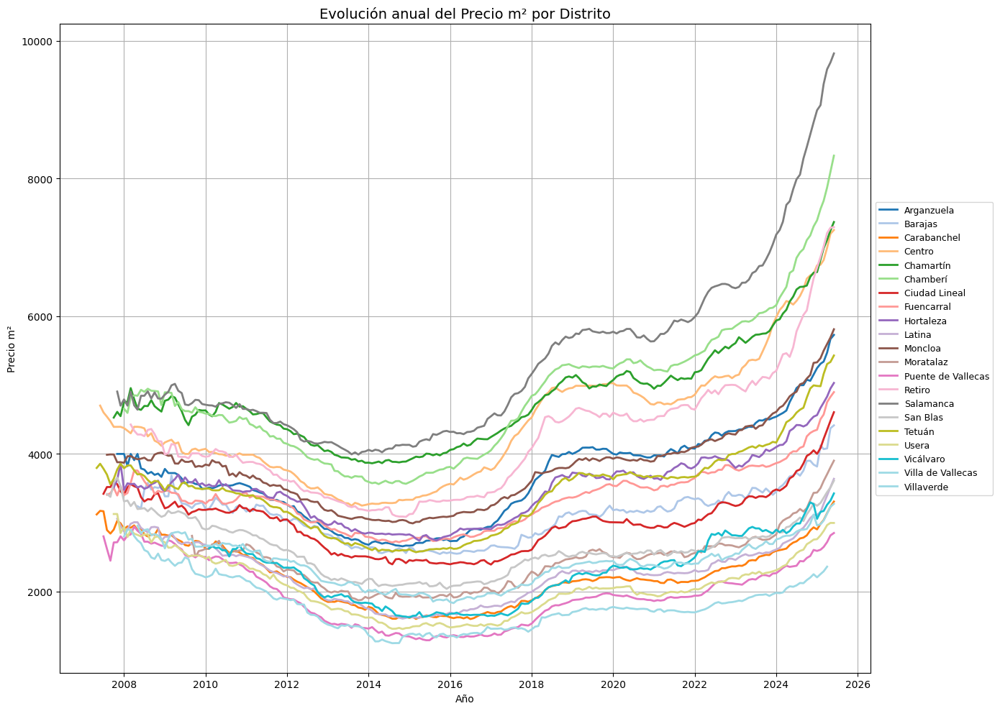

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Diccionario de dataframes por distrito
distritos = {
    "Arganzuela": df_arganzuela,
    "Barajas": df_barajas,
    "Carabanchel": df_carabanchel,
    "Centro": df_centro,
    "Chamartín": df_chamartin,
    "Chamberí": df_chamberi,
    "Ciudad Lineal": df_ciudad_lineal,
    "Fuencarral": df_fuencarral,
    "Hortaleza": df_hortaleza,
    "Latina": df_latina,
    "Moncloa": df_moncloa,
    "Moratalaz": df_moratalaz,
    "Puente de Vallecas": df_puente_de_vallecas,
    "Retiro": df_retiro,
    "Salamanca": df_salamanca,
    "San Blas": df_san_blas,
    "Tetuán": df_tetuan,
    "Usera": df_usera,
    "Vicálvaro": df_vicalvaro,
    "Villa de Vallecas": df_villa_de_vallecas,
    "Villaverde": df_villaverde
}

# Paleta de colores más clara y visual
colormap = cm.get_cmap('tab20', len(distritos))  


# Crear gráfico
plt.figure(figsize=(14, 10))

for i, (nombre, df) in enumerate(distritos.items()):
    df = df.copy()
    df['Mes'] = pd.to_datetime(df['Mes'])
    df.set_index('Mes', inplace=True)
    df['Precio m2'] = pd.to_numeric(df['Precio m2'], errors='coerce')

    # Plot con color diferenciado
    plt.plot(df.index, df['Precio m2'], label=nombre, color=colormap(i),linewidth=2)

# Personalización
plt.title("Evolución anual del Precio m² por Distrito", fontsize=14)
plt.xlabel("Año")
plt.ylabel("Precio m²")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=9)
plt.grid(True)
plt.tight_layout()
plt.show()


In [8]:
# Convertir en serie temporal
# Lista de variables de tus DataFrames
nombres_distritos = [
    'df_arganzuela', 'df_barajas', 'df_carabanchel', 'df_centro', 'df_chamartin',
    'df_chamberi', 'df_ciudad_lineal', 'df_fuencarral', 'df_hortaleza', 'df_latina',
    'df_moncloa', 'df_moratalaz', 'df_puente_de_vallecas', 'df_retiro', 'df_salamanca',
    'df_san_blas', 'df_tetuan', 'df_usera', 'df_vicalvaro', 'df_villa_de_vallecas', 'df_villaverde'
]

# Aplicar el indexado temporal ordenado con frecuencia mensual a cada uno
for nombre in nombres_distritos:
    df = globals()[nombre]  # accede a la variable por su nombre
    df['Mes'] = pd.to_datetime(df['Mes'])        # asegurar tipo datetime
    df.set_index('Mes', inplace=True)            # poner 'Mes' como índice
    df.sort_index(inplace=True)                  # ordenar de más antiguo a más reciente
    df = df.asfreq('MS')                         # establecer frecuencia mensual
    globals()[nombre] = df                       # actualizar la variable original



In [9]:
df_moncloa.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 215 entries, 2007-08-01 to 2025-06-01
Freq: MS
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Precio m2  215 non-null    float64
dtypes: float64(1)
memory usage: 3.4 KB


In [10]:
df_moncloa.head()

,Precio m2
Mes,
2007-08-01,3988.0
2007-09-01,3993.0
2007-10-01,3992.0
2007-11-01,3879.0
2007-12-01,3880.0


In [11]:
df_puente_de_vallecas.head()

,Precio m2
Mes,
2007-07-01,2802.0
2007-08-01,2621.0
2007-09-01,2449.0
2007-10-01,2714.0
2007-11-01,2717.0


In [12]:
import pandas as pd

# Crear lista de tuplas con el nombre del distrito y su DataFrame ya existente
distritos = [
    ("Arganzuela", df_arganzuela),
    ("Barajas", df_barajas),
    ("Carabanchel", df_carabanchel),
    ("Centro", df_centro),
    ("Chamartín", df_chamartin),
    ("Chamberí", df_chamberi),
    ("Ciudad Lineal", df_ciudad_lineal),
    ("Fuencarral", df_fuencarral),
    ("Hortaleza", df_hortaleza),
    ("Latina", df_latina),
    ("Moncloa", df_moncloa),
    ("Moratalaz", df_moratalaz),
    ("Puente de Vallecas", df_puente_de_vallecas),
    ("Retiro", df_retiro),
    ("Salamanca", df_salamanca),
    ("San Blas", df_san_blas),
    ("Tetuán", df_tetuan),
    ("Usera", df_usera),
    ("Vicálvaro", df_vicalvaro),
    ("Villa de Vallecas", df_villa_de_vallecas),
    ("Villaverde", df_villaverde)
]

# Añadir columna "Distrito" y asegurar que "Mes" sea columna, no índice
dataframes = []
for nombre, df in distritos:
    df_mod = df.copy().reset_index()  
    df_mod["Distrito"] = nombre
    dataframes.append(df_mod)

# Unir todos
df_total = pd.concat(dataframes, ignore_index=True)


In [12]:
## Poner mes como índice

df_total.set_index("Mes", inplace=True)


In [13]:
df_total.head()

,Precio m2,Distrito
Mes,,
2007-11-01,4000.0,Arganzuela
2007-12-01,4000.0,Arganzuela
2008-01-01,4000.0,Arganzuela
2008-02-01,3824.0,Arganzuela
2008-03-01,4000.0,Arganzuela


In [14]:
df_total.to_csv("precios_m2_madrid.csv", index=False)


In [15]:
# Asegurar que el índice sea datetime
df_total.index = pd.to_datetime(df_total.index)

# Verificar que esté ordenado temporalmente (importante para los modelos)
df_total = df_total.sort_index()

In [53]:
df_total.to_csv(r"C:\Users\evahr\Downloads\precios_m2_madrid.csv", index=False)

## Guardar distritos en diccionario

In [16]:
distritos_lista = list(df_total["Distrito"].unique())
print(distritos_lista)


['Tetuán', 'Carabanchel', 'Centro', 'Puente de Vallecas', 'Ciudad Lineal', 'San Blas', 'Moncloa', 'Fuencarral', 'Hortaleza', 'Chamartín', 'Usera', 'Salamanca', 'Latina', 'Arganzuela', 'Villaverde', 'Chamberí', 'Retiro', 'Villa de Vallecas', 'Barajas', 'Moratalaz', 'Vicálvaro']


## Estudio descriptivo

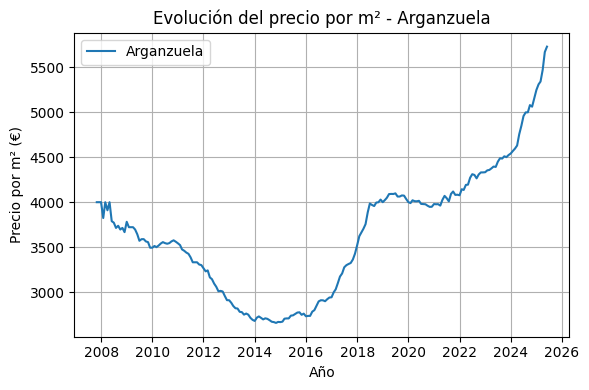

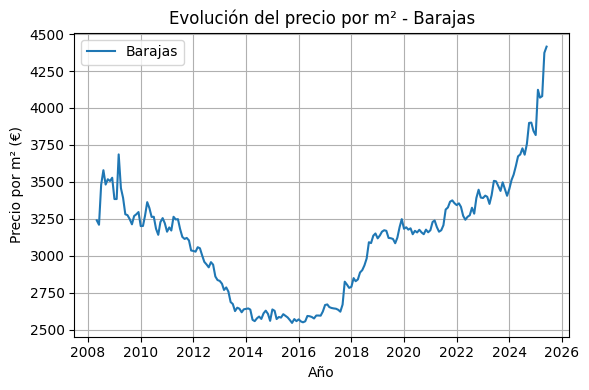

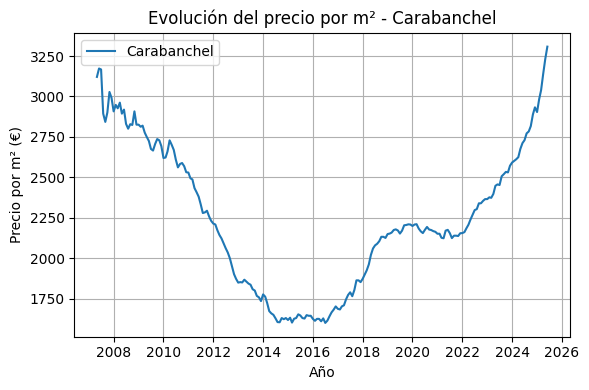

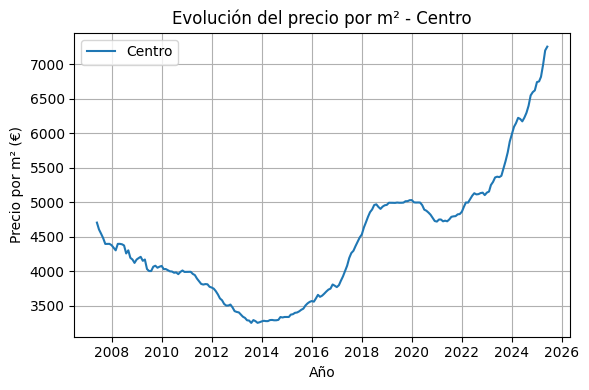

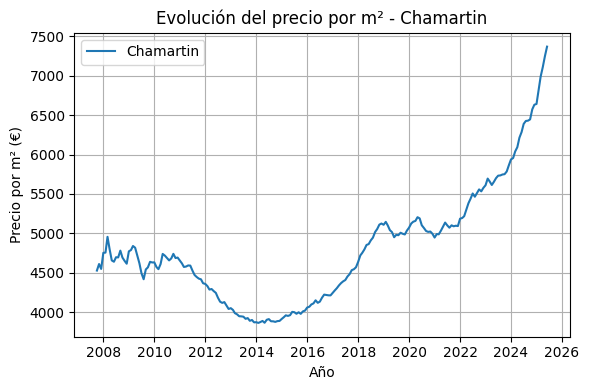

...

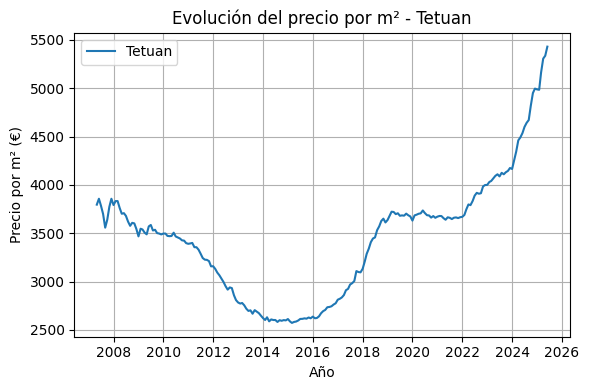

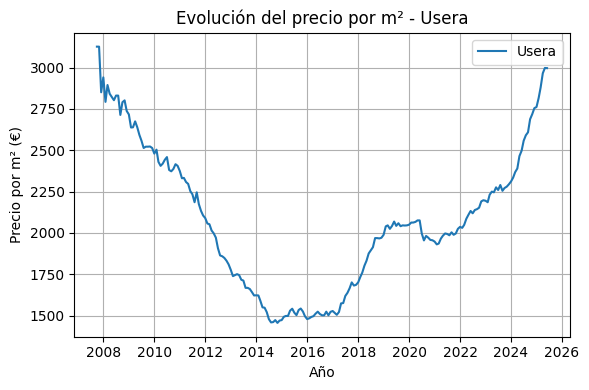

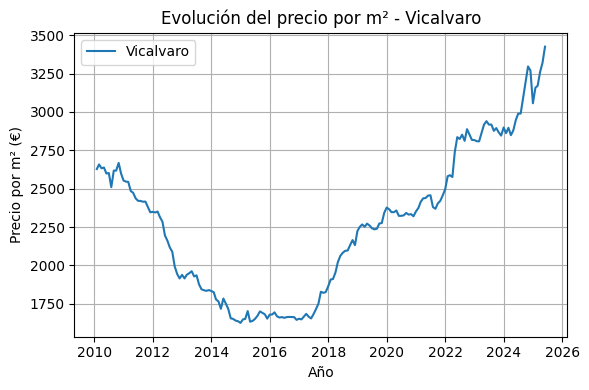

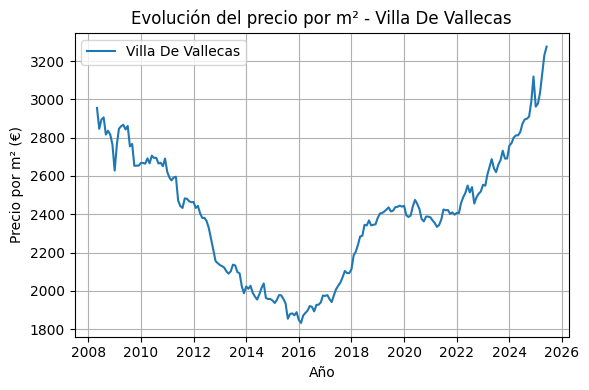

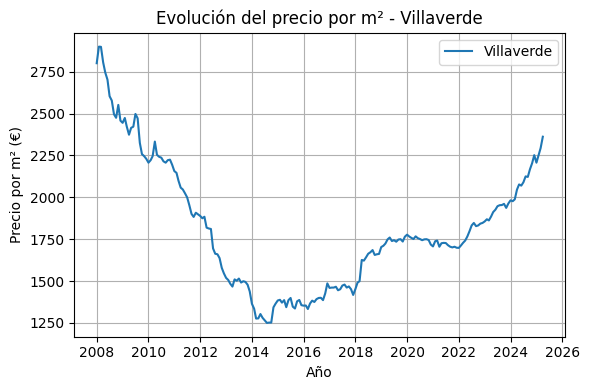

In [17]:
import matplotlib.pyplot as plt

# Ajustar tamaño global de las figuras
plt.rcParams["figure.figsize"] = (6, 4)

# Lista de nombres de tus DataFrames
nombres_distritos = [
    'df_arganzuela', 'df_barajas', 'df_carabanchel', 'df_centro', 'df_chamartin',
    'df_chamberi', 'df_ciudad_lineal', 'df_fuencarral', 'df_hortaleza', 'df_latina',
    'df_moncloa', 'df_moratalaz', 'df_puente_de_vallecas', 'df_retiro', 'df_salamanca',
    'df_san_blas', 'df_tetuan', 'df_usera', 'df_vicalvaro', 'df_villa_de_vallecas', 'df_villaverde'
]

# Bucle para graficar cada uno
for nombre in nombres_distritos:
    df = globals()[nombre]  # acceder a la variable por su nombre

    plt.figure()
    plt.plot(df.index, df['Precio m2'], label=nombre.replace('df_', '').replace('_', ' ').title())
    plt.title(f"Evolución del precio por m² - {nombre.replace('df_', '').replace('_', ' ').title()}")
    plt.xlabel("Año")
    plt.ylabel("Precio por m² (€)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


## Estudio descriptivo - año 2023

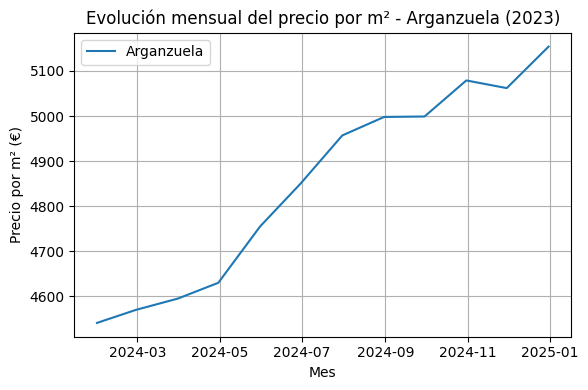

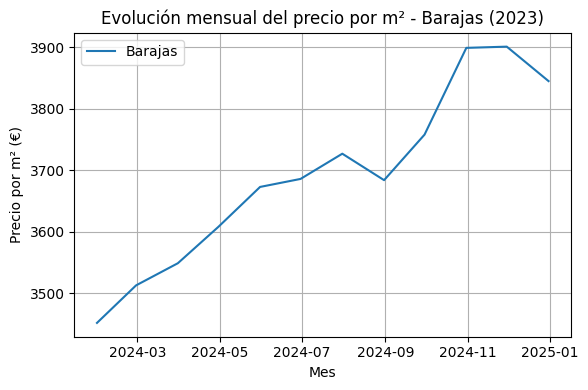

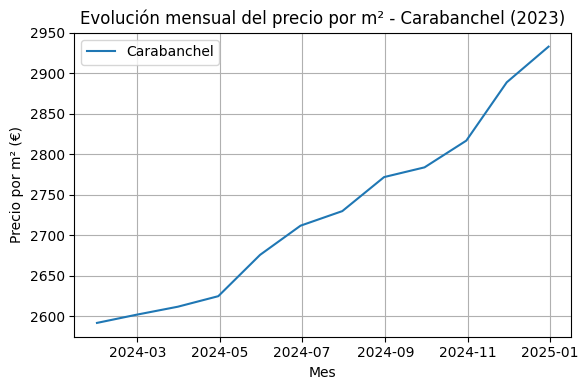

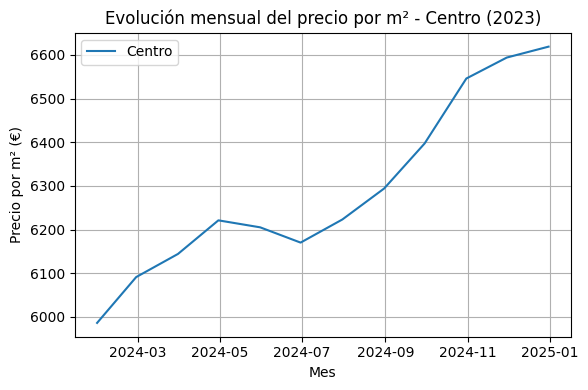

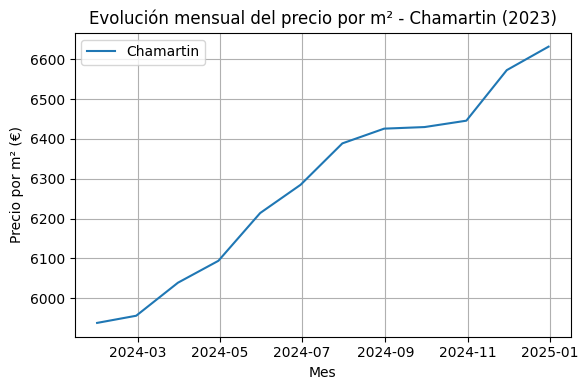

...

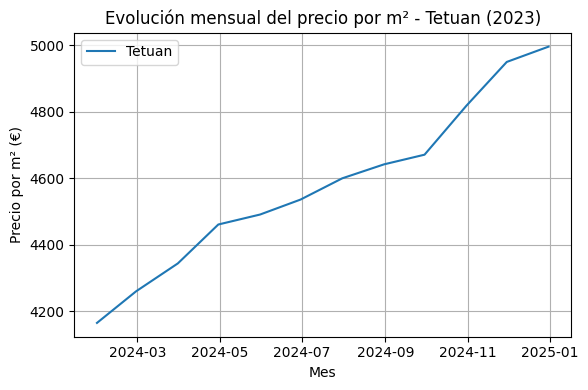

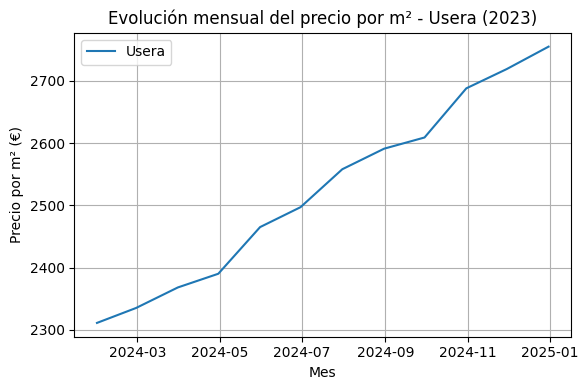

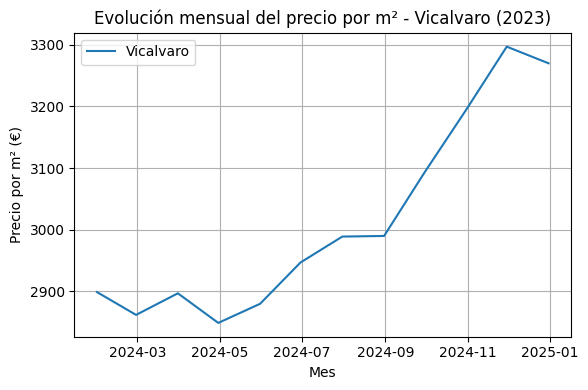

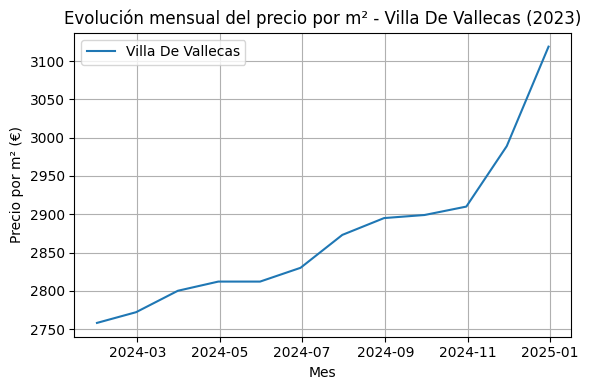

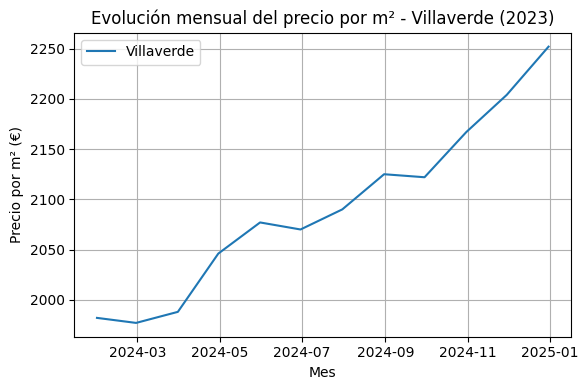

In [116]:
import matplotlib.pyplot as plt
import pandas as pd

# Ajustar tamaño global de las figuras
plt.rcParams["figure.figsize"] = (6, 4)

# Lista de nombres de tus DataFrames
nombres_distritos = [
    'df_arganzuela', 'df_barajas', 'df_carabanchel', 'df_centro', 'df_chamartin',
    'df_chamberi', 'df_ciudad_lineal', 'df_fuencarral', 'df_hortaleza', 'df_latina',
    'df_moncloa', 'df_moratalaz', 'df_puente_de_vallecas', 'df_retiro', 'df_salamanca',
    'df_san_blas', 'df_tetuan', 'df_usera', 'df_vicalvaro', 'df_villa_de_vallecas', 'df_villaverde'
]

# Especificar el año que quieres analizar (2023)
year_to_analyze = 2024

# Bucle para graficar cada uno
for nombre in nombres_distritos:
    df = globals()[nombre]  

    # Asegurar de que el índice esté en formato de fecha
    df.index = pd.to_datetime(df.index)

    # Filtrar por el año 2023
    df_filtered = df[df.index.year == year_to_analyze]

    # Resamplear los datos mensualmente
    df_monthly = df_filtered.resample('ME').mean()

    plt.figure()
    plt.plot(df_monthly.index, df_monthly['Precio m2'], label=nombre.replace('df_', '').replace('_', ' ').title())
    plt.title(f"Evolución mensual del precio por m² - {nombre.replace('df_', '').replace('_', ' ').title()} (2023)")
    plt.xlabel("Mes")
    plt.ylabel("Precio por m² (€)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


## Análisis de tendencia y estacionalidad

### Test ADF

In [88]:
from statsmodels.tsa.stattools import adfuller

# Agrupar por distrito y aplicar el test ADF
for distrito in df_total['Distrito'].unique():
    serie = df_total[df_total['Distrito'] == distrito]['Precio m2'].dropna()
    
    resultado_adf = adfuller(serie)
    print(f'\n📍 Distrito: {distrito}')
    print(f'ADF Statistic: {resultado_adf[0]:.4f}')
    print(f'p-value: {resultado_adf[1]:.4f}')

    if resultado_adf[1] < 0.05:
        print("✅ Estacionaria")
    else:
        print("⚠️ No estacionaria")


📍 Distrito: Arganzuela
ADF Statistic: 0.2644
p-value: 0.9756
⚠️ No estacionaria

📍 Distrito: Barajas
ADF Statistic: 0.6820
p-value: 0.9895
⚠️ No estacionaria

📍 Distrito: Carabanchel
ADF Statistic: -0.0247
p-value: 0.9564
⚠️ No estacionaria

📍 Distrito: Centro
ADF Statistic: 0.7051
p-value: 0.9899
⚠️ No estacionaria

📍 Distrito: Chamartin
ADF Statistic: 4.0783
p-value: 1.0000
⚠️ No estacionaria

📍 Distrito: Chamberi
ADF Statistic: 2.3088
p-value: 0.9990
⚠️ No estacionaria

📍 Distrito: Ciudad Lineal
ADF Statistic: 0.6169
p-value: 0.9880
⚠️ No estacionaria

📍 Distrito: Fuencarral
ADF Statistic: 0.7186
p-value: 0.9902
⚠️ No estacionaria

📍 Distrito: Hortaleza
ADF Statistic: 1.6237
p-value: 0.9979
⚠️ No estacionaria

📍 Distrito: Latina
ADF Statistic: 0.6390
p-value: 0.9885
⚠️ No estacionaria

📍 Distrito: Moncloa
ADF Statistic: 0.9540
p-value: 0.9938
⚠️ No estacionaria

📍 Distrito: Moratalaz
ADF Statistic: 0.6583
p-value: 0.9890
⚠️ No estacionaria

📍 Distrito: Puente de Vallecas
ADF Statis

Se aplicó el test de Dickey-Fuller aumentado (ADF) a las series temporales individuales por distrito. Esto es necesario porque cada distrito presenta dinámicas diferentes de precios, y evaluar la estacionariedad global podría enmascarar comportamientos locales relevantes.

Aunque la serie temporal muestra una estacionalidad clara y consistente, el test estadístico ADF indica que las series no son estacionarias debido a la presencia de una tendencia a largo plazo. Por tanto, no puede ser modelada directamente con ARIMA sin diferenciación previa, y es más adecuado usar modelos como SARIMA o Holt-Winters, que incorporan la estacionalidad y la tendencia explícitamente.

## Gráficos ACF y PACF

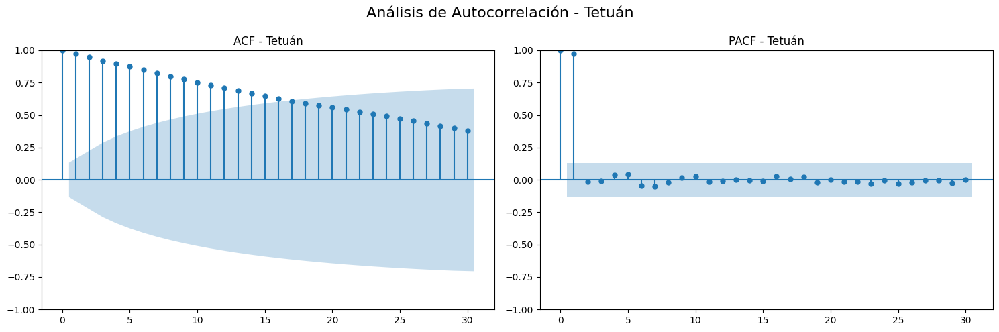

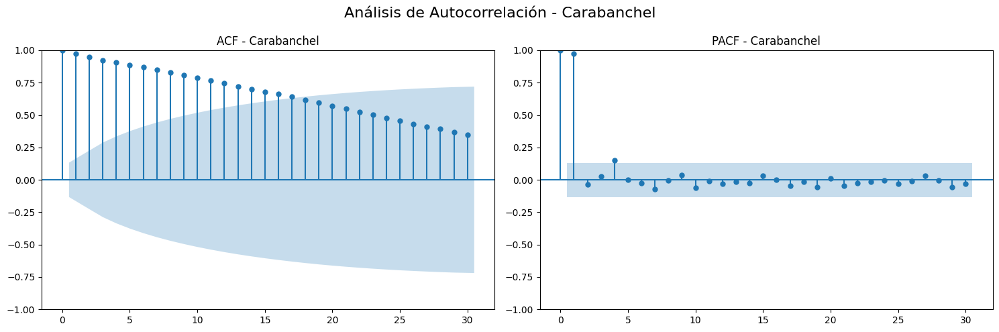

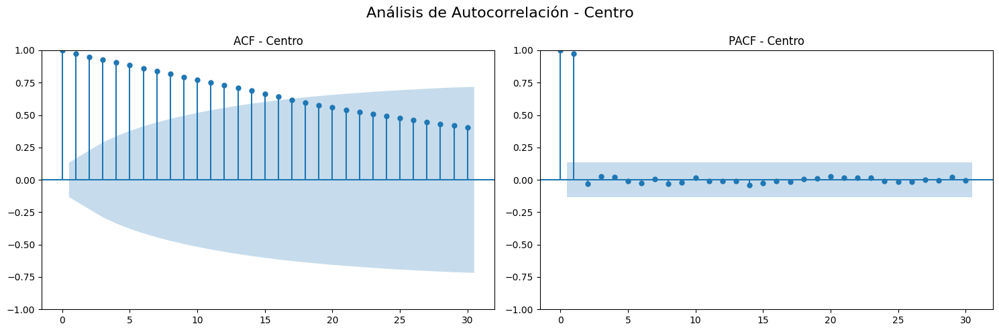

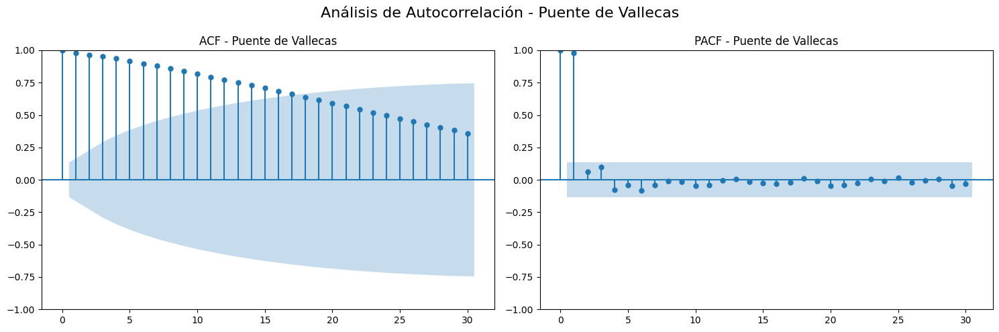

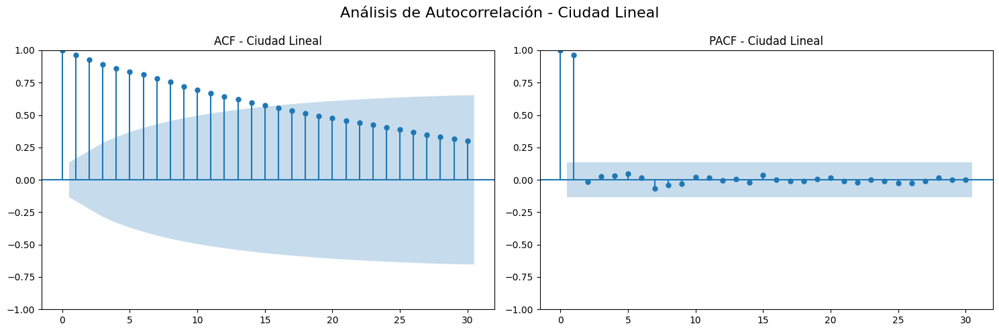

...

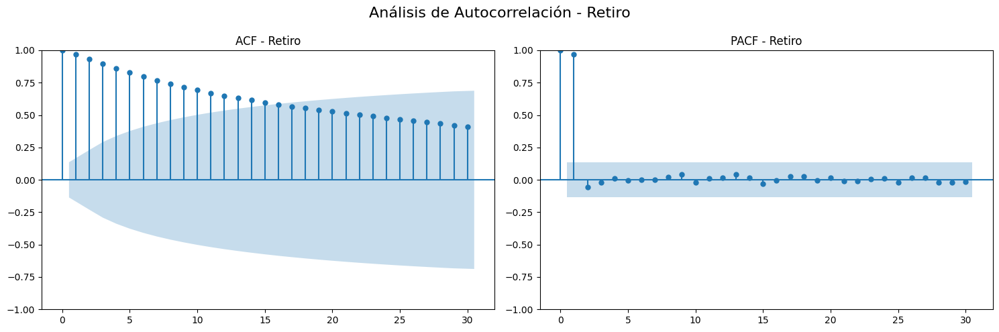

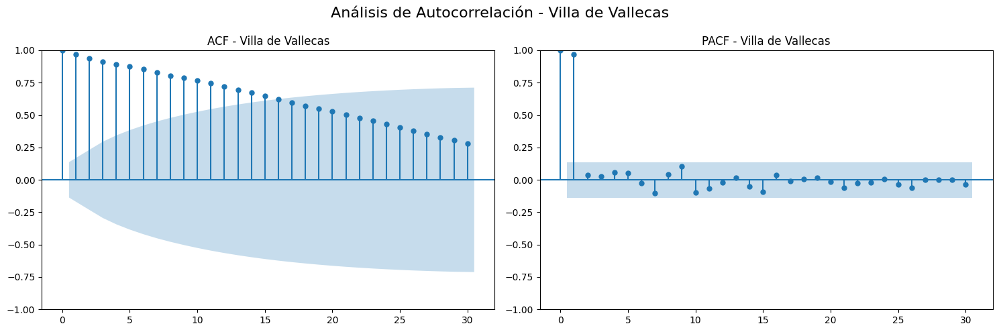

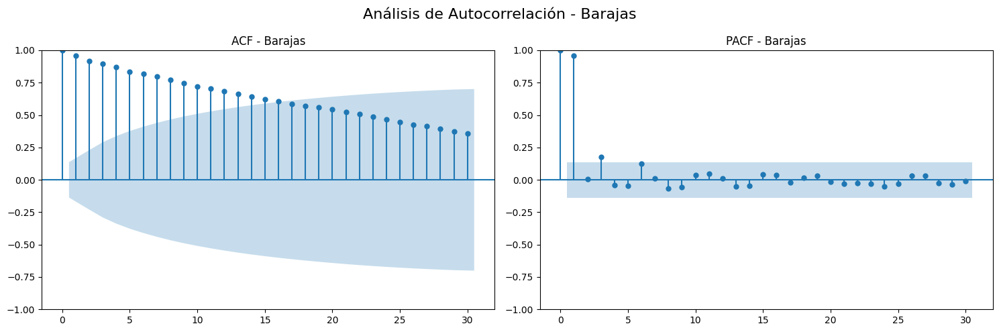

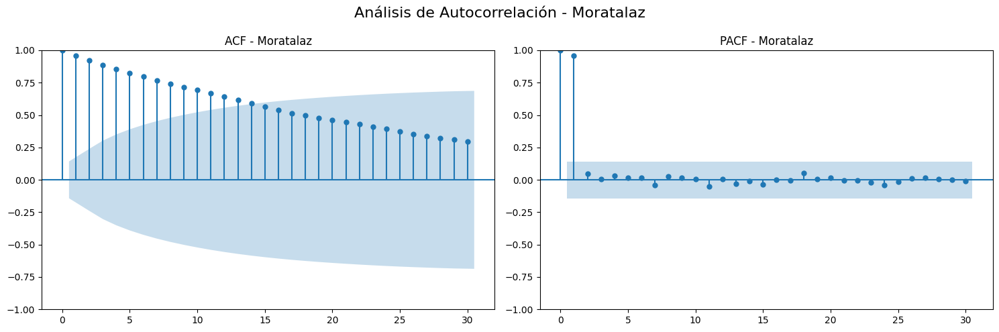

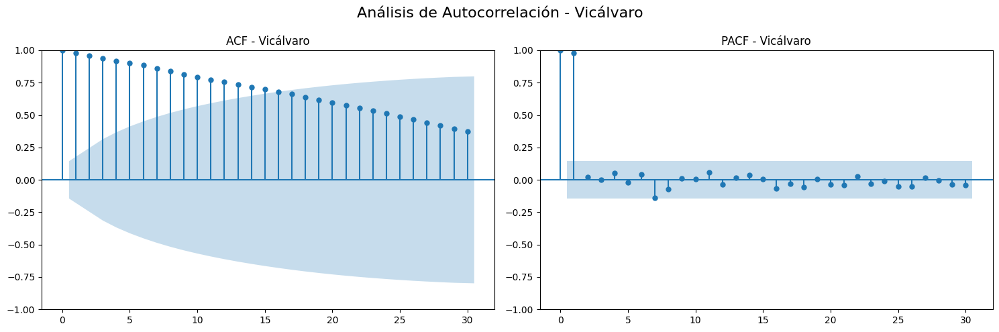

In [18]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Lista de distritos únicos
distritos = df_total['Distrito'].unique()

# Generar ACF y PACF para cada distrito
for distrito in distritos:
    # Filtrar serie por distrito
    serie = df_total[df_total['Distrito'] == distrito].copy()
    serie = serie['Precio m2'].dropna()

    # Crear figura
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    plot_acf(serie, ax=axes[0], lags=30)
    axes[0].set_title(f'ACF - {distrito}')

    plot_pacf(serie, ax=axes[1], lags=30, method='ywm')
    axes[1].set_title(f'PACF - {distrito}')

    plt.suptitle(f"Análisis de Autocorrelación - {distrito}", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  

    plt.show()

## Test de Ljung-Box

“El test de Ljung-Box aplicado a los residuos de todos los modelos indica ausencia de autocorrelación significativa (p-value > 0.05), por lo que los modelos son adecuados desde este punto de vista.”

## Descomposición aditiva


Descomposición para: Tetuán


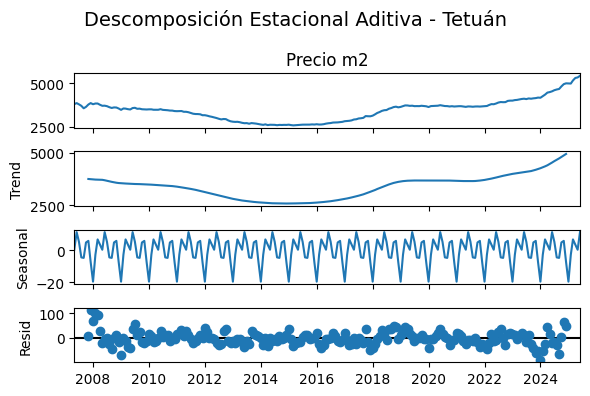


Descomposición para: Carabanchel


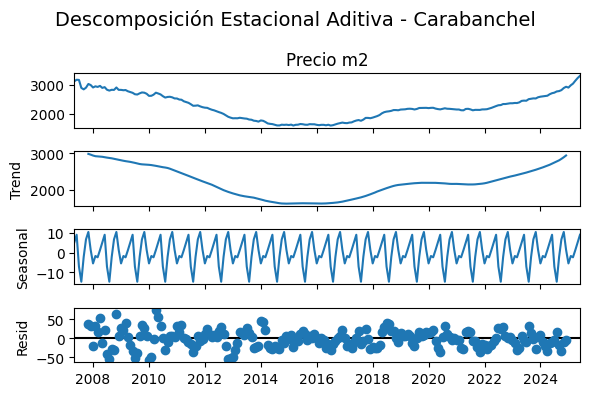


Descomposición para: Centro


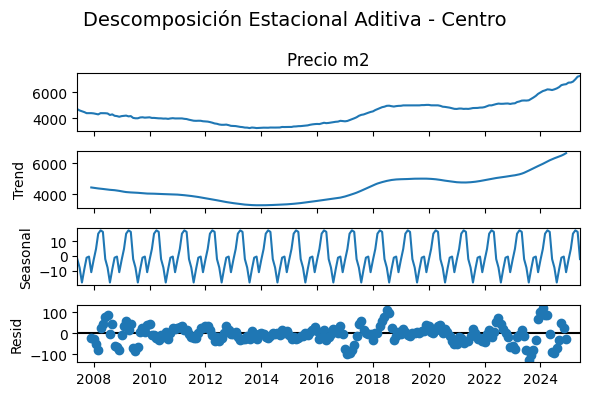


Descomposición para: Puente de Vallecas


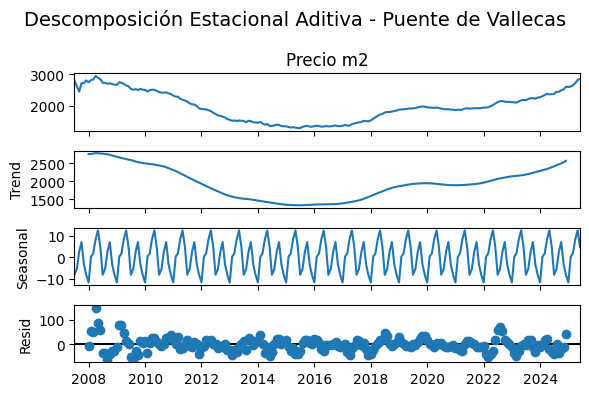


Descomposición para: Ciudad Lineal


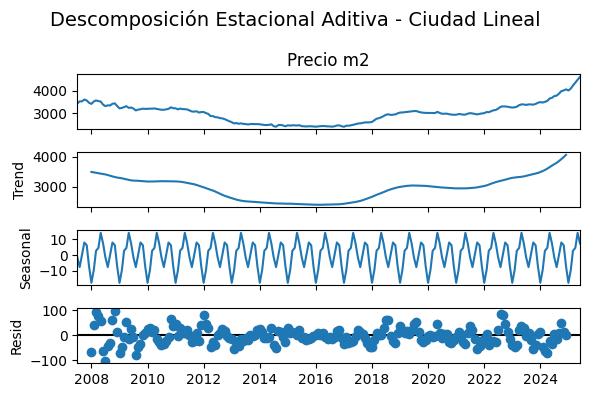


Descomposición para: San Blas


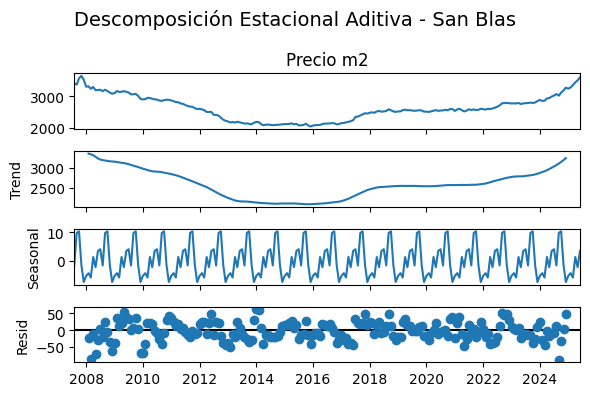


Descomposición para: Moncloa


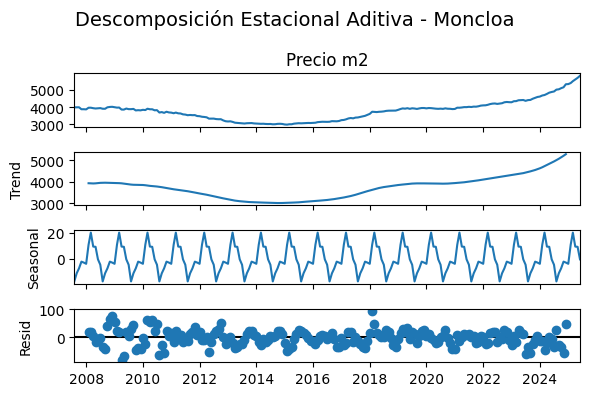


Descomposición para: Fuencarral


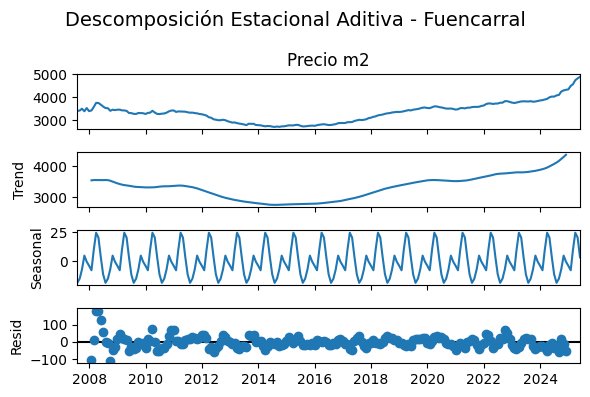


Descomposición para: Hortaleza


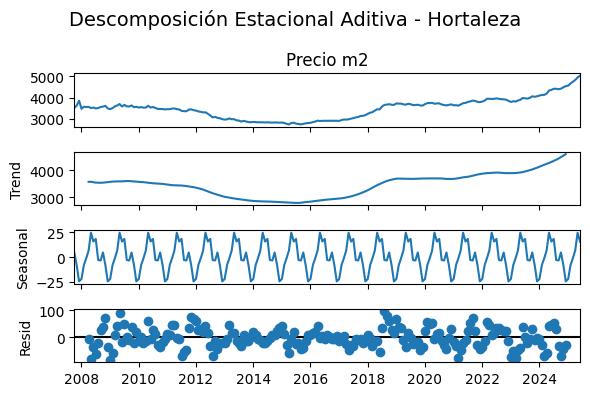


Descomposición para: Chamartín


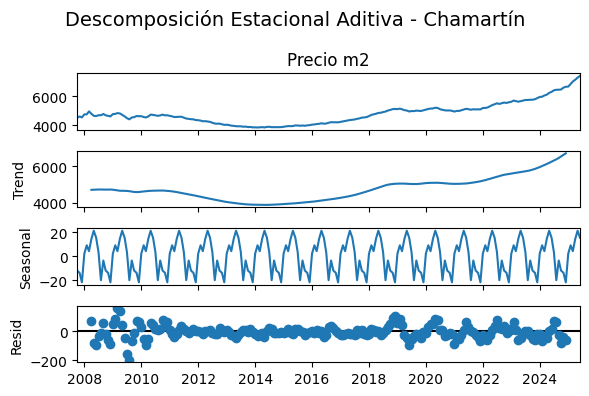


Descomposición para: Usera


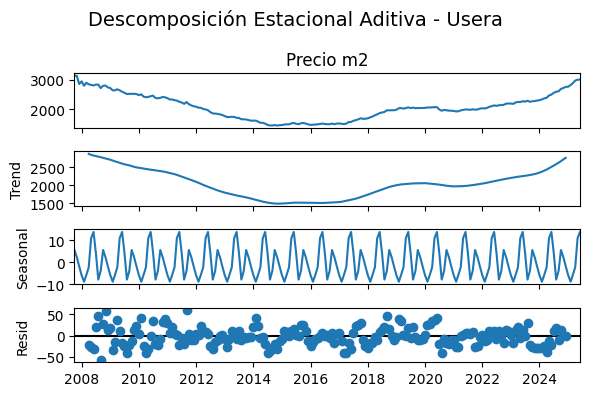


Descomposición para: Salamanca


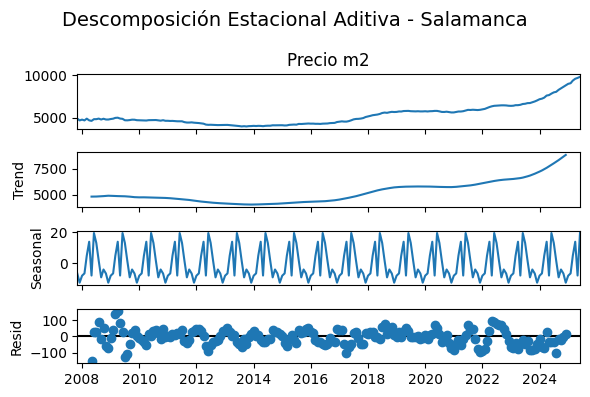


Descomposición para: Latina


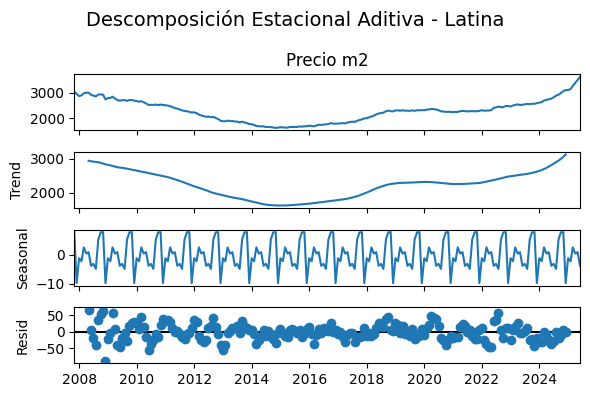


Descomposición para: Arganzuela


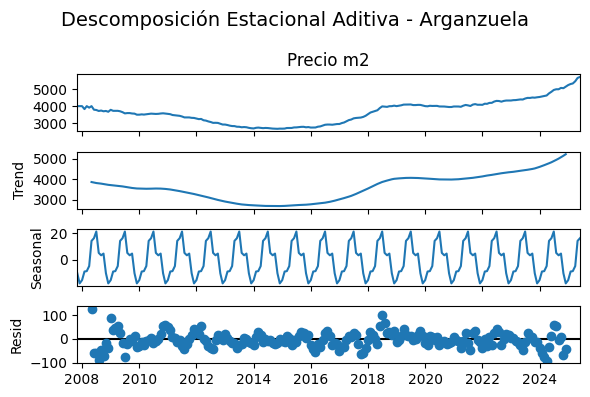


Descomposición para: Villaverde


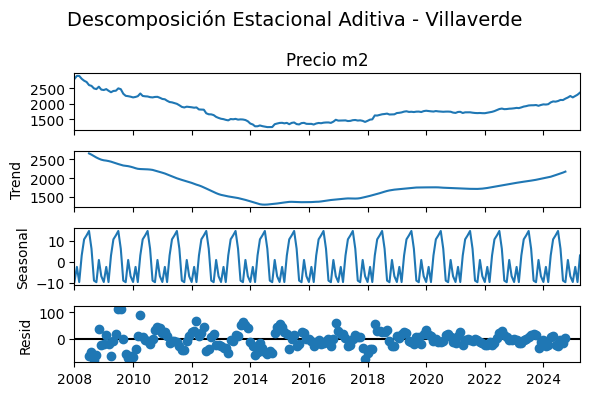


Descomposición para: Chamberí


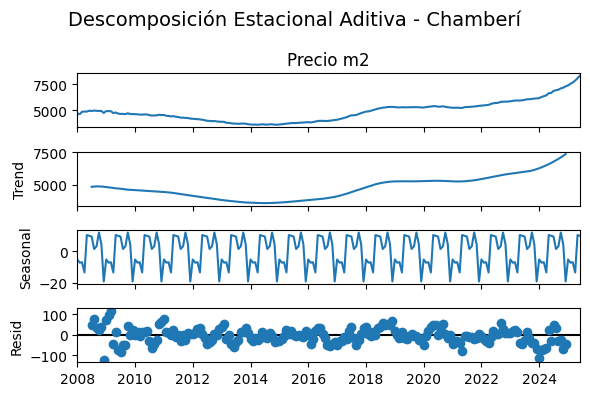


Descomposición para: Retiro


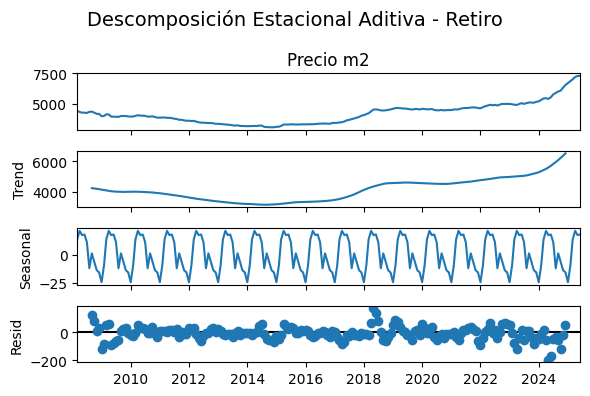


Descomposición para: Villa de Vallecas


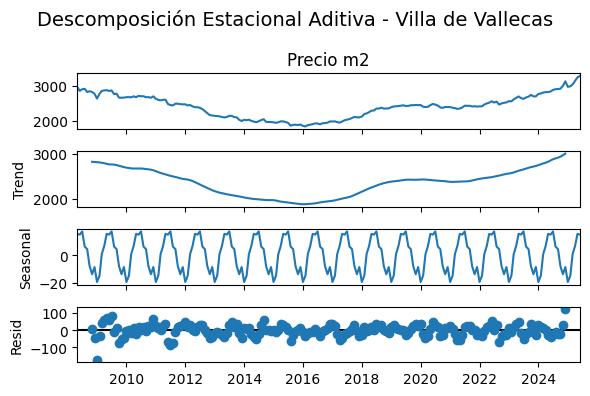


Descomposición para: Barajas


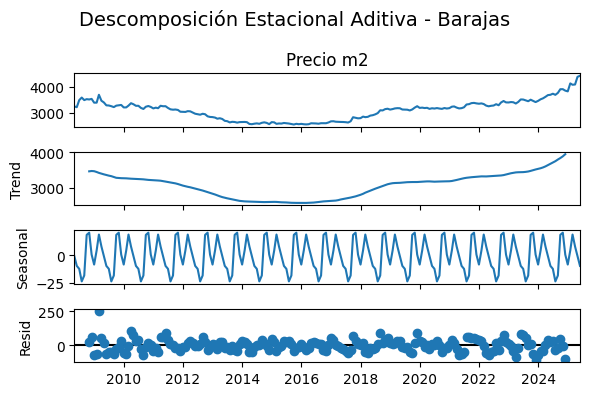


Descomposición para: Moratalaz


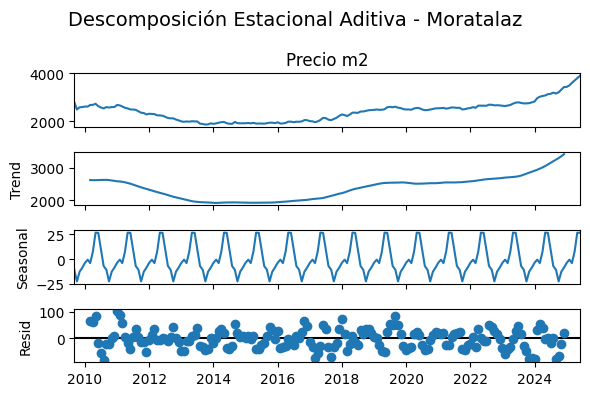


Descomposición para: Vicálvaro


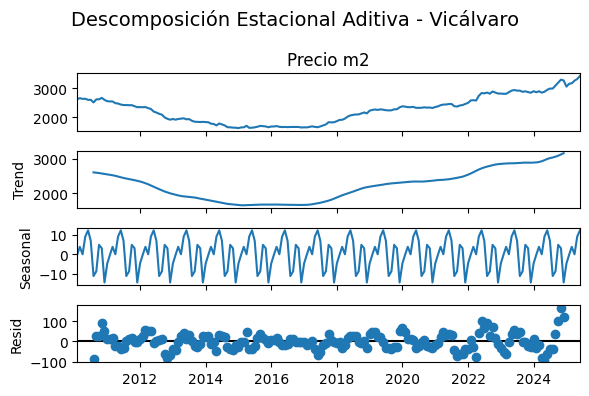

In [19]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Asegurarse de que el índice sea datetime y esté ordenado
df_total.index = pd.to_datetime(df_total.index)
df_total = df_total.sort_index()

# Lista de nombres de distritos
distritos_unicos = df_total['Distrito'].unique()

# Recorrer cada distrito, aplicar descomposición y graficar
for distrito in distritos_unicos:
    serie = df_total[df_total['Distrito'] == distrito]['Precio m2']
    
    # Saltar si hay datos insuficientes
    if len(serie) < 24:  # mínimo recomendado para period=12
        print(f"Saltando {distrito}: datos insuficientes ({len(serie)} registros)")
        continue

    # Aplicar descomposición estacional
    descomposicion = seasonal_decompose(serie, model='additive', period=12)

    # Graficar resultados
    print(f"\nDescomposición para: {distrito}")
    descomposicion.plot()
    plt.suptitle(f'Descomposición Estacional Aditiva - {distrito}', fontsize=14)
    plt.tight_layout()
    plt.show()


## Descomposición multiplicativa


Descomposición para: Tetuán


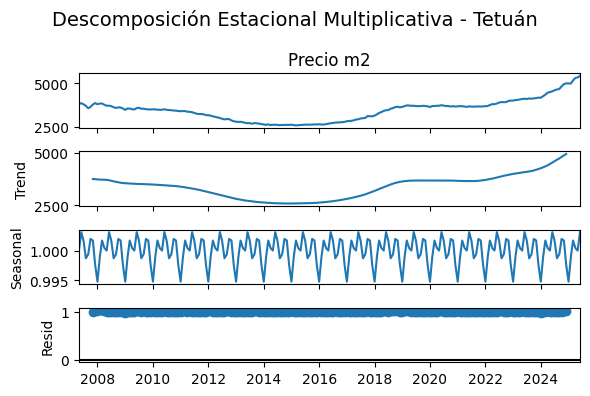


Descomposición para: Carabanchel


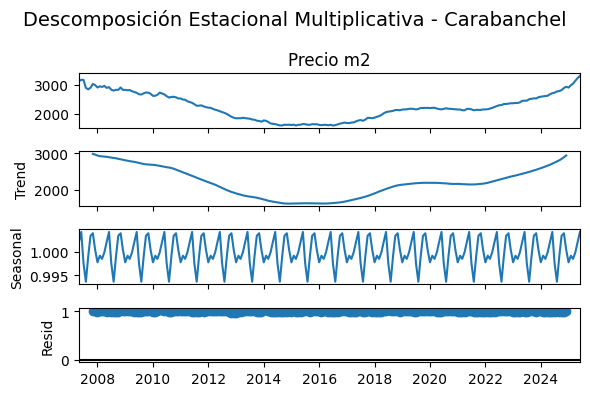


Descomposición para: Centro


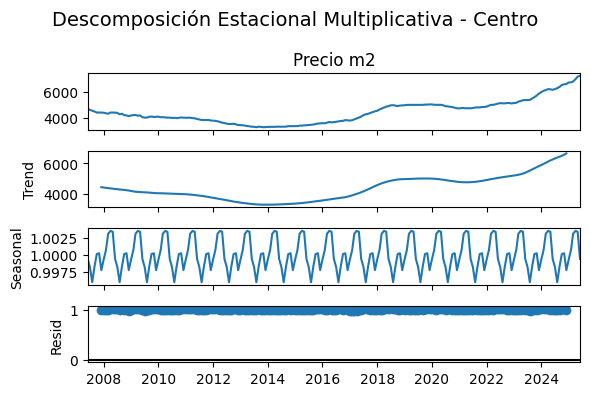


Descomposición para: Puente de Vallecas


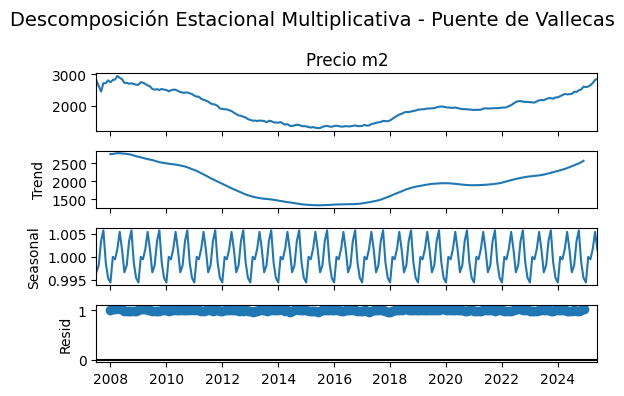


Descomposición para: Ciudad Lineal


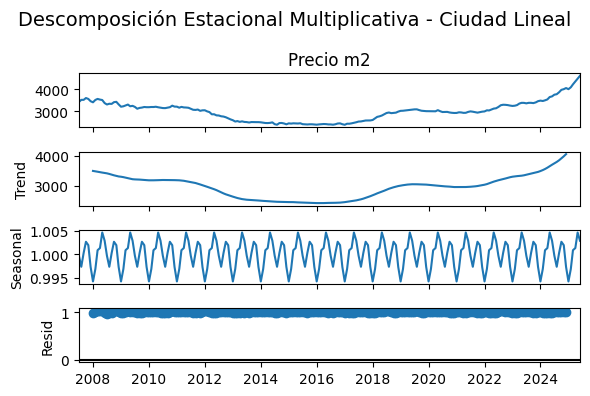


Descomposición para: San Blas


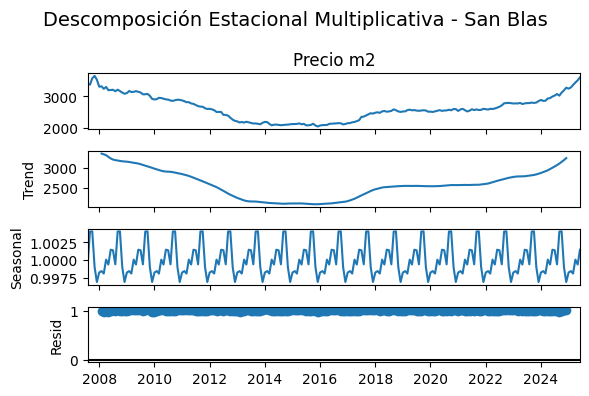


Descomposición para: Moncloa


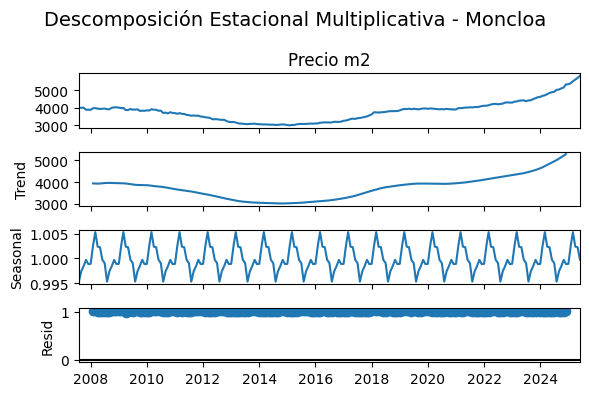


Descomposición para: Fuencarral


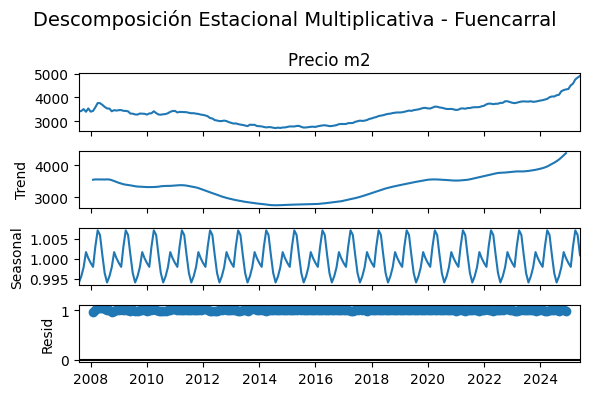


Descomposición para: Hortaleza


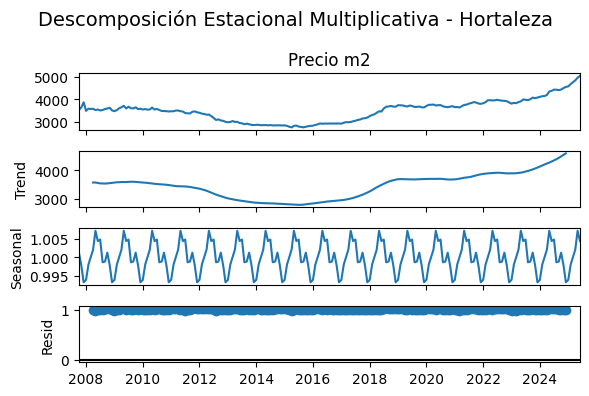


Descomposición para: Chamartín


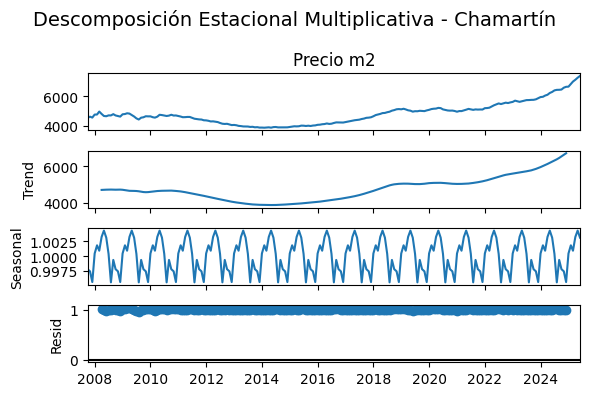


Descomposición para: Usera


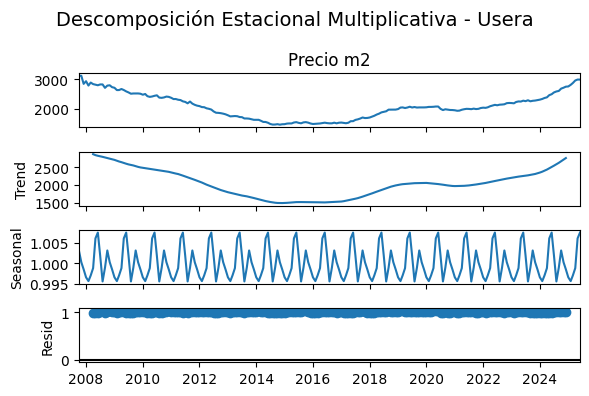


Descomposición para: Salamanca


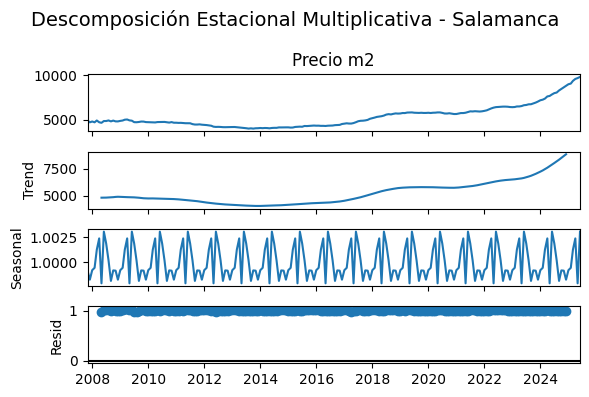


Descomposición para: Latina


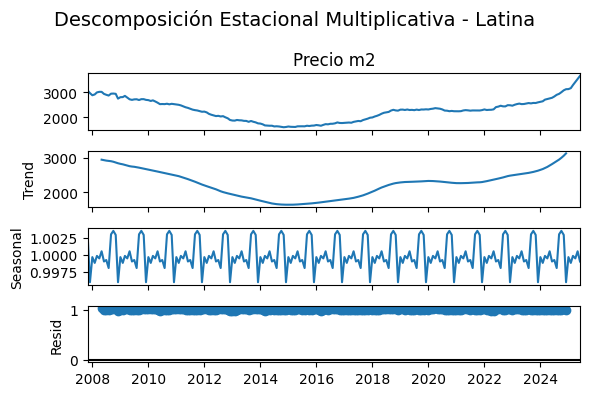


Descomposición para: Arganzuela


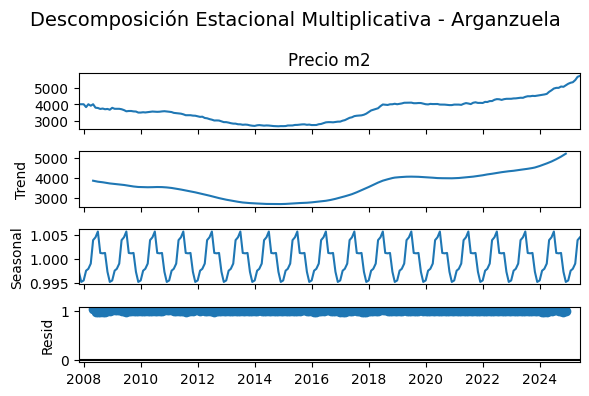


Descomposición para: Villaverde


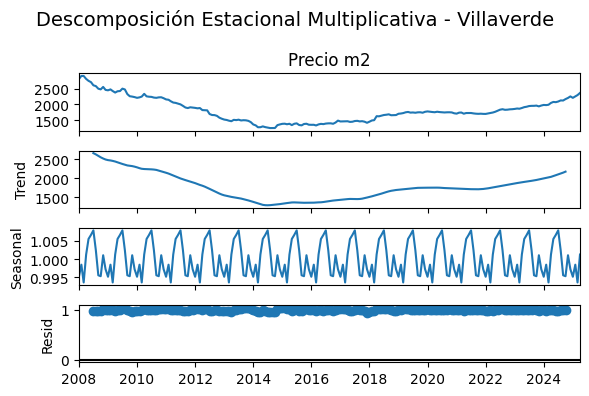


Descomposición para: Chamberí


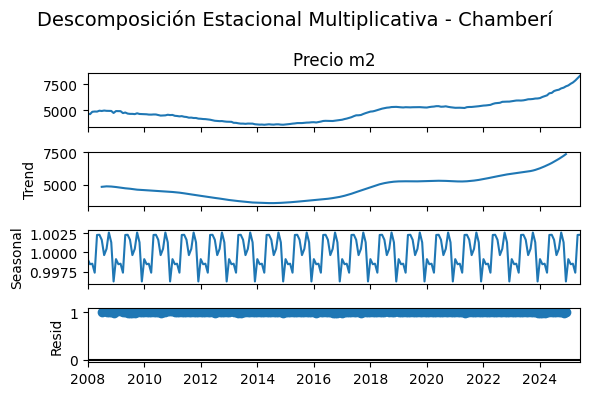


Descomposición para: Retiro


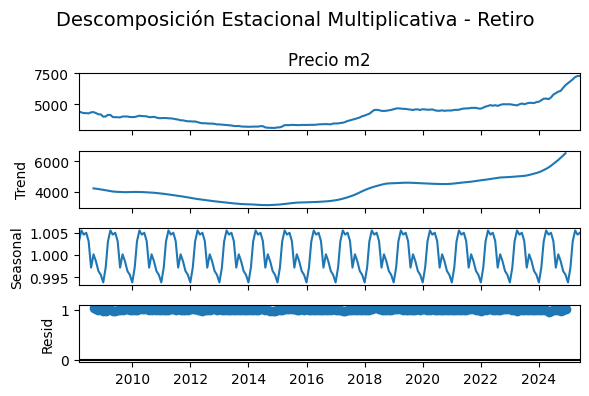


Descomposición para: Villa de Vallecas


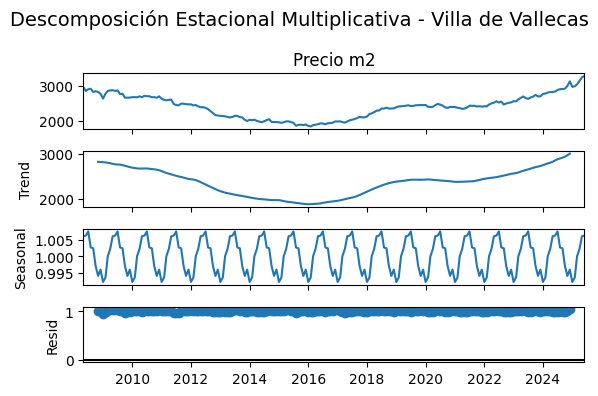


Descomposición para: Barajas


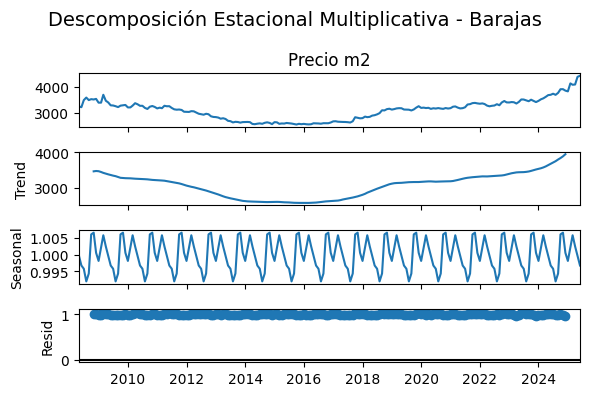


Descomposición para: Moratalaz


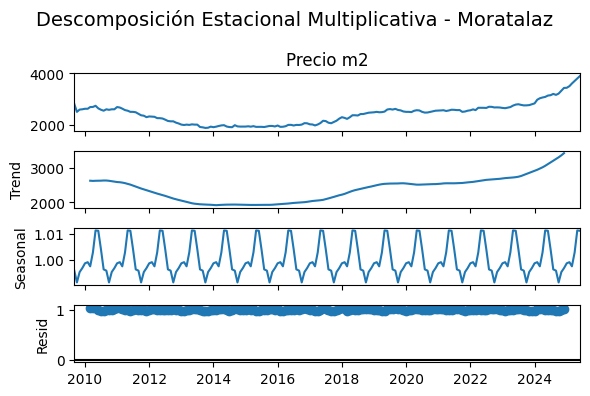


Descomposición para: Vicálvaro


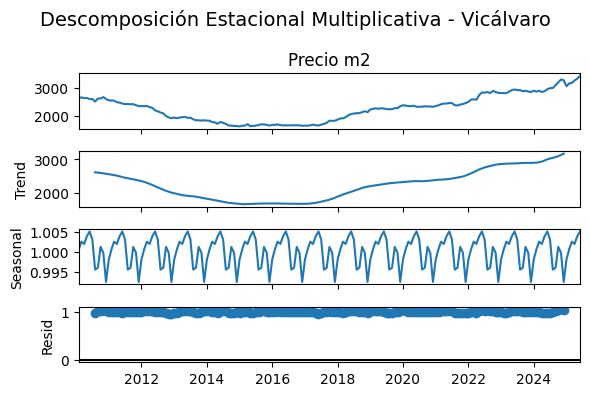

In [20]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Asegurarse de que el índice sea datetime y esté ordenado
df_total.index = pd.to_datetime(df_total.index)
df_total = df_total.sort_index()

# Lista de nombres de distritos
distritos_unicos = df_total['Distrito'].unique()

# Recorrer cada distrito, aplicar descomposición y graficar
for distrito in distritos_unicos:
    serie = df_total[df_total['Distrito'] == distrito]['Precio m2']
    
    # Saltar si hay datos insuficientes
    if len(serie) < 24:  # mínimo recomendado para period=12
        print(f"Saltando {distrito}: datos insuficientes ({len(serie)} registros)")
        continue

    # Aplicar descomposición estacional
    descomposicion = seasonal_decompose(serie, model='multiplicative', period=12)

    # Graficar resultados
    print(f"\nDescomposición para: {distrito}")
    descomposicion.plot()
    plt.suptitle(f'Descomposición Estacional Multiplicativa - {distrito}', fontsize=14)
    plt.tight_layout()
    plt.show()

## 1. Holt-Winters Aditivo (Exponential Smoothing)

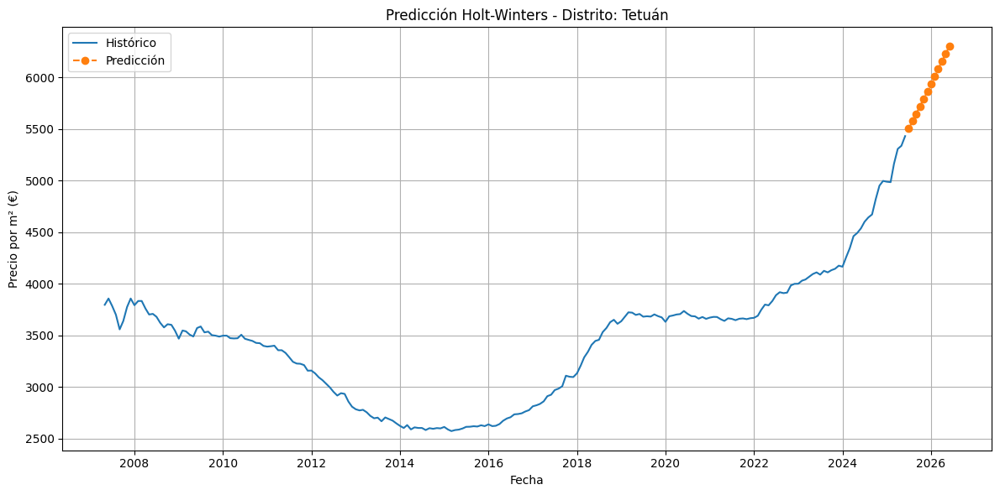

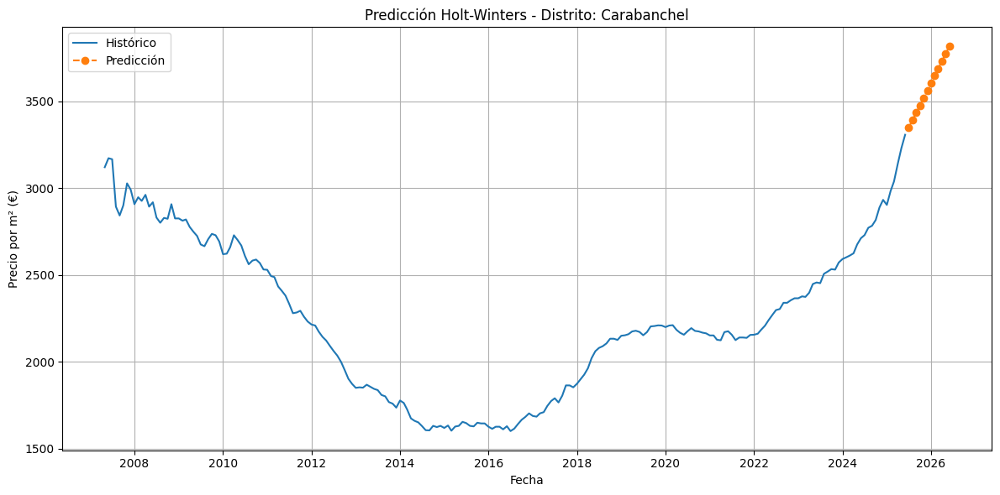

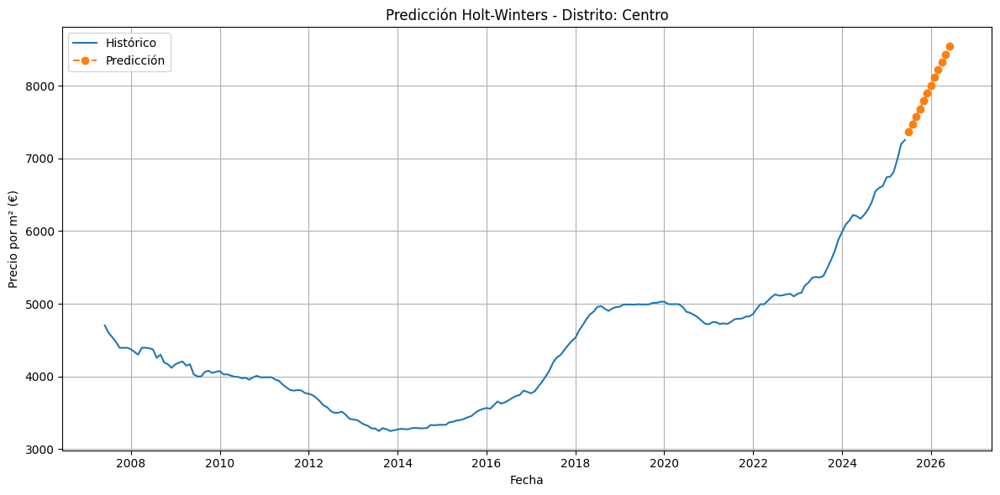

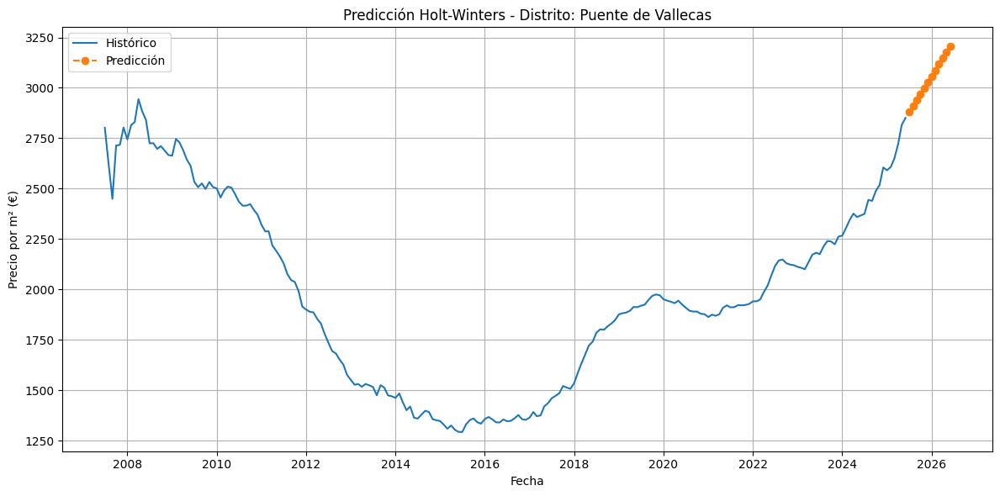

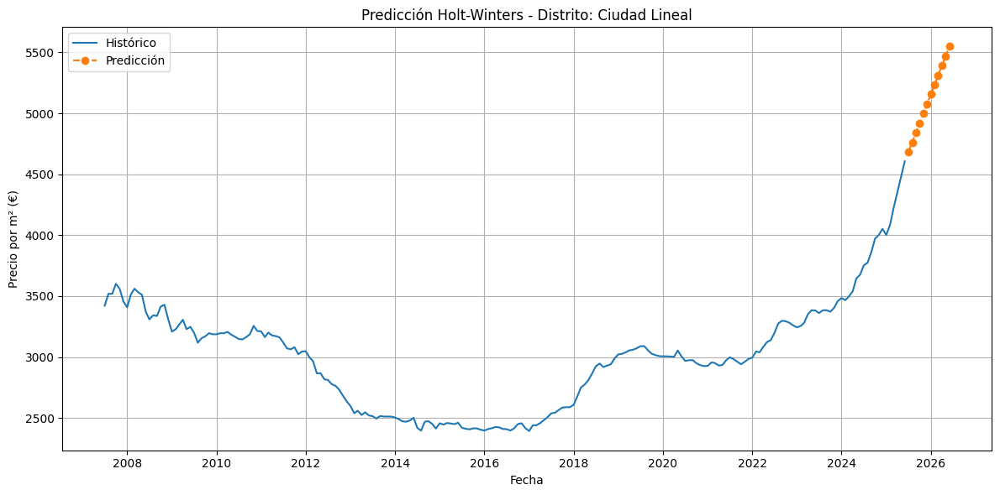

...

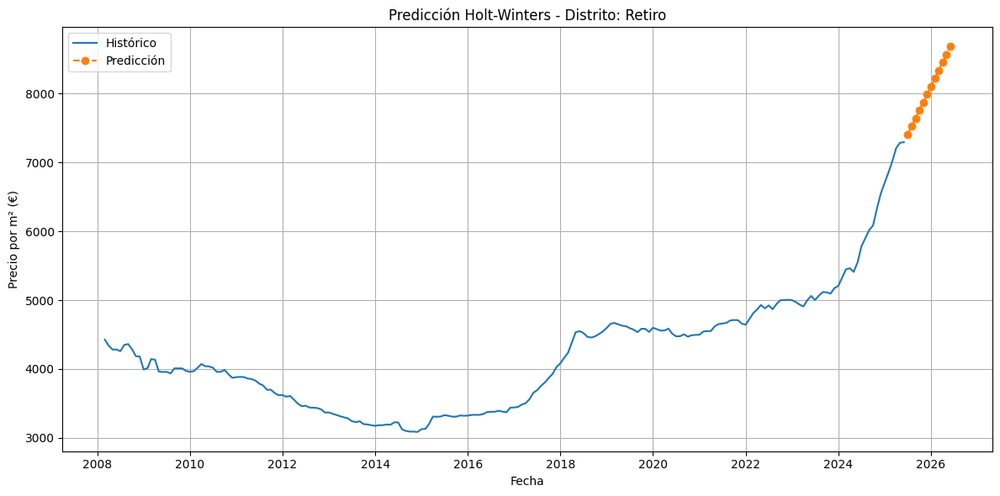

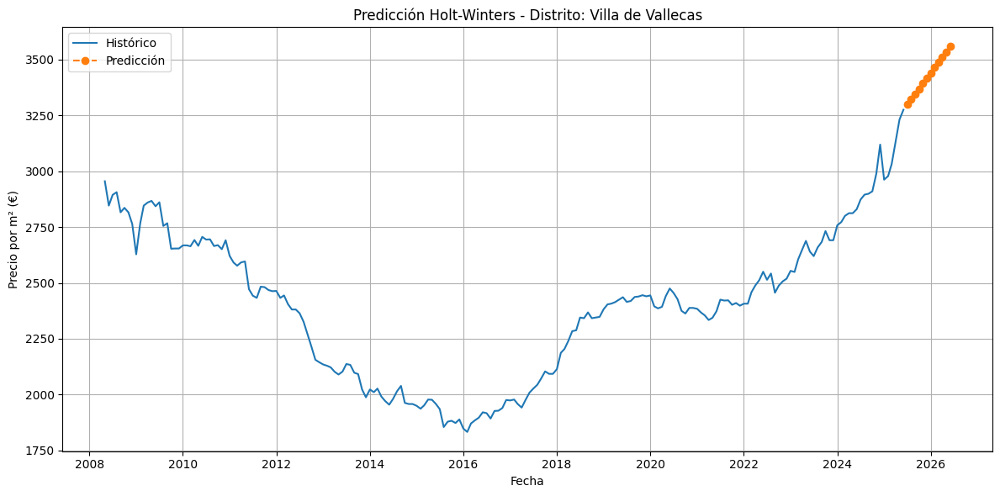

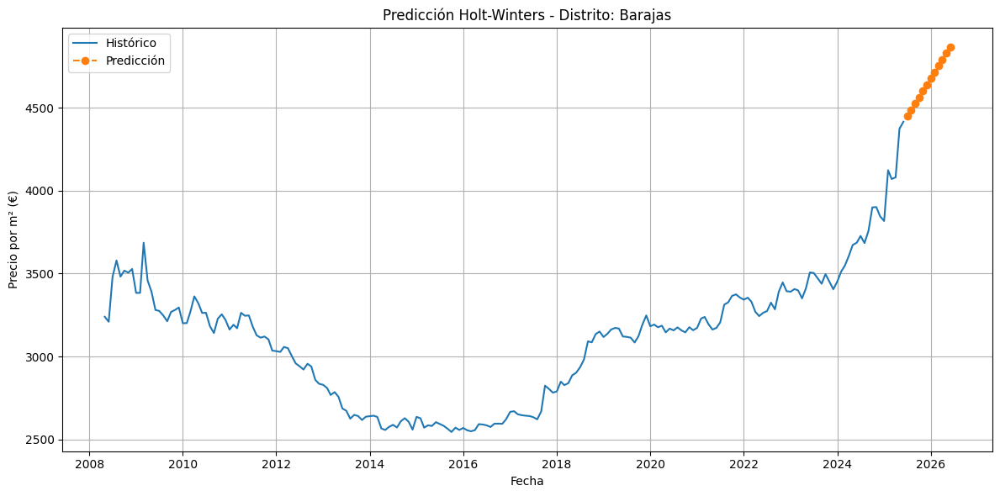

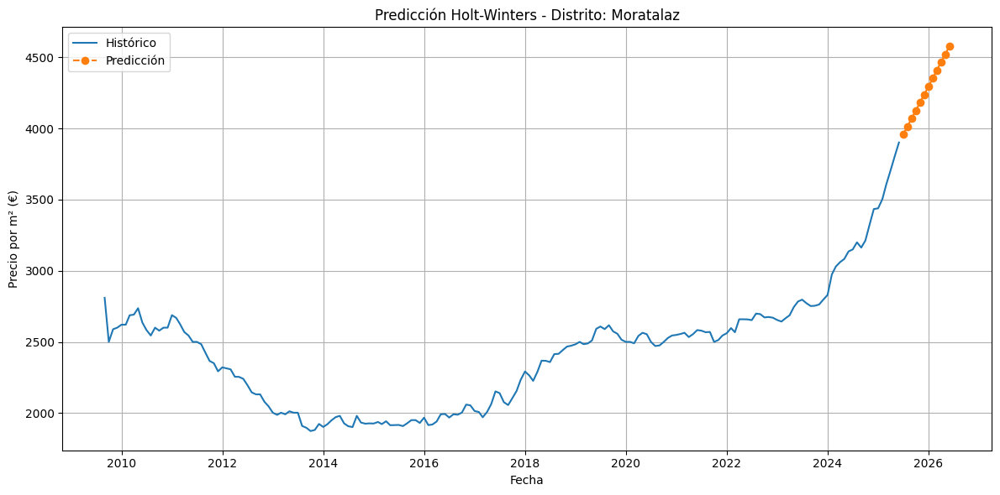

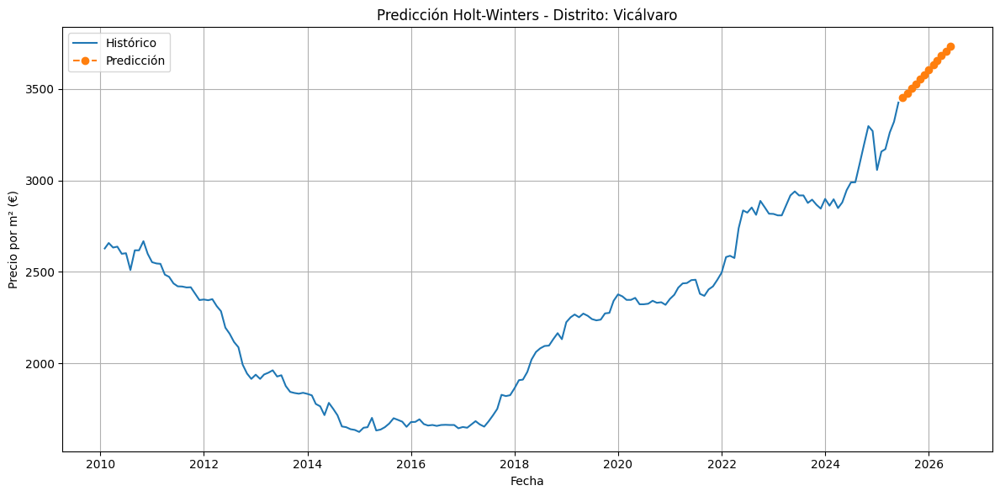

In [24]:
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import pandas as pd

# Lista para acumular todas las predicciones
predicciones_todos = []

# Iterar por distritos
distritos = df_total['Distrito'].unique()

for distrito in distritos:
    serie = df_total[df_total['Distrito'] == distrito]['Precio m2'].asfreq('MS')
    serie = serie.dropna()

    if len(serie) < 24:
        continue  

    modelo = ExponentialSmoothing(
        serie,
        trend='add',
        seasonal=None,
        initialization_method='estimated'
    ).fit()

    pasos_futuros = 12
    predicciones = modelo.forecast(steps=pasos_futuros)

    # Crear fechas para las predicciones
    ultima_fecha = serie.index[-1]
    fechas_pred = pd.date_range(start=ultima_fecha + pd.DateOffset(months=1),
                                periods=pasos_futuros,
                                freq='MS')
    predicciones.index = fechas_pred

    # Guardar en lista
    for fecha, valor in predicciones.items():
        predicciones_todos.append({
            "Distrito": distrito,
            "Fecha": fecha,
            "Predicción Precio m²": valor
        })

    # Gráfico (opcional)
    plt.figure(figsize=(12, 6))
    plt.plot(serie, label='Histórico')
    plt.plot(predicciones, label='Predicción', linestyle='--', marker='o')
    plt.title(f"Predicción Holt-Winters - Distrito: {distrito}")
    plt.xlabel("Fecha")
    plt.ylabel("Precio por m² (€)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

## Con seasonal = 'add'

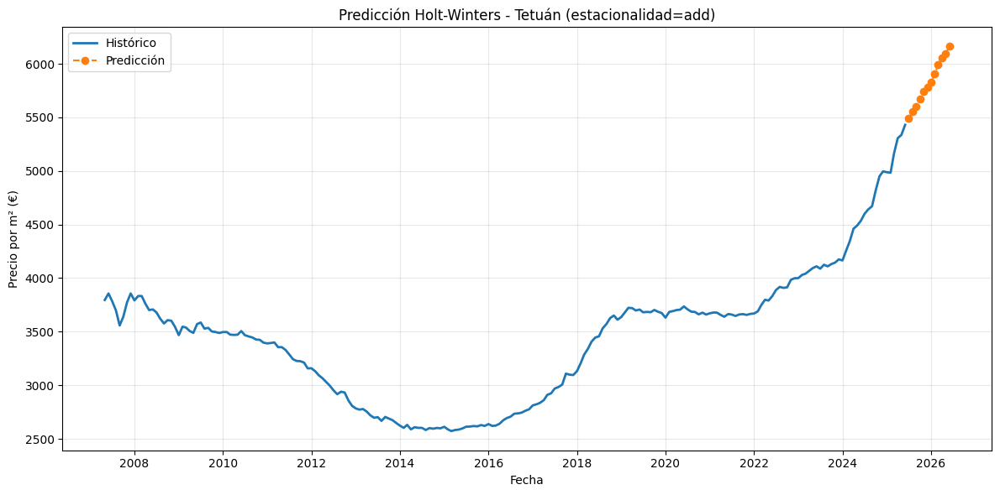

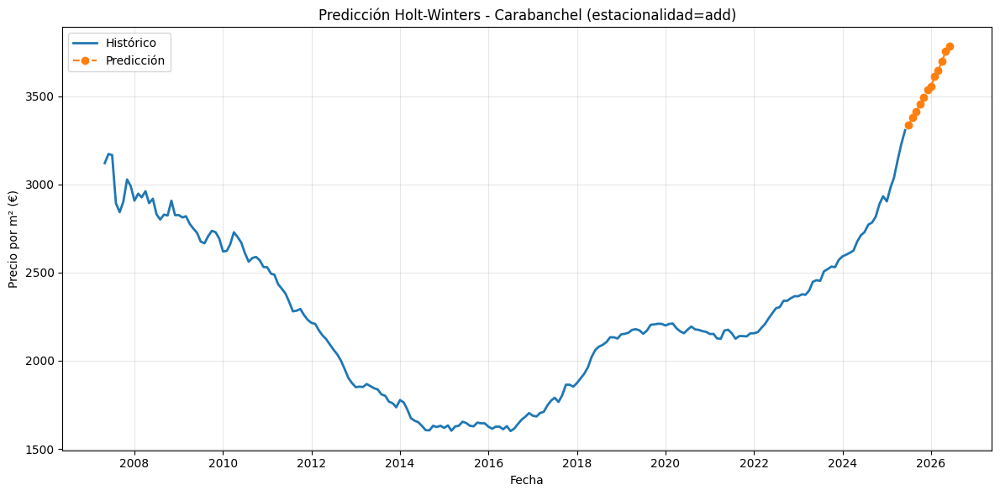

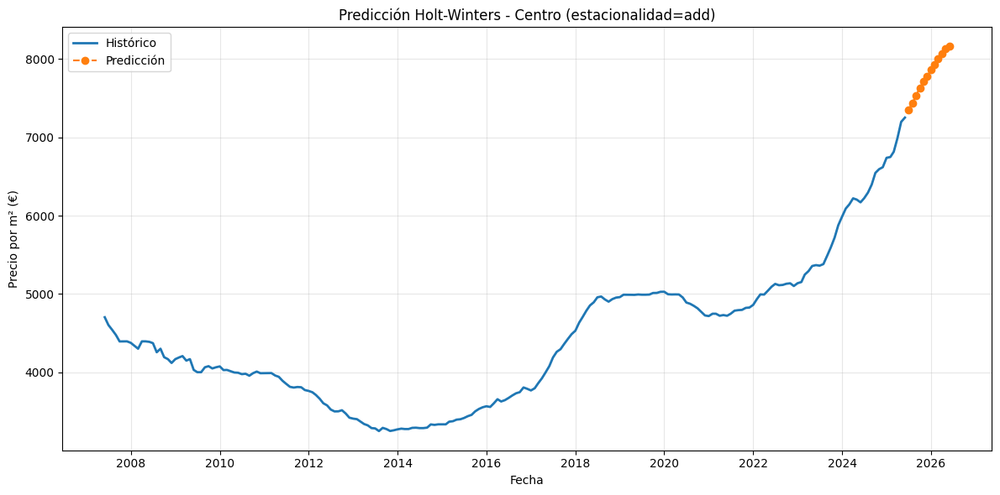

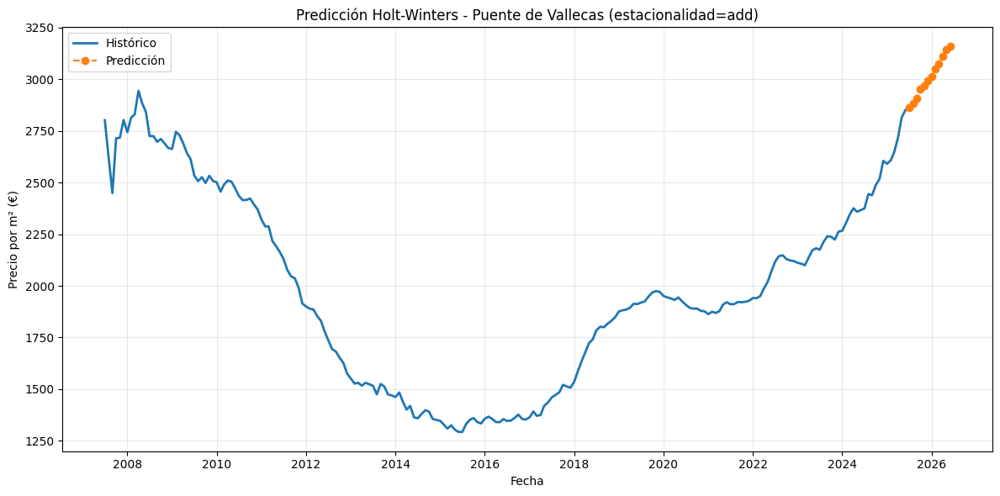

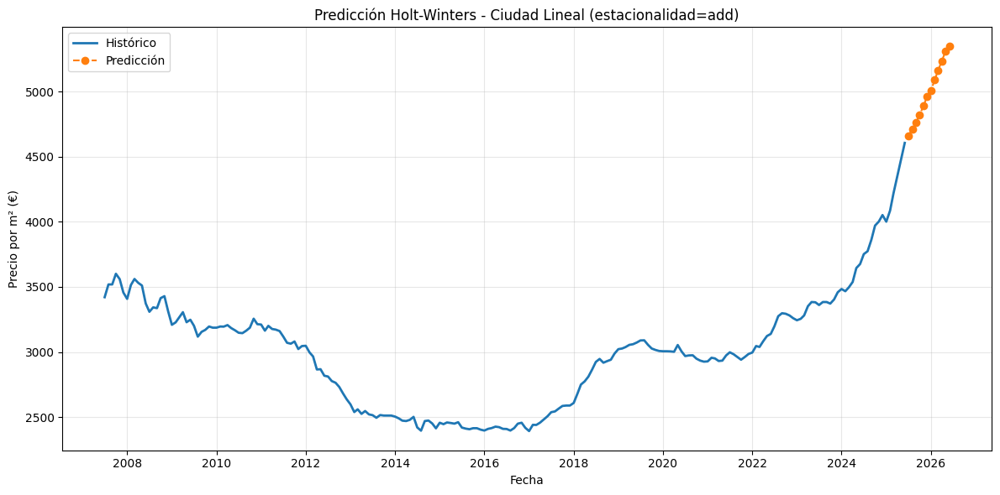

...

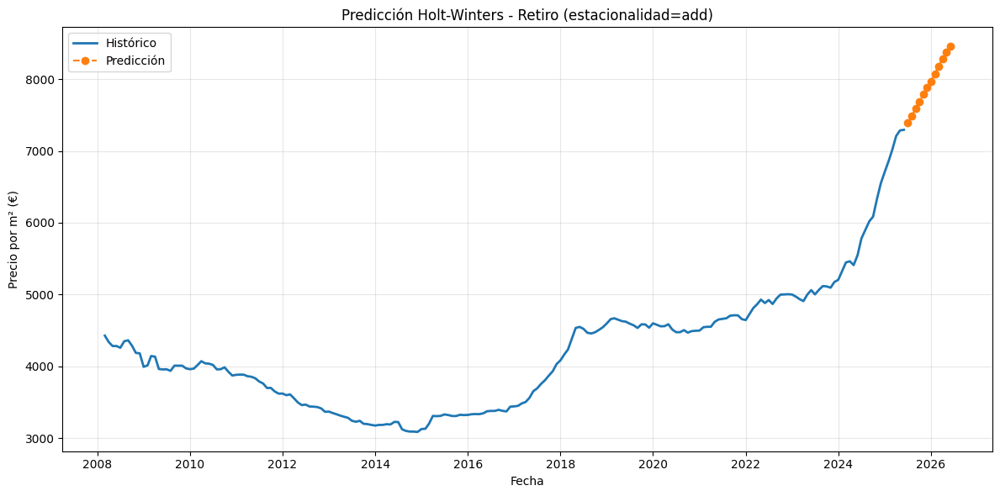

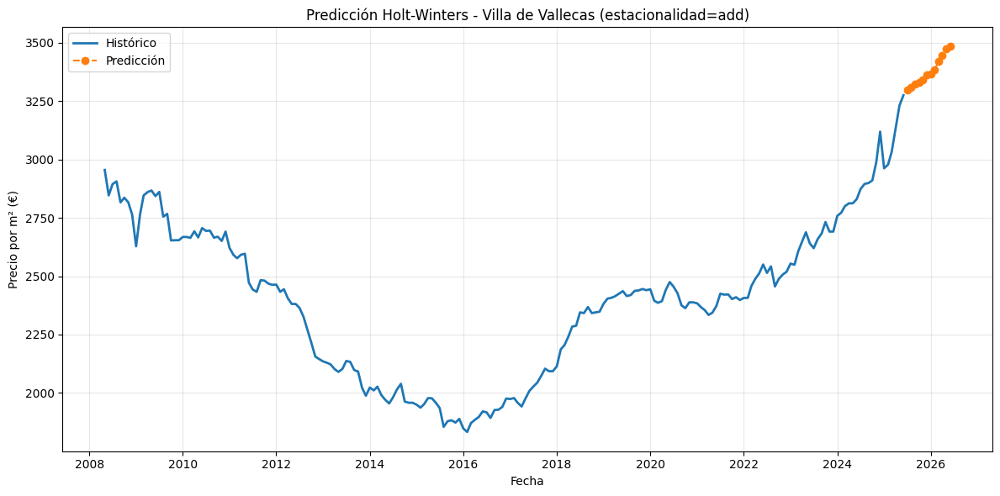

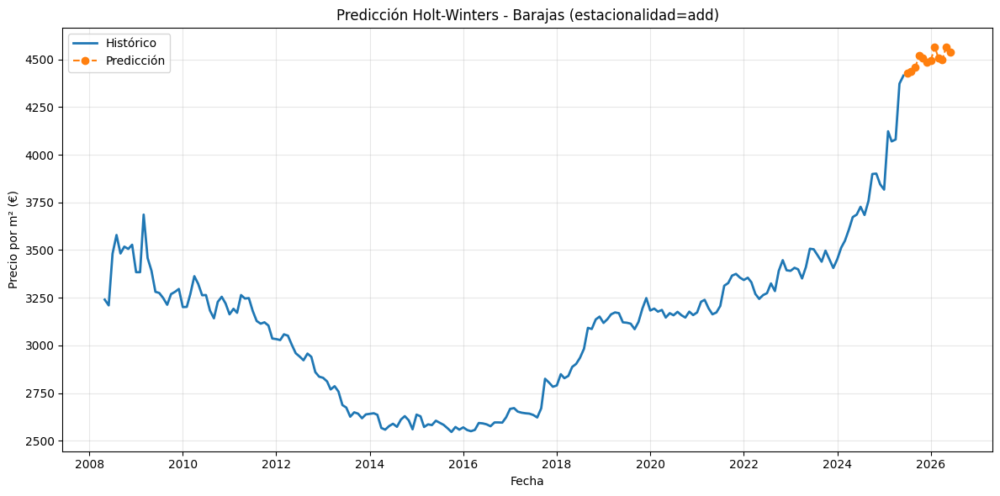

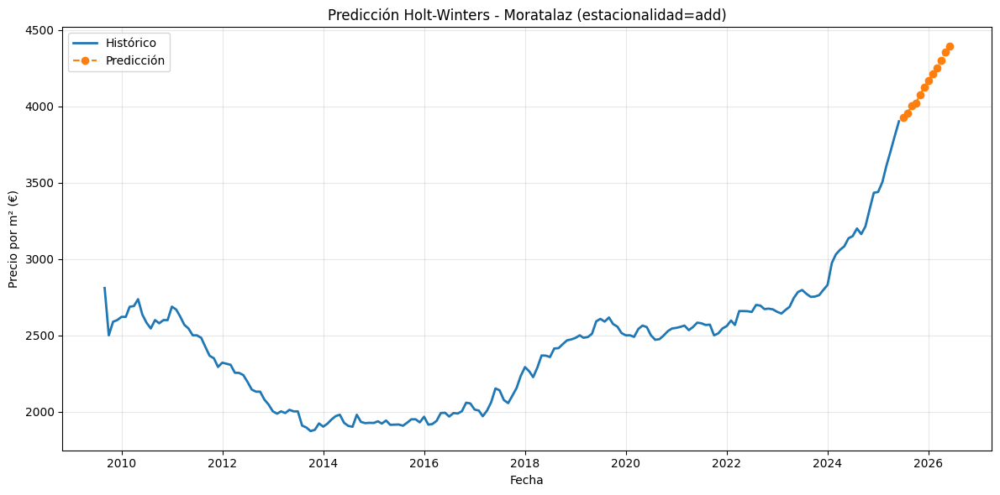

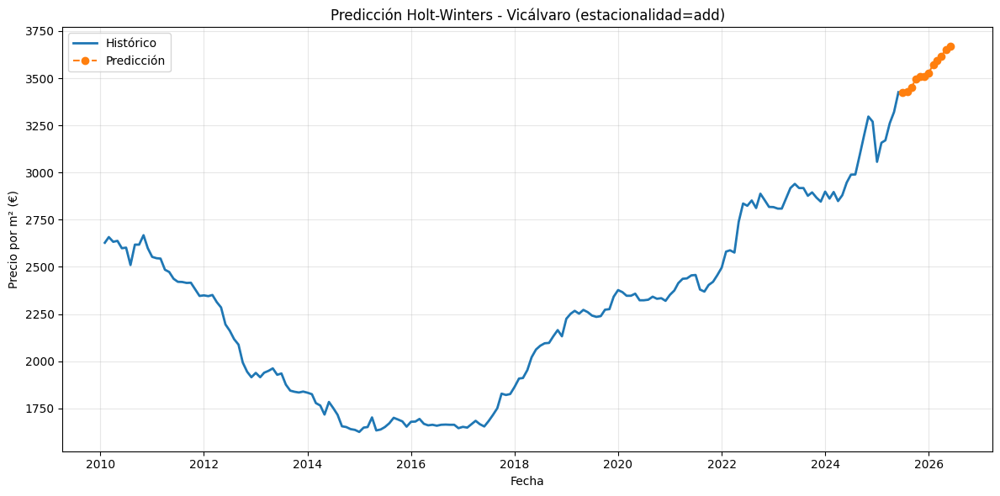

In [69]:
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import pandas as pd

# Lista para acumular todas las predicciones
predicciones_todos1 = []

# Parámetros
pasos_futuros = 12
min_obs = 36  # mínimo 3 años de datos para captar bien la estacionalidad

# Iterar por distritos
for distrito in df_total['Distrito'].unique():
    serie = df_total[df_total['Distrito'] == distrito]['Precio m2']

    # Asegurar frecuencia mensual y rellenar huecos si hay
    serie = serie.asfreq('MS').interpolate('time').dropna()

    if len(serie) < min_obs:
        continue  

    # Escoger tipo de estacionalidad
    seasonal = 'add'

    # Modelo Holt-Winters con estacionalidad mensual
    modelo = ExponentialSmoothing(
        serie,
        trend='add',
        damped_trend=True,
        seasonal=seasonal,
        seasonal_periods=12,
        initialization_method='estimated'
    ).fit(optimized=True)

    # Predicción
    predicciones = modelo.forecast(steps=pasos_futuros)

    # Guardar en lista
    for fecha, valor in predicciones.items():
        predicciones_todos1.append({
            "Distrito": distrito,
            "Fecha": fecha,
            "Predicción Precio m²": valor
        })

    # Gráfico (opcional)
    plt.figure(figsize=(12, 6))
    plt.plot(serie, label='Histórico', linewidth=2)
    plt.plot(predicciones, label='Predicción', linestyle='--', marker='o')
    plt.title(f"Predicción Holt-Winters - {distrito} (estacionalidad={seasonal})")
    plt.xlabel("Fecha")
    plt.ylabel("Precio por m² (€)")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Convertir lista de predicciones a DataFrame
predicciones_holt_winters = pd.DataFrame(predicciones_todos1).sort_values(["Distrito", "Fecha"]).reset_index(drop=True)


In [70]:
# Convertir lista a DataFrame y guardar
df_predicciones = pd.DataFrame(predicciones_todos1)
df_predicciones.to_csv(r"C:\Users\evahr\Downloads\TFM_Series_Temporales\predicciones_holt_winters.csv", index=False, encoding="utf-8-sig")

print("✅ Predicciones guardadas en 'predicciones_holt_winters.csv'")

✅ Predicciones guardadas en 'predicciones_holt_winters.csv'


## Representación de la predicción 

In [71]:
# Leer el archivo
predicciones_holt_winters = pd.read_csv(r"C:\Users\evahr\Downloads\TFM_Series_Temporales\predicciones_holt_winters.csv")

# Mostrar las primeras filas
print(predicciones_holt_winters.head())

  Distrito       Fecha  Predicción Precio m²
0   Tetuán  2025-07-01           5492.610036
1   Tetuán  2025-08-01           5550.175571
2   Tetuán  2025-09-01           5600.363857
3   Tetuán  2025-10-01           5675.018857
4   Tetuán  2025-11-01           5738.403355


C:\Users\evahr\AppData\Local\Temp\ipykernel_11184\1493582036.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("tab20", min(max(n,1), 20))


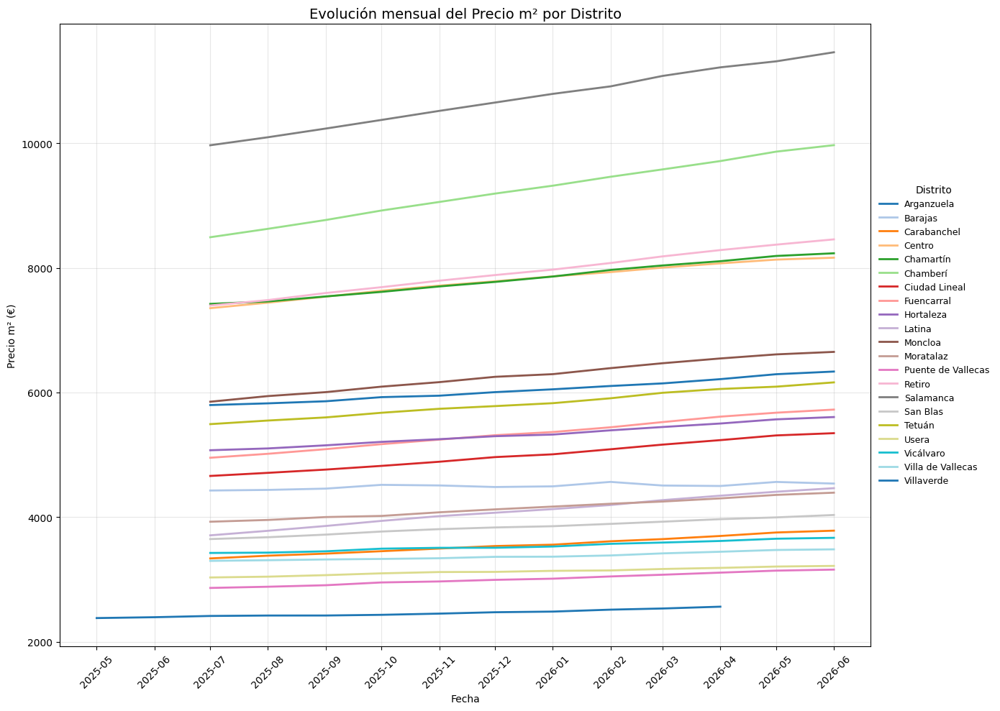

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.dates as mdates

# --- Config ---
df = predicciones_holt_winters.copy()

# Normaliza nombres de columnas posibles
col_fecha = "Fecha" if "Fecha" in df.columns else "Mes"
col_precio = "Predicción Precio m²" if "Predicción Precio m²" in df.columns else "Precio m2"

# Tipos correctos y orden
df[col_fecha] = pd.to_datetime(df[col_fecha])
df[col_precio] = pd.to_numeric(df[col_precio], errors="coerce")
df.sort_values([ "Distrito", col_fecha ], inplace=True)

# Si hay una lista de distritos definida, filtramos
try:
    distritos = list(distritos_lista)
    df = df[df["Distrito"].isin(distritos)]
except NameError:
    distritos = df["Distrito"].unique().tolist()

# Paleta clara y visual (tab20)
n = len(distritos)
cmap = cm.get_cmap("tab20", min(max(n,1), 20))
colors = [cmap(i % 20) for i in range(n)]

# --- Gráfico ---
plt.figure(figsize=(14, 10))

for i, (distrito, g) in enumerate(df.groupby("Distrito")):
    plt.plot(
        g[col_fecha],
        g[col_precio],
        label=distrito,
        color=colors[i],
        linewidth=2
    )

# Personalización
plt.title("Evolución mensual del Precio m² por Distrito", fontsize=14)
plt.xlabel("Fecha")
plt.ylabel("Precio m² (€)")

# Eje X mensual y formato AAAA-MM
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
plt.xticks(rotation=45)

plt.grid(True, alpha=0.3)
plt.legend(
    title="Distrito",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=9,
    ncol=1,
    frameon=False
)
plt.tight_layout()
plt.show()

## Representación histórico + predicción

C:\Users\evahr\AppData\Local\Temp\ipykernel_11184\304103259.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("tab20", 20)


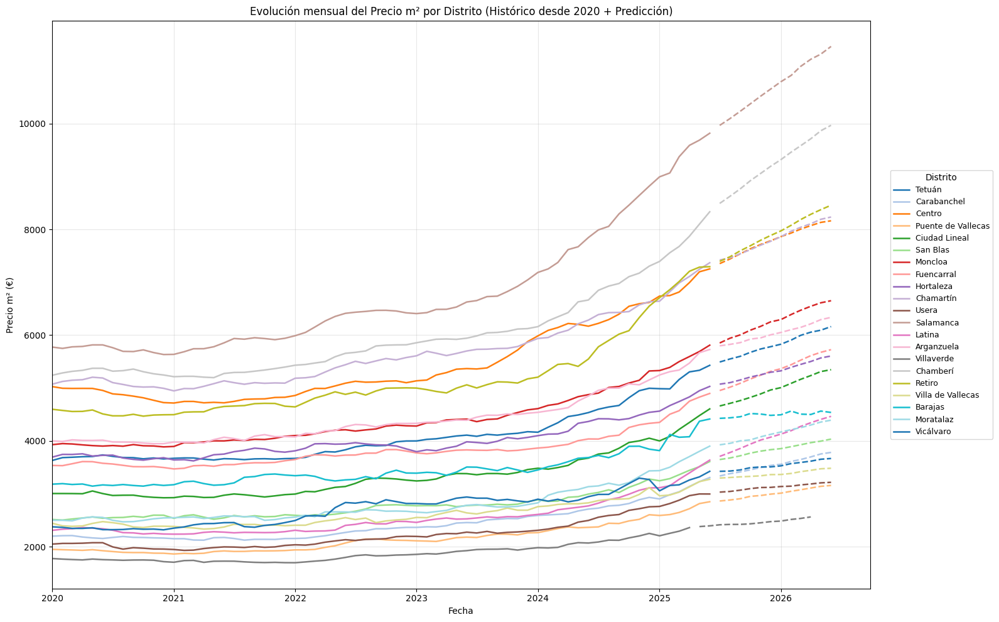

In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.dates as mdates
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Asegura índice de fechas y numérico
df_total = df_total.copy()
df_total.index = pd.to_datetime(df_total.index)
df_total["Precio m2"] = pd.to_numeric(df_total["Precio m2"], errors="coerce")

pasos_futuros = 12
min_obs = 36
desde = pd.Timestamp("2020-01-01")

predicciones_todos = []

distritos = df_total["Distrito"].unique().tolist()
cmap = cm.get_cmap("tab20", 20)

plt.figure(figsize=(16, 10))

for i, d in enumerate(distritos):
    serie = (
        df_total.loc[df_total["Distrito"] == d, "Precio m2"]
        .asfreq("MS").interpolate("time").dropna().sort_index()
    )
    if len(serie) < min_obs:
        continue

    modelo = ExponentialSmoothing(
        serie,
        trend="add",
        damped_trend=True,
        seasonal= 'add',
        seasonal_periods=12,
        initialization_method="estimated",
    ).fit(optimized=True)

    pred = modelo.forecast(steps=pasos_futuros)

    predicciones_todos.extend(
        {"Distrito": d, "Fecha": f, "Predicción Precio m²": v}
        for f, v in pred.items()
    )

    color = cmap(i % 20)

    # Histórico solo desde 2020
    serie_2020 = serie[serie.index >= desde]
    plt.plot(serie_2020.index, serie_2020.values, color=color, linewidth=1.8, label=d)

    # Predicción (mismo color, discontinua)
    plt.plot(pred.index, pred.values, color=color, linewidth=1.8, linestyle="--")

# Estilo del gráfico (foco 2020+)
ax = plt.gca()
ax.set_xlim(left=desde)
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

plt.title("Evolución mensual del Precio m² por Distrito (Histórico desde 2020 + Predicción)")
plt.xlabel("Fecha")
plt.ylabel("Precio m² (€)")
plt.grid(True, alpha=0.3)
plt.legend(title="Distrito", loc="center left", bbox_to_anchor=(1.02, 0.5), fontsize=9)
plt.tight_layout()
plt.show()

# DataFrame final con todas las predicciones
predicciones_holt_winters = (
    pd.DataFrame(predicciones_todos)
      .sort_values(["Distrito", "Fecha"])
      .reset_index(drop=True)
)

## Evaluar modelo de predicción


Holt-Winters - Tetuán
MAE : 193.97  (5.63 % del precio medio)
RMSE: 235.11 (6.82 % del precio medio)
MAPE: 3.76%
Ljung-Box p(12): 0.0001 -> No pasa
Precio medio: 3447.27 €/m²


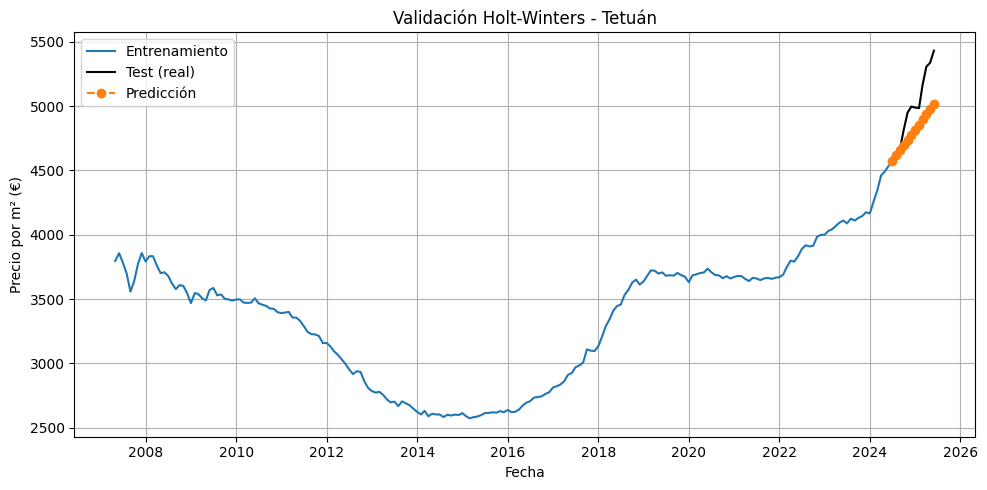


Holt-Winters - Carabanchel
MAE : 139.58  (6.22 % del precio medio)
RMSE: 185.97 (8.29 % del precio medio)
MAPE: 4.49%
Ljung-Box p(12): 0.0000 -> No pasa
Precio medio: 2243.95 €/m²


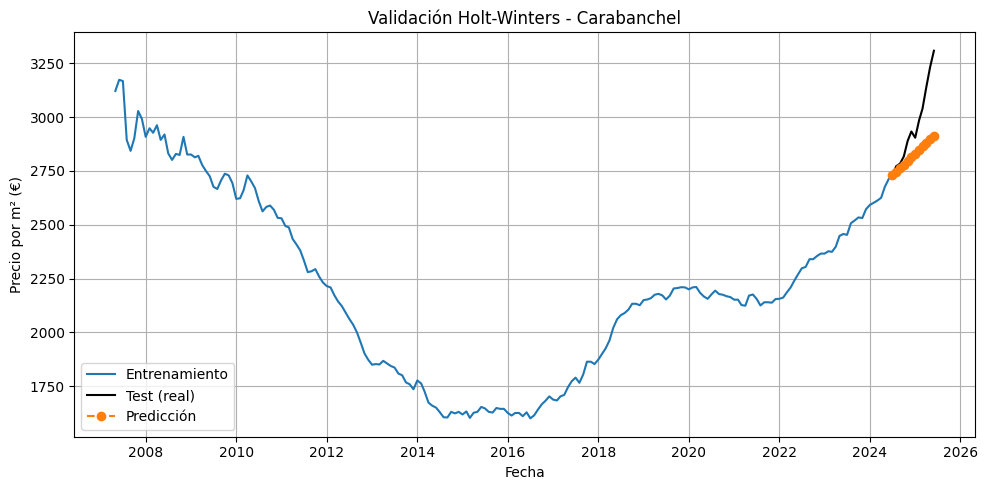


Holt-Winters - Centro
MAE : 378.26  (8.55 % del precio medio)
RMSE: 444.95 (10.05 % del precio medio)
MAPE: 5.49%
Ljung-Box p(12): 0.0219 -> No pasa
Precio medio: 4426.69 €/m²


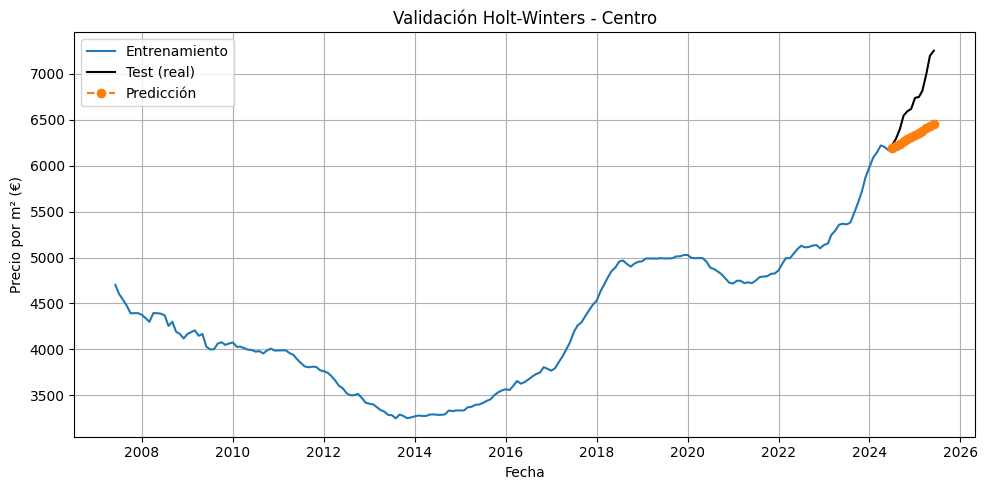


Holt-Winters - Puente de Vallecas
MAE : 145.16  (7.35 % del precio medio)
RMSE: 176.62 (8.94 % del precio medio)
MAPE: 5.41%
Ljung-Box p(12): 0.0007 -> No pasa
Precio medio: 1975.95 €/m²


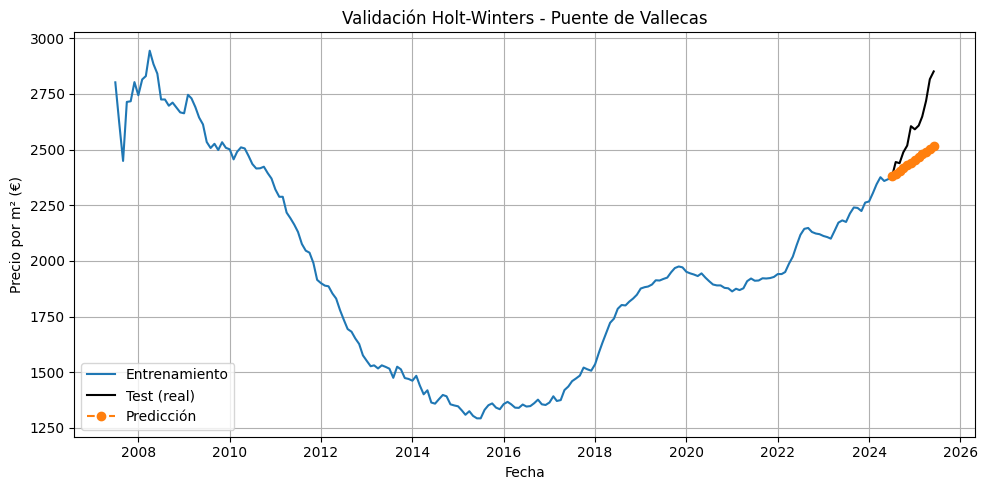


Holt-Winters - Ciudad Lineal
MAE : 257.90  (8.58 % del precio medio)
RMSE: 312.53 (10.40 % del precio medio)
MAPE: 6.06%
Ljung-Box p(12): 0.0000 -> No pasa
Precio medio: 3006.33 €/m²


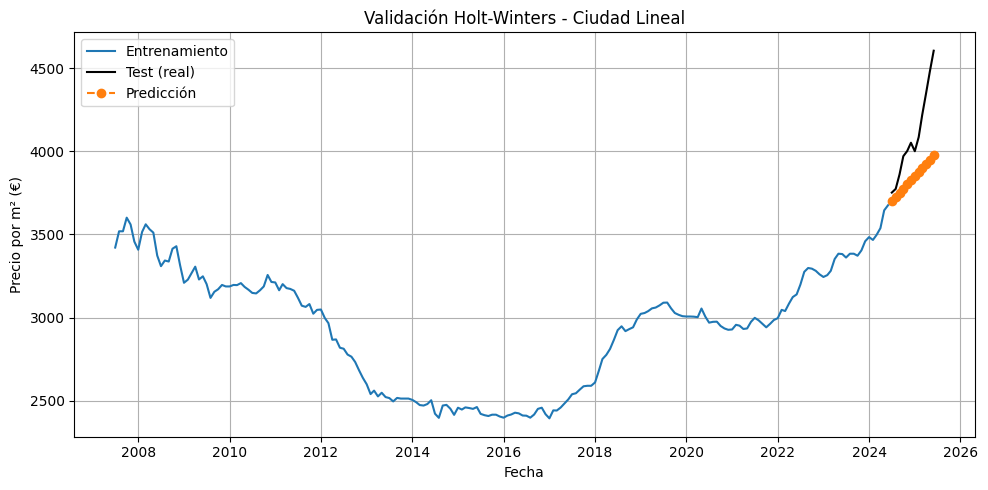


Holt-Winters - San Blas
MAE : 195.87  (7.46 % del precio medio)
RMSE: 242.26 (9.23 % del precio medio)
MAPE: 5.78%
Ljung-Box p(12): 0.2517 -> Pasa
Precio medio: 2624.69 €/m²


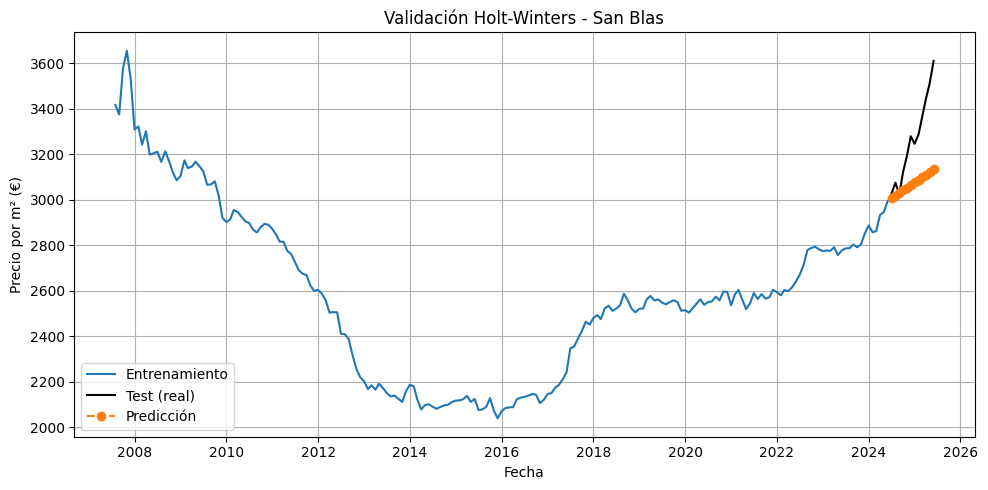


Holt-Winters - Moncloa
MAE : 209.19  (5.53 % del precio medio)
RMSE: 258.91 (6.84 % del precio medio)
MAPE: 3.80%
Ljung-Box p(12): 0.0003 -> No pasa
Precio medio: 3785.82 €/m²


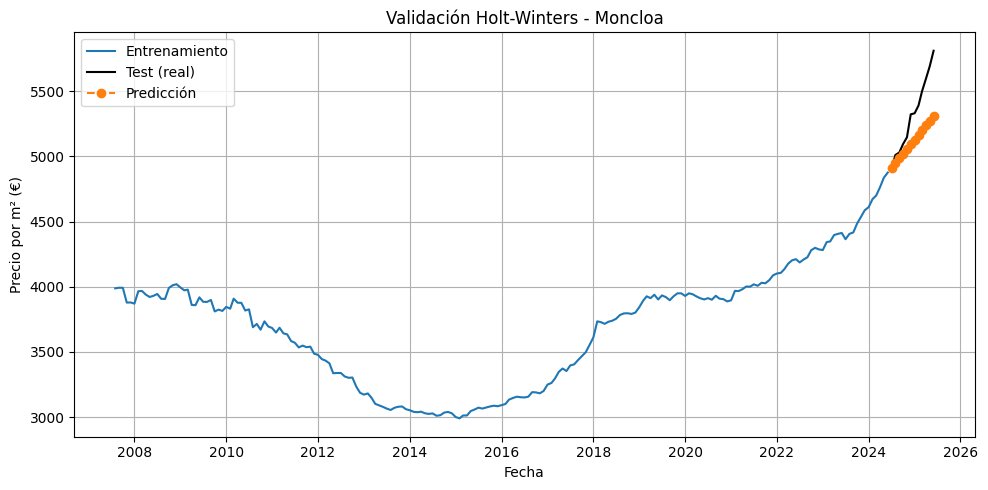


Holt-Winters - Fuencarral
MAE : 292.79  (8.73 % del precio medio)
RMSE: 372.01 (11.10 % del precio medio)
MAPE: 6.33%
Ljung-Box p(12): 0.0642 -> Pasa
Precio medio: 3352.71 €/m²


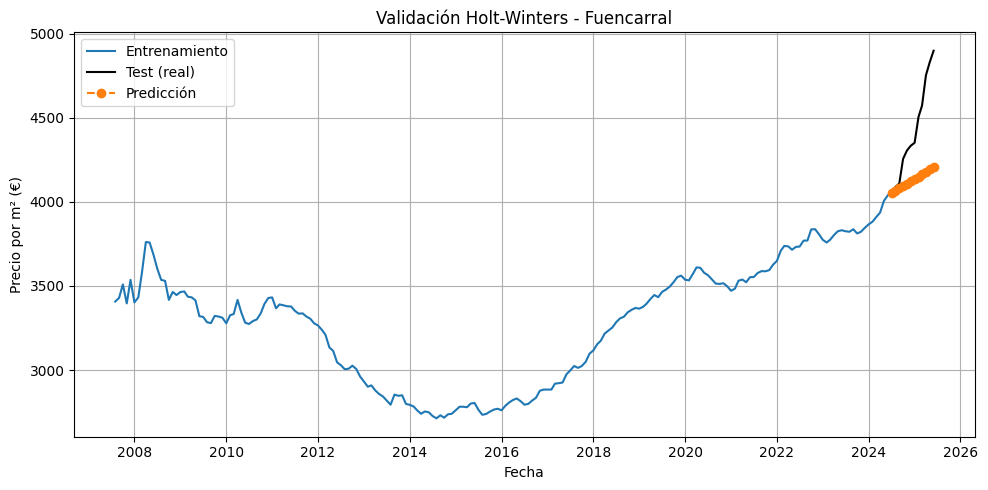


Holt-Winters - Hortaleza
MAE : 108.13  (3.10 % del precio medio)
RMSE: 159.89 (4.58 % del precio medio)
MAPE: 2.24%
Ljung-Box p(12): 0.9543 -> Pasa
Precio medio: 3487.28 €/m²


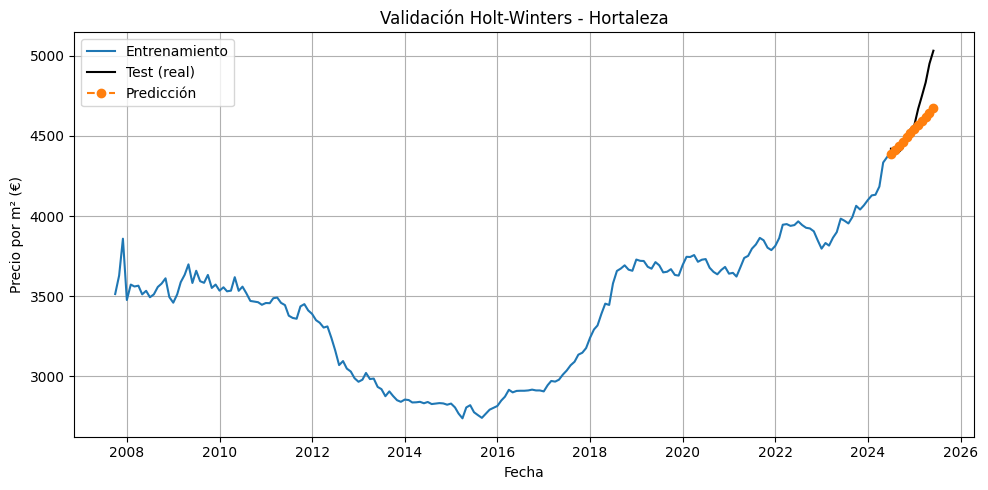


Holt-Winters - Chamartín
MAE : 194.66  (4.05 % del precio medio)
RMSE: 271.75 (5.66 % del precio medio)
MAPE: 2.76%
Ljung-Box p(12): 0.0002 -> No pasa
Precio medio: 4804.63 €/m²


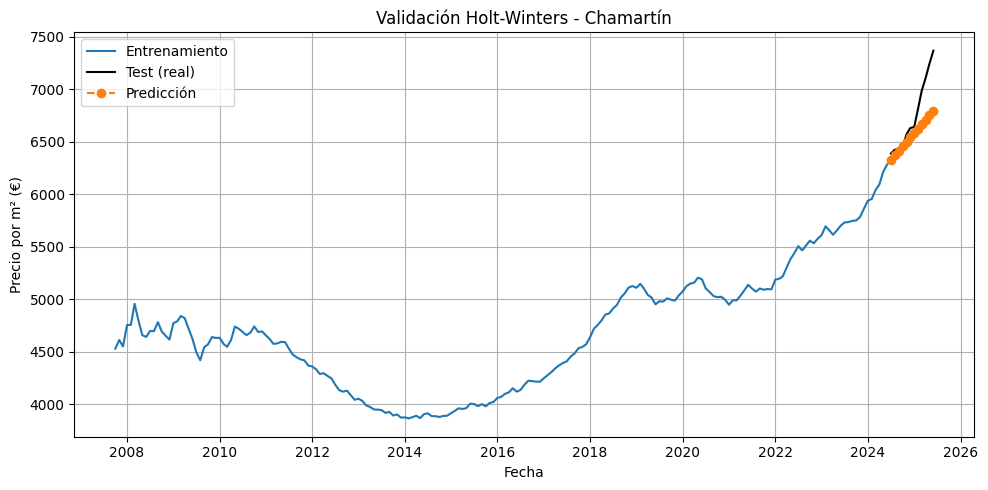


Holt-Winters - Usera
MAE : 127.73  (6.15 % del precio medio)
RMSE: 143.16 (6.89 % del precio medio)
MAPE: 4.49%
Ljung-Box p(12): 0.1663 -> Pasa
Precio medio: 2077.24 €/m²


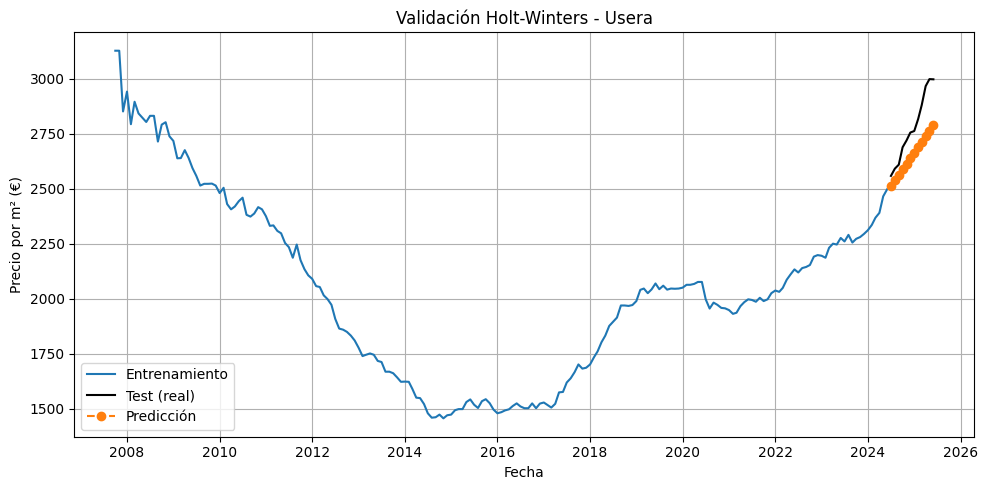


Holt-Winters - Salamanca
MAE : 316.03  (5.95 % del precio medio)
RMSE: 378.41 (7.12 % del precio medio)
MAPE: 3.41%
Ljung-Box p(12): 0.3130 -> Pasa
Precio medio: 5314.17 €/m²


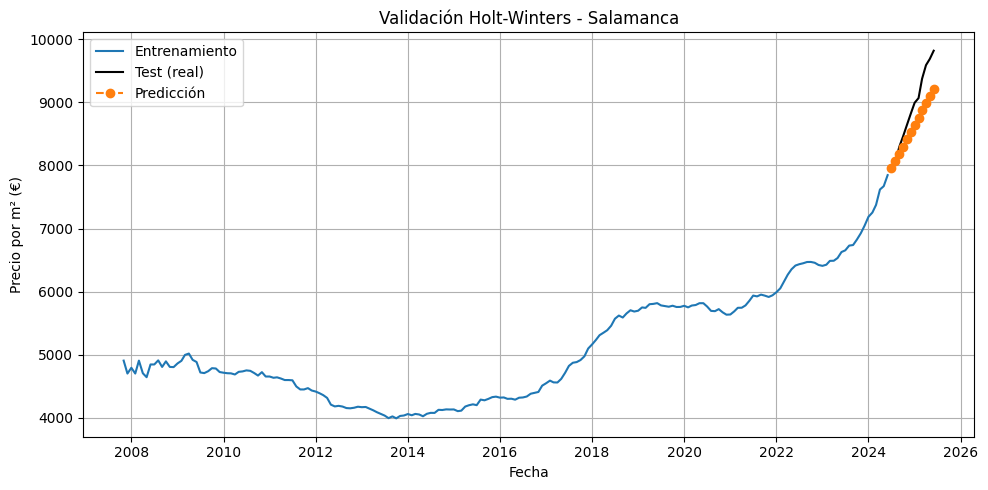


Holt-Winters - Latina
MAE : 275.41  (12.05 % del precio medio)
RMSE: 331.86 (14.52 % del precio medio)
MAPE: 8.33%
Ljung-Box p(12): 0.0000 -> No pasa
Precio medio: 2284.87 €/m²


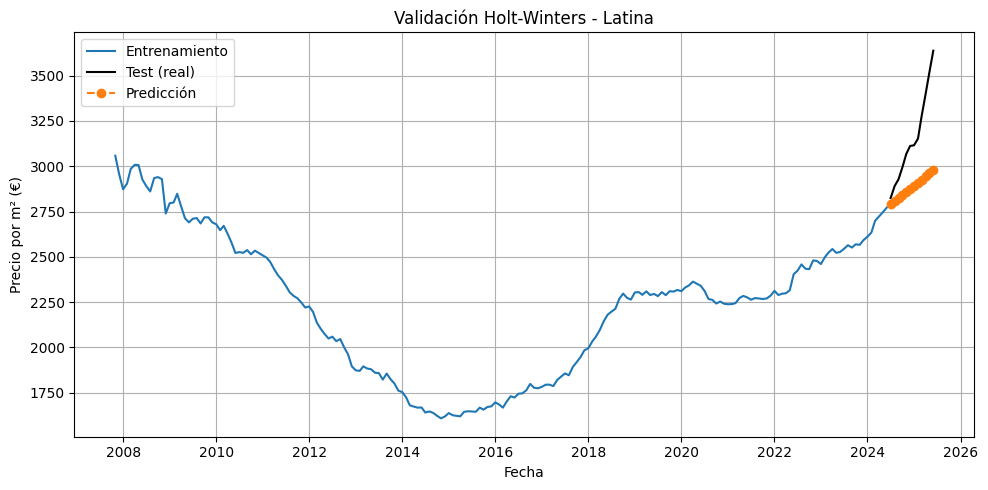


Holt-Winters - Arganzuela
MAE : 107.51  (2.94 % del precio medio)
RMSE: 145.86 (3.99 % del precio medio)
MAPE: 1.97%
Ljung-Box p(12): 0.0001 -> No pasa
Precio medio: 3656.17 €/m²


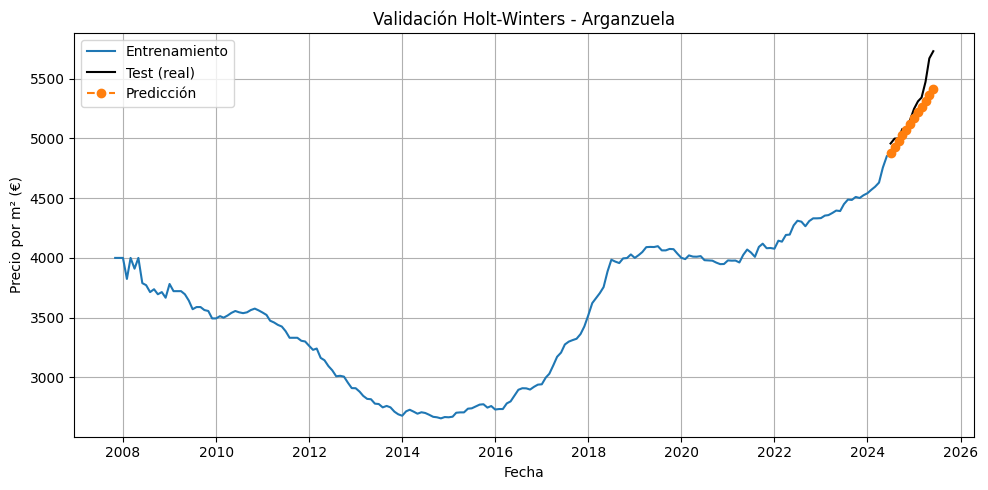


Holt-Winters - Villaverde
MAE : 76.74  (4.23 % del precio medio)
RMSE: 95.88 (5.29 % del precio medio)
MAPE: 3.41%
Ljung-Box p(12): 0.0358 -> No pasa
Precio medio: 1812.32 €/m²


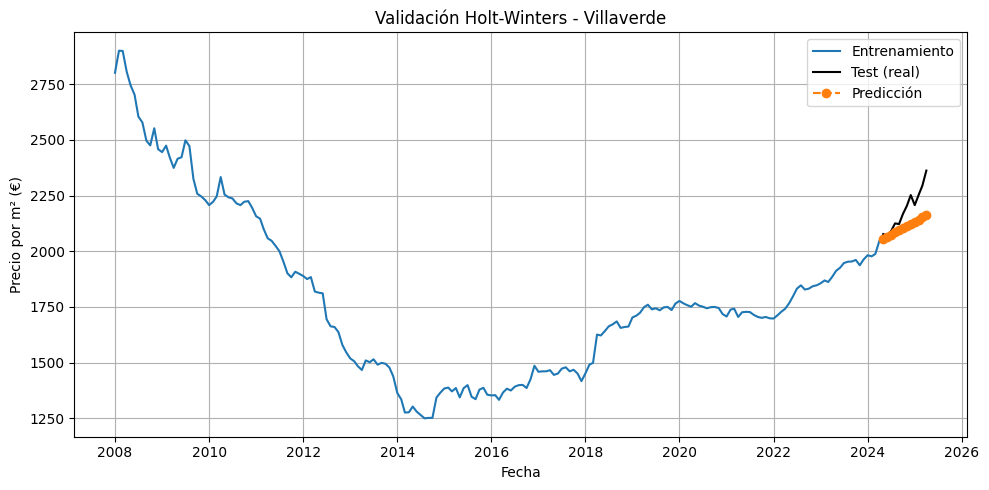


Holt-Winters - Chamberí
MAE : 201.59  (4.15 % del precio medio)
RMSE: 265.38 (5.47 % del precio medio)
MAPE: 2.59%
Ljung-Box p(12): 0.9379 -> Pasa
Precio medio: 4855.17 €/m²


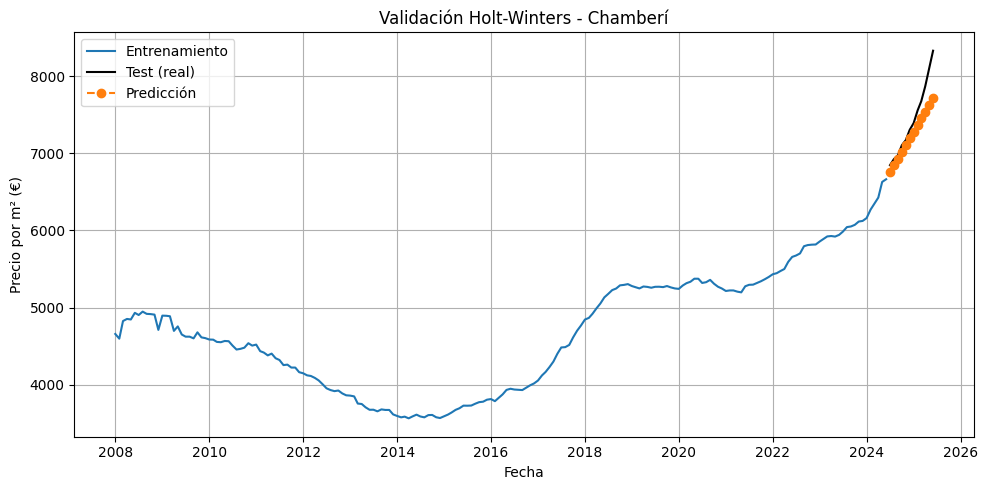


Holt-Winters - Retiro
MAE : 761.86  (18.10 % del precio medio)
RMSE: 854.96 (20.31 % del precio medio)
MAPE: 11.16%
Ljung-Box p(12): 0.0236 -> No pasa
Precio medio: 4209.12 €/m²


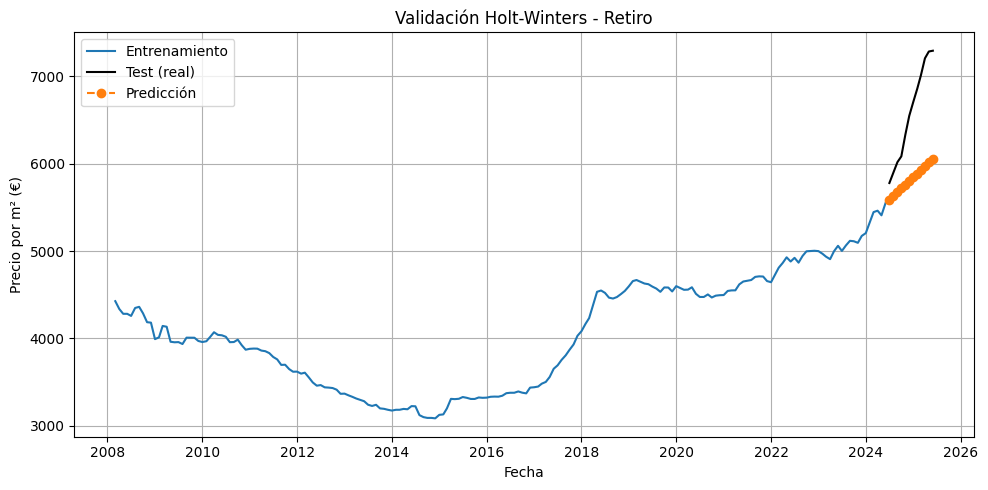


Holt-Winters - Villa de Vallecas
MAE : 122.56  (5.11 % del precio medio)
RMSE: 156.62 (6.53 % del precio medio)
MAPE: 3.93%
Ljung-Box p(12): 0.1056 -> Pasa
Precio medio: 2399.32 €/m²


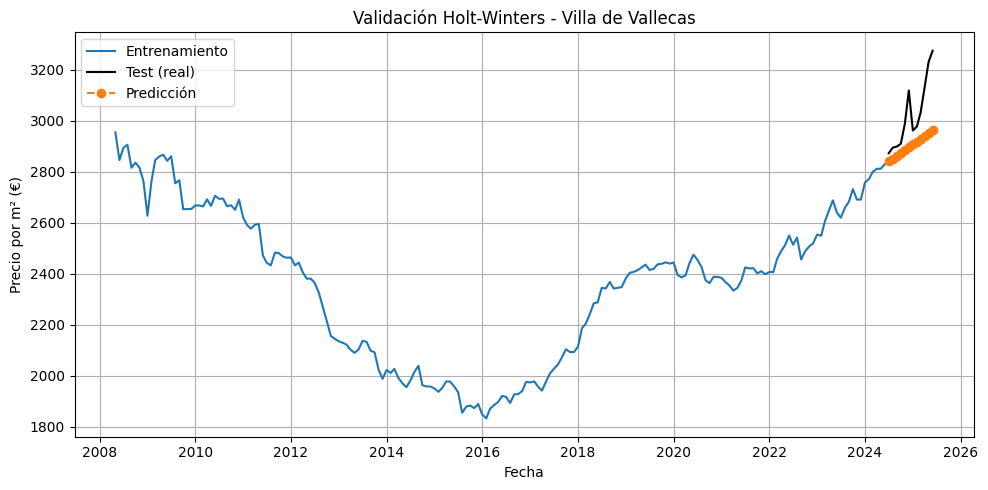


Holt-Winters - Barajas
MAE : 188.50  (6.08 % del precio medio)
RMSE: 257.23 (8.29 % del precio medio)
MAPE: 4.52%
Ljung-Box p(12): 0.0000 -> No pasa
Precio medio: 3101.27 €/m²


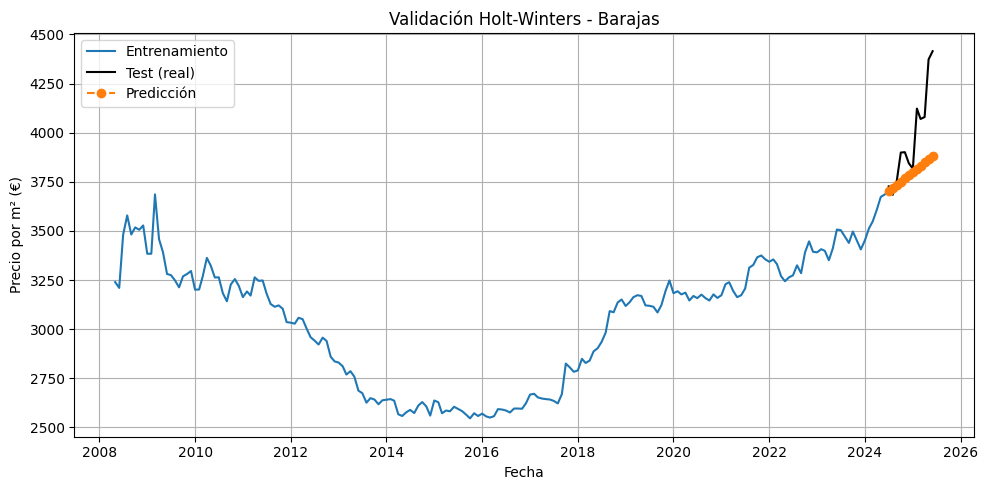


Holt-Winters - Moratalaz
MAE : 199.64  (8.23 % del precio medio)
RMSE: 265.94 (10.96 % del precio medio)
MAPE: 5.46%
Ljung-Box p(12): 0.3535 -> Pasa
Precio medio: 2425.56 €/m²


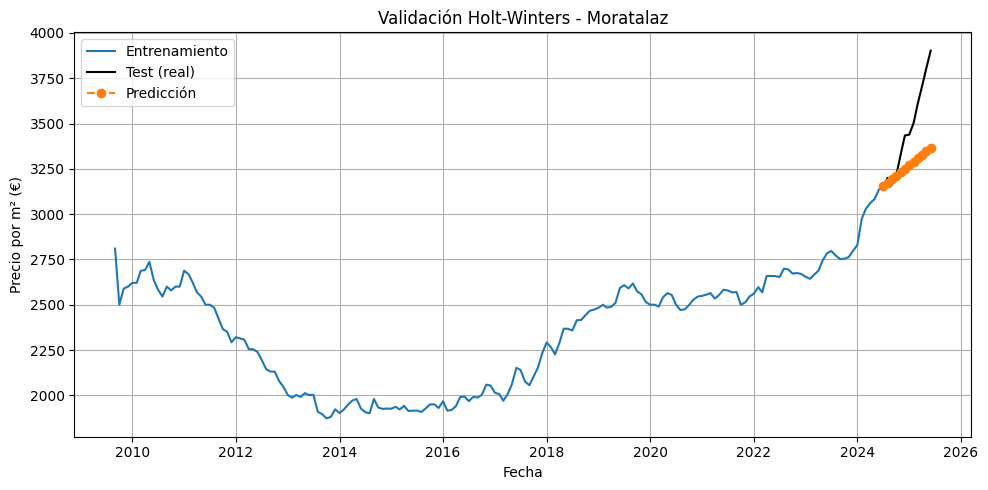


Holt-Winters - Vicálvaro
MAE : 168.21  (7.41 % del precio medio)
RMSE: 198.25 (8.74 % del precio medio)
MAPE: 5.16%
Ljung-Box p(12): 0.5118 -> Pasa
Precio medio: 2269.54 €/m²


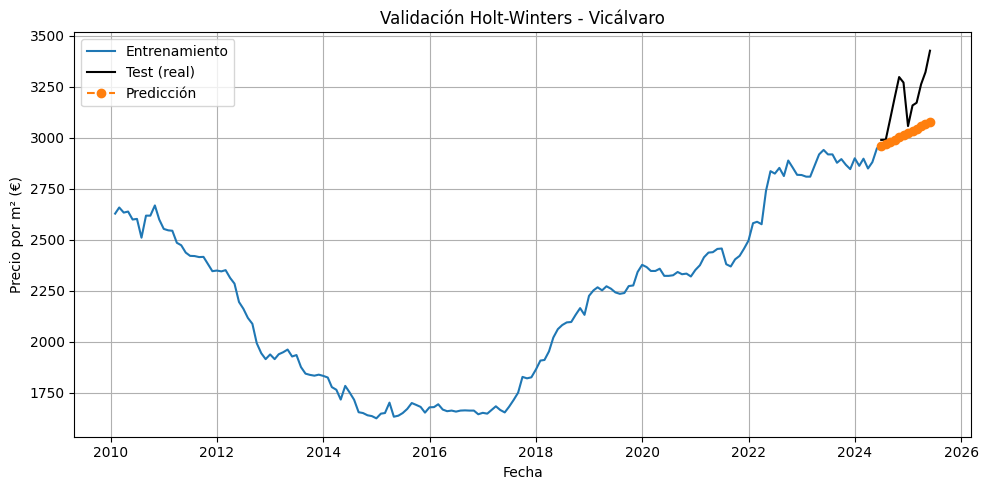

In [92]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Asegurar que el índice sea fecha y esté ordenado
df_total = df_total.copy()
df_total.index = pd.to_datetime(df_total.index)
df_total = df_total.sort_index()

# Configuración
n_test = 12
resultados = {}

# Iterar por distrito
for distrito in df_total['Distrito'].unique():
    serie = df_total[df_total['Distrito'] == distrito]['Precio m2'].dropna()
    serie = serie.asfreq('MS')

    if len(serie) <= n_test + 12:
        continue

    train = serie[:-n_test]
    test = serie[-n_test:]

    # Ajustar modelo Holt-Winters
    modelo = ExponentialSmoothing(
        train,
        trend='add',
        seasonal= None,
        #seasonal_periods=12,
        initialization_method='estimated'
    ).fit()

    pred = modelo.forecast(steps=n_test)

    # Calcular métricas
    mae = mean_absolute_error(test, pred)
    rmse = np.sqrt(mean_squared_error(test, pred))
    mape = np.mean(np.abs((test - pred) / test)) * 100

    # Calcular precio medio histórico
    precio_medio = serie.mean()
    pct_mae = (mae / precio_medio) * 100
    pct_rmse = (rmse / precio_medio) * 100

    # Test de Ljung–Box sobre los residuos in-sample del modelo
    resid = modelo.resid.dropna()
    lb_test = acorr_ljungbox(resid, lags=[12], return_df=True)
    pvalue_lb = lb_test['lb_pvalue'].iloc[0]
    pasa_ljungbox = pvalue_lb > 0.05  

    resultados[distrito] = {
        'MAE': mae,
        'RMSE': rmse,
        'MAPE': mape,
        'MAE %': pct_mae,
        'RMSE %': pct_rmse,
        'Precio Medio': precio_medio,
        'Ljung-Box p(12)': pvalue_lb,
        'Residuos ~ ruido blanco': pasa_ljungbox,
        'Test Real': test,
        'Predicción': pred
    }

    # Mostrar métricas
    print(f"\nHolt-Winters - {distrito}")
    print(f"MAE : {mae:.2f}  ({pct_mae:.2f} % del precio medio)")
    print(f"RMSE: {rmse:.2f} ({pct_rmse:.2f} % del precio medio)")
    print(f"MAPE: {mape:.2f}%")
    print(f"Ljung-Box p(12): {pvalue_lb:.4f} -> {'Pasa' if pasa_ljungbox else 'No pasa'}")
    print(f"Precio medio: {precio_medio:.2f} €/m²")
    

    # --- Visualización ---
    plt.figure(figsize=(10, 5))
    plt.plot(train, label='Entrenamiento')
    plt.plot(test, label='Test (real)', color='black')
    plt.plot(pred, label='Predicción', linestyle='--', marker='o')

    # Leyenda adicional
    #leyenda_texto = (
      #  f"Precio medio: {precio_medio:.2f} €/m²\n"
      #  f"MAE: {mae:.2f} ({pct_mae:.2f}%)\n"
      #  f"RMSE: {rmse:.2f} ({pct_rmse:.2f}%)\n"
      #  f"Ljung-Box p(12): {pvalue_lb:.4f}"
   # )
    #plt.text(
     #   0.01, 0.97, leyenda_texto,
     #   transform=plt.gca().transAxes,
     #   fontsize=10,
     #   verticalalignment='top',
     #   bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray')
   # )

    plt.title(f"Validación Holt-Winters - {distrito}")
    plt.xlabel("Fecha")
    plt.ylabel("Precio por m² (€)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Aquí tienes tu código modificado para que muestre en la gráfica también el porcentaje que representan el MAE y RMSE respecto al precio medioEste añadido te permite analizar mejor si los errores absolutos son grandes o pequeños en relación con el nivel de precios del distrito, lo cual es muy útil para justificar la calidad del modelo en tu TFM.

In [91]:
# === Tabla de métricas por distrito ===
cols = ['Precio Medio', 'MAE', 'MAE %', 'RMSE', 'RMSE %', 'MAPE']
df_metricas = (
    pd.DataFrame.from_dict(resultados, orient='index')[cols]
      .sort_values(by='MAPE')        
      .round(2)
)

print(df_metricas)

# Guardar a CSV
df_metricas.to_csv("metricas_holt_winters_por_distrito.csv", encoding="utf-8-sig")

                    Precio Medio     MAE  MAE %    RMSE  RMSE %   MAPE
Arganzuela               3656.17  107.51   2.94  145.86    3.99   1.97
Hortaleza                3487.28  108.13   3.10  159.89    4.58   2.24
Chamberí                 4855.17  201.59   4.15  265.38    5.47   2.59
Chamartín                4804.63  194.66   4.05  271.75    5.66   2.76
Salamanca                5314.17  316.03   5.95  378.41    7.12   3.41
Villaverde               1812.32   76.74   4.23   95.88    5.29   3.41
Tetuán                   3447.27  193.97   5.63  235.11    6.82   3.76
Moncloa                  3785.82  209.19   5.53  258.91    6.84   3.80
Villa de Vallecas        2399.32  122.56   5.11  156.62    6.53   3.93
Usera                    2077.24  127.73   6.15  143.16    6.89   4.49
Carabanchel              2243.95  139.58   6.22  185.97    8.29   4.49
Barajas                  3101.27  188.50   6.08  257.23    8.29   4.52
Vicálvaro                2269.54  168.21   7.41  198.25    8.74   5.16
Puente

## Intervalos de confianza

In [93]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Lista para acumular resultados
resultados_ic = []

# Iterar por distritos
for distrito in df_total['Distrito'].unique():
    # Filtrar la serie del distrito y forzar frecuencia mensual
    serie = df_total[df_total['Distrito'] == distrito]['Precio m2'].asfreq('MS')
    serie = serie.dropna()

    if len(serie) < 24:
        continue  

    # Ajustar modelo Holt-Winters
    modelo = ExponentialSmoothing(
        serie,
        trend='add',
        seasonal=None,
        initialization_method='estimated'
    ).fit()

    pasos_futuros = 12
    predicciones = modelo.forecast(steps=pasos_futuros)

    # Calcular desviación estándar de los residuos
    resid = serie - modelo.fittedvalues
    sigma = resid.std()

    # Calcular IC95%: valor ± 1.96*sigma
    z = 1.96
    ic_inferior = predicciones - z * sigma
    ic_superior = predicciones + z * sigma

    # Crear fechas para las predicciones
    fechas_pred = pd.date_range(start=serie.index[-1] + pd.DateOffset(months=1),
                                periods=pasos_futuros,
                                freq='MS')
    predicciones.index = fechas_pred
    ic_inferior.index = fechas_pred
    ic_superior.index = fechas_pred

    # Guardar resultados en lista
    for fecha in fechas_pred:
        resultados_ic.append({
            "Distrito": distrito,
            "Fecha": fecha,
            "Predicción Precio m²": predicciones.loc[fecha],
            "IC_95%_Inferior": ic_inferior.loc[fecha],
            "IC_95%_Superior": ic_superior.loc[fecha]
        })

# Convertir a DataFrame final
df_predicciones_ic = pd.DataFrame(resultados_ic)

# Mostrar ejemplo
print(df_predicciones_ic.head(20))



       Distrito      Fecha  Predicción Precio m²  IC_95%_Inferior  \
0        Tetuán 2025-07-01           5502.150695      5429.525714   
1        Tetuán 2025-08-01           5574.606771      5501.981790   
2        Tetuán 2025-09-01           5647.062846      5574.437865   
3        Tetuán 2025-10-01           5719.518922      5646.893941   
4        Tetuán 2025-11-01           5791.974998      5719.350017   
5        Tetuán 2025-12-01           5864.431074      5791.806093   
6        Tetuán 2026-01-01           5936.887150      5864.262169   
7        Tetuán 2026-02-01           6009.343226      5936.718244   
8        Tetuán 2026-03-01           6081.799301      6009.174320   
9        Tetuán 2026-04-01           6154.255377      6081.630396   
10       Tetuán 2026-05-01           6226.711453      6154.086472   
11       Tetuán 2026-06-01           6299.167529      6226.542548   
12  Carabanchel 2025-07-01           3350.243158      3282.793004   
13  Carabanchel 2025-08-01        

En la predicción del precio de la vivienda por distrito, los intervalos de confianza permiten estimar no solo el valor central esperado, sino también el rango de variación posible, lo que resulta especialmente útil para evaluar escenarios de riesgo y robustez de las previsiones a corto y medio plazo.

## 2. Modelado estacional: SARIMA

In [122]:
df_distrito = df_total[df_total['Distrito'] == distrito].copy()
serie = df_distrito['Precio m2'].asfreq('MS').dropna()

Entrenando modelo para distrito: Tetuán


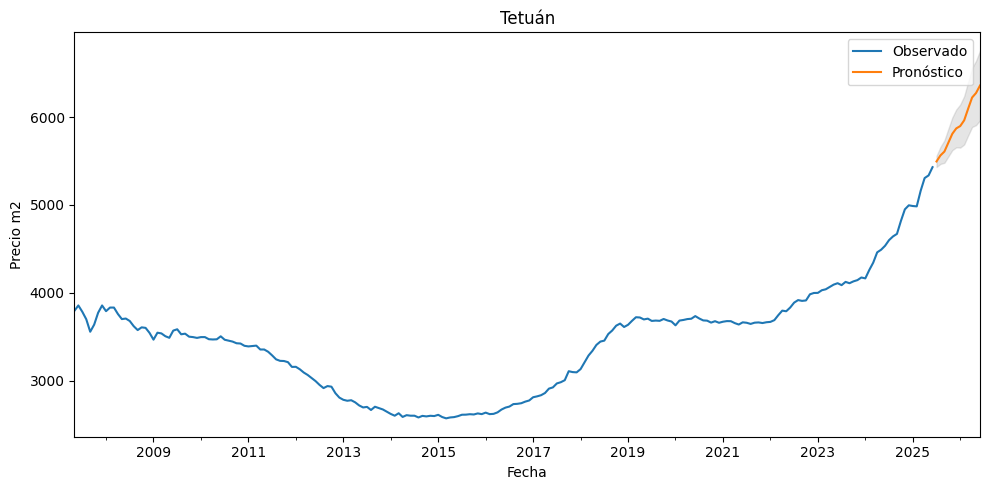

Entrenando modelo para distrito: Carabanchel


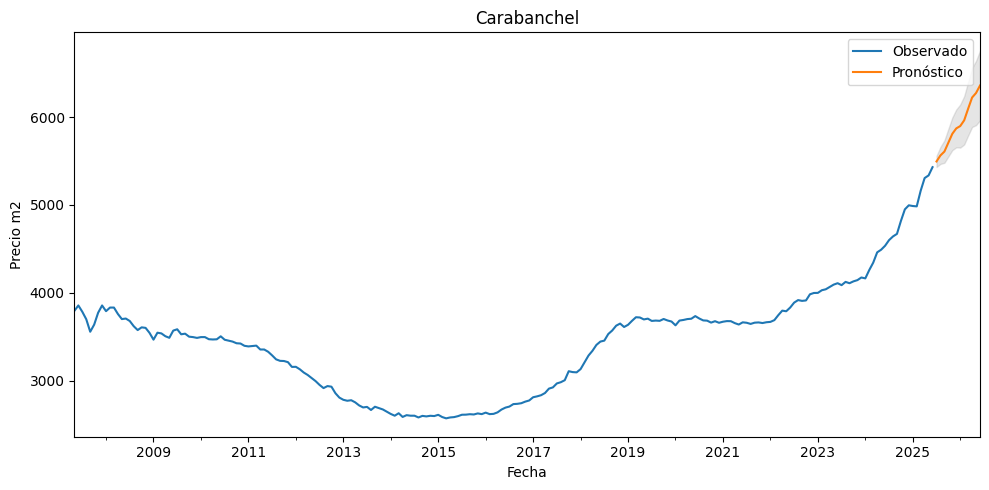

Entrenando modelo para distrito: Centro


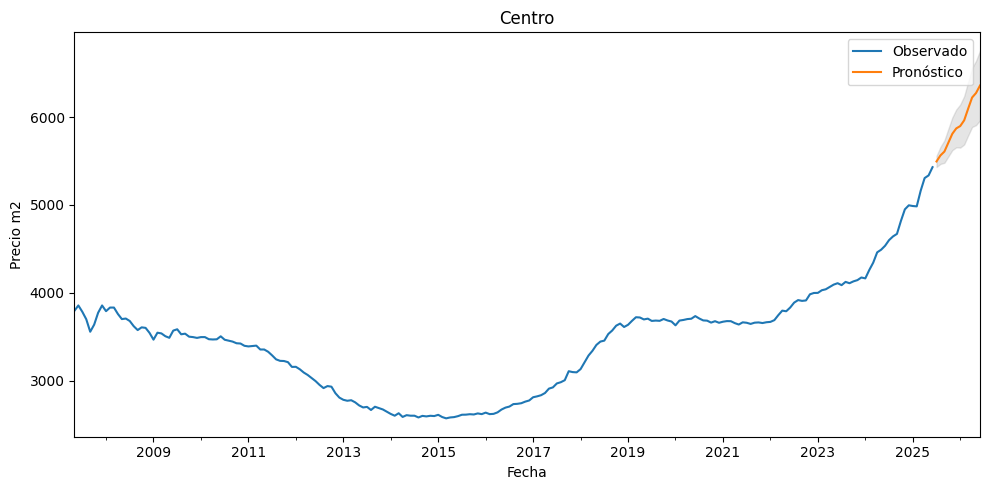

Entrenando modelo para distrito: Puente de Vallecas


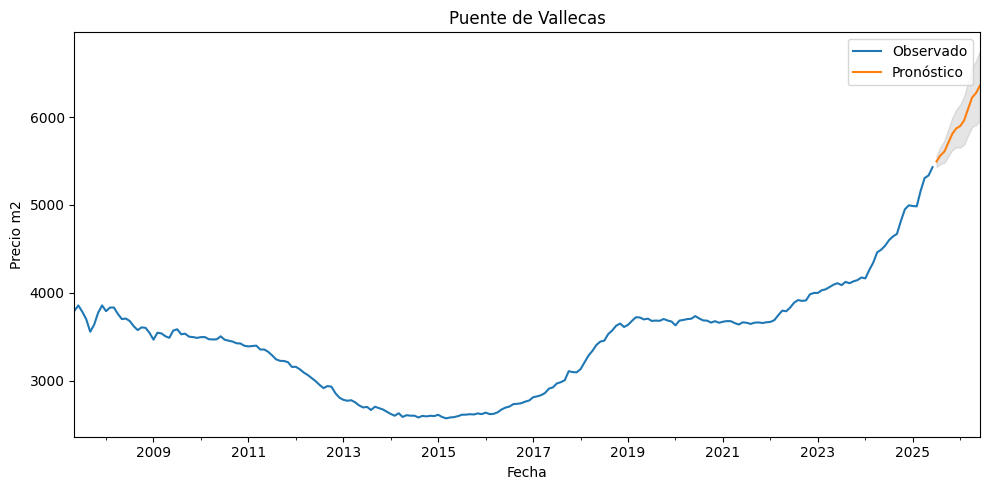

Entrenando modelo para distrito: Ciudad Lineal


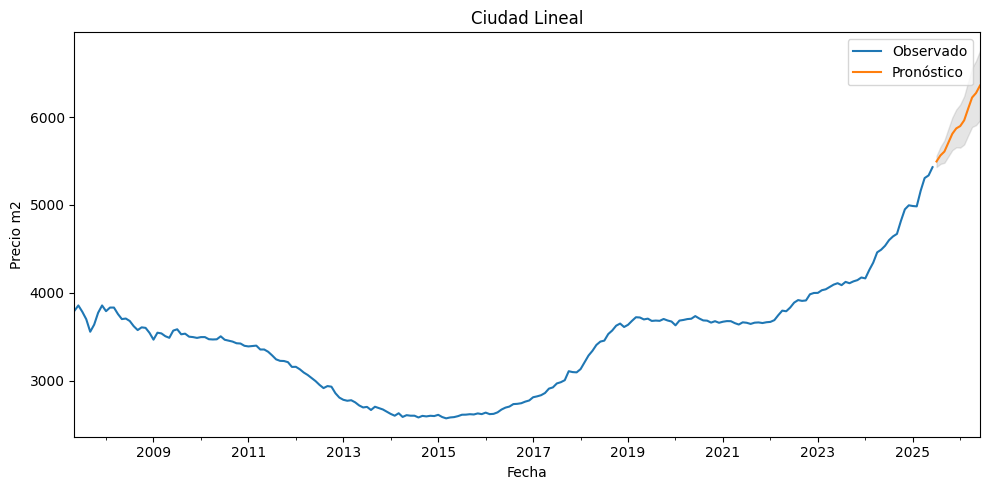

Entrenando modelo para distrito: San Blas


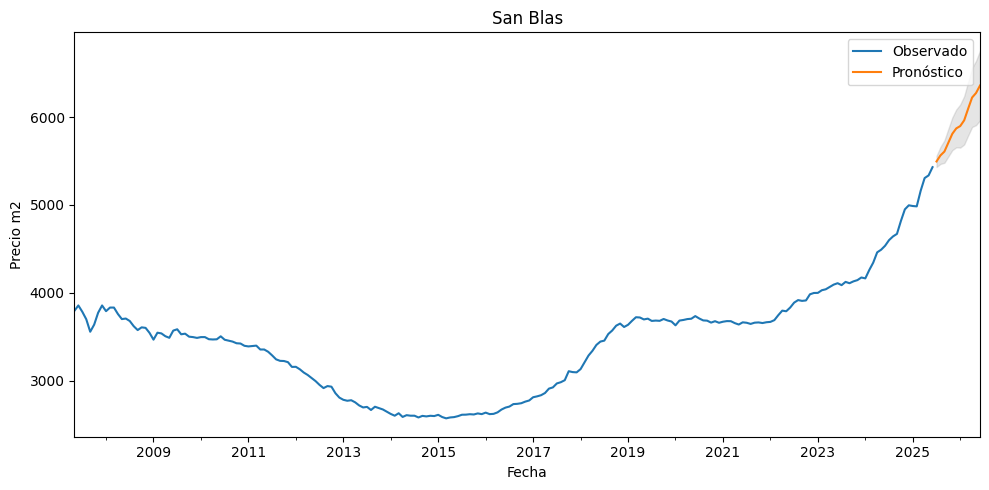

Entrenando modelo para distrito: Moncloa


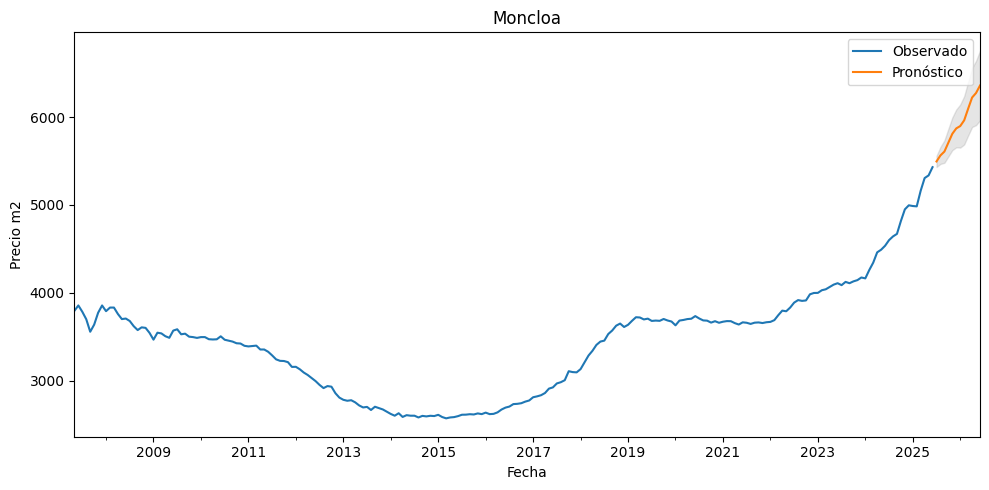

Entrenando modelo para distrito: Fuencarral


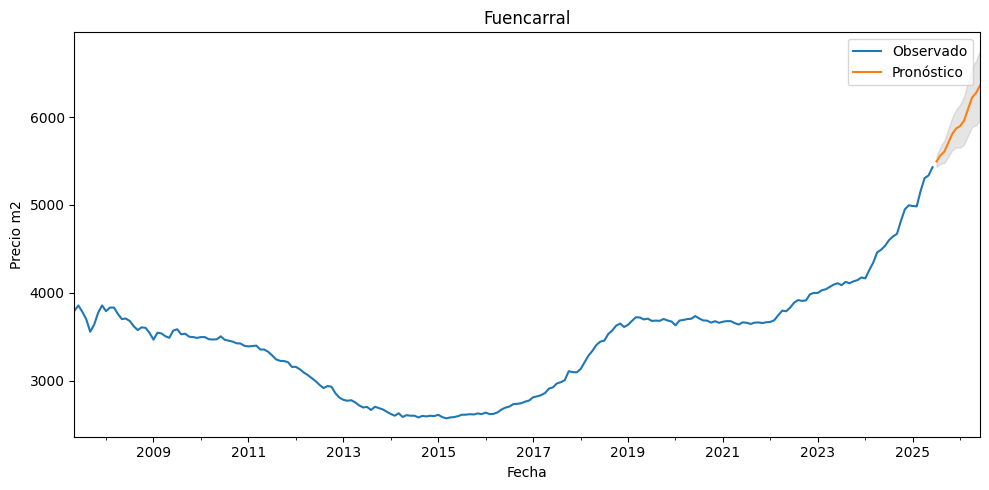

Entrenando modelo para distrito: Hortaleza


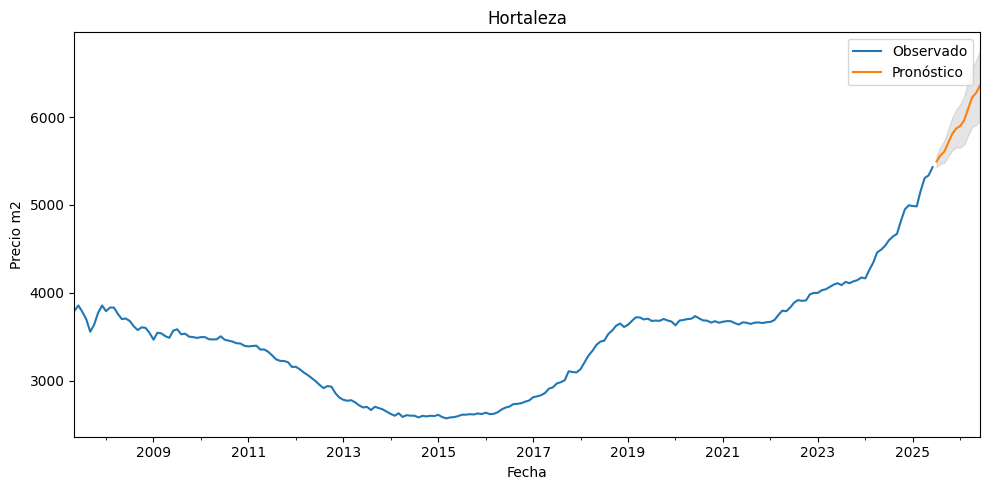

Entrenando modelo para distrito: Chamartín


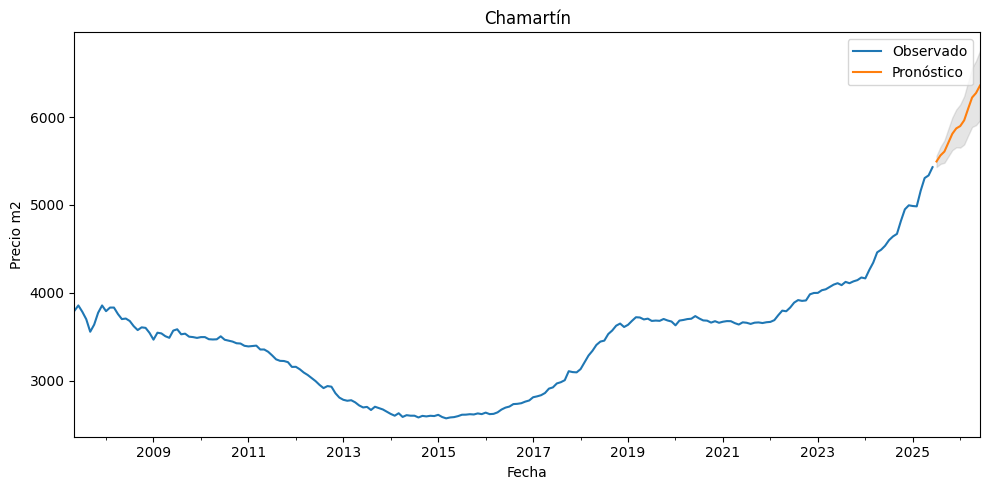

Entrenando modelo para distrito: Usera


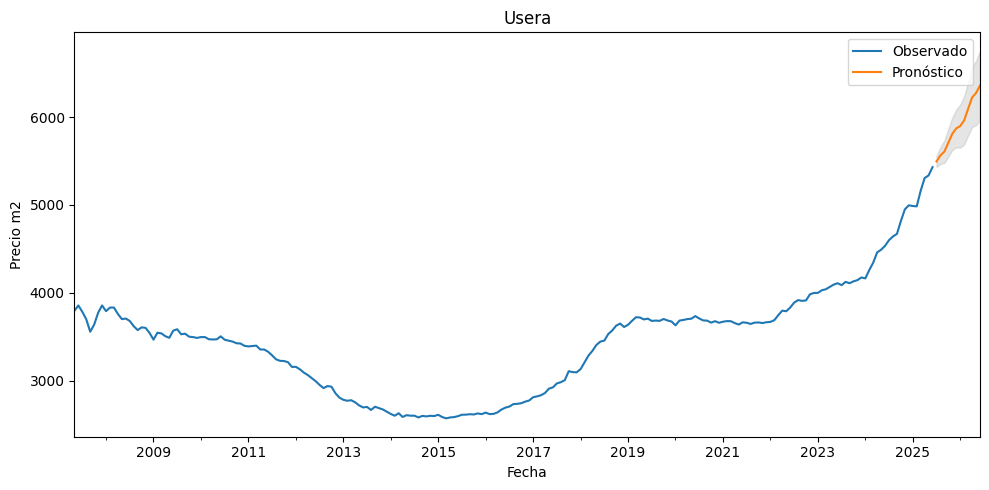

Entrenando modelo para distrito: Salamanca


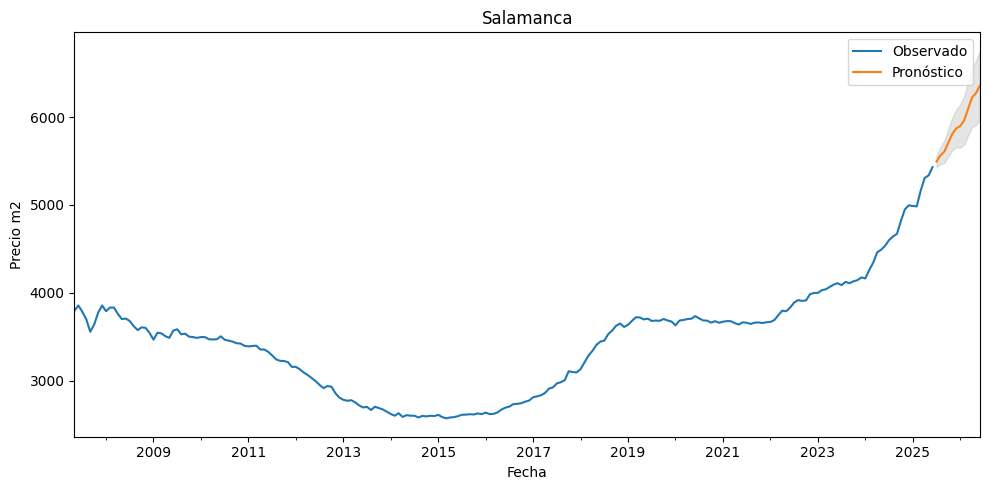

Entrenando modelo para distrito: Latina


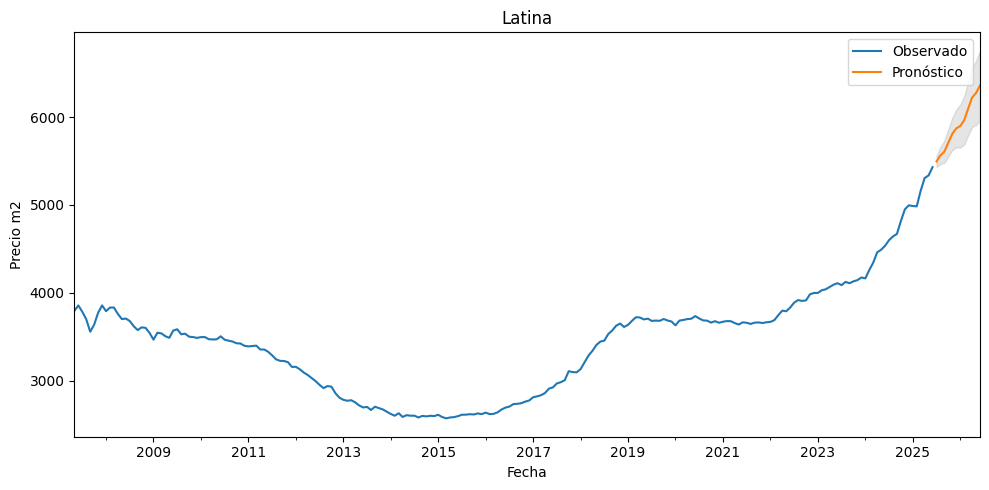

Entrenando modelo para distrito: Arganzuela


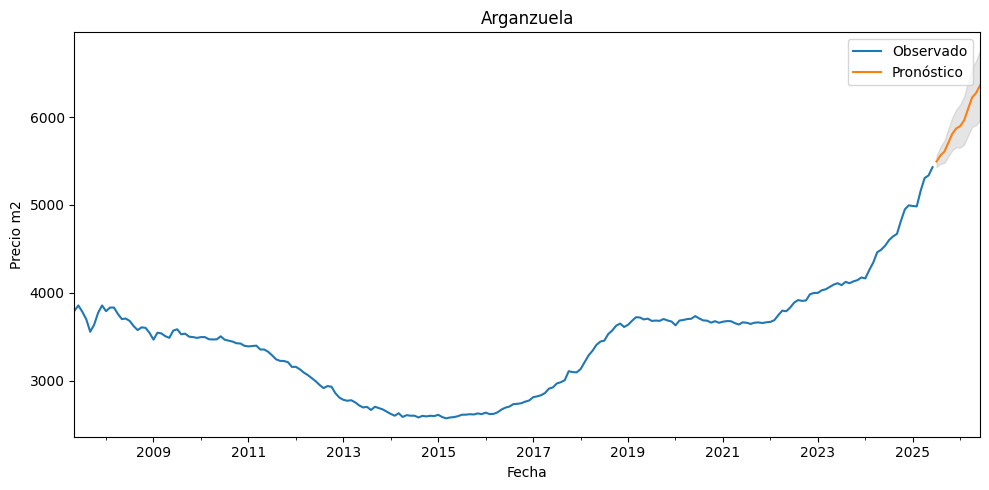

Entrenando modelo para distrito: Villaverde


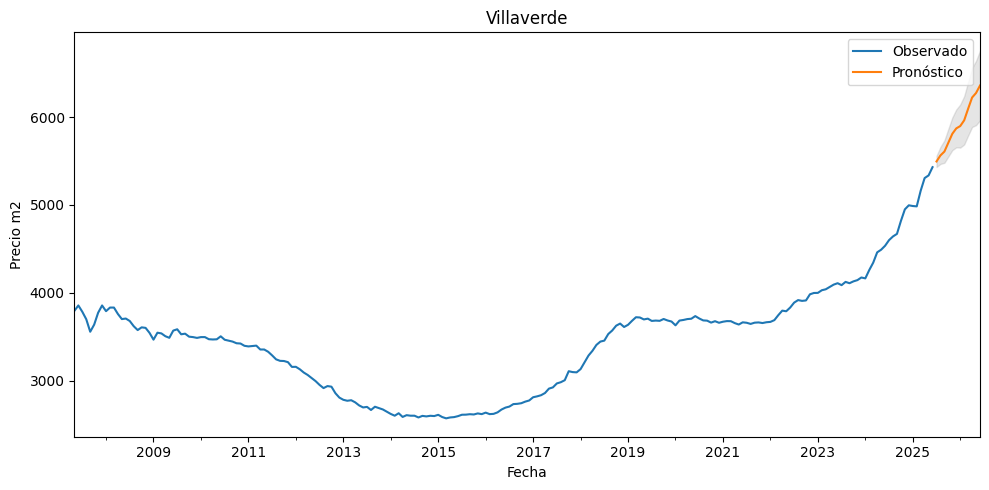

Entrenando modelo para distrito: Chamberí


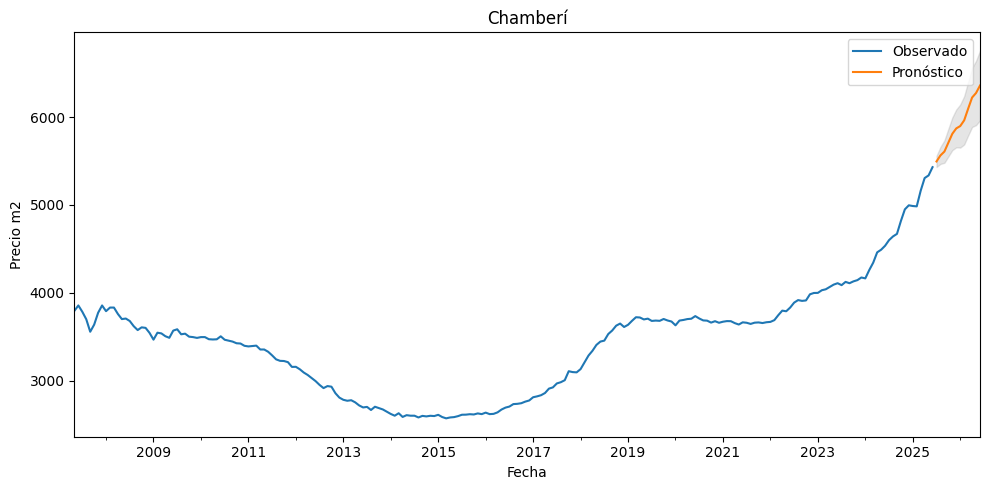

Entrenando modelo para distrito: Retiro


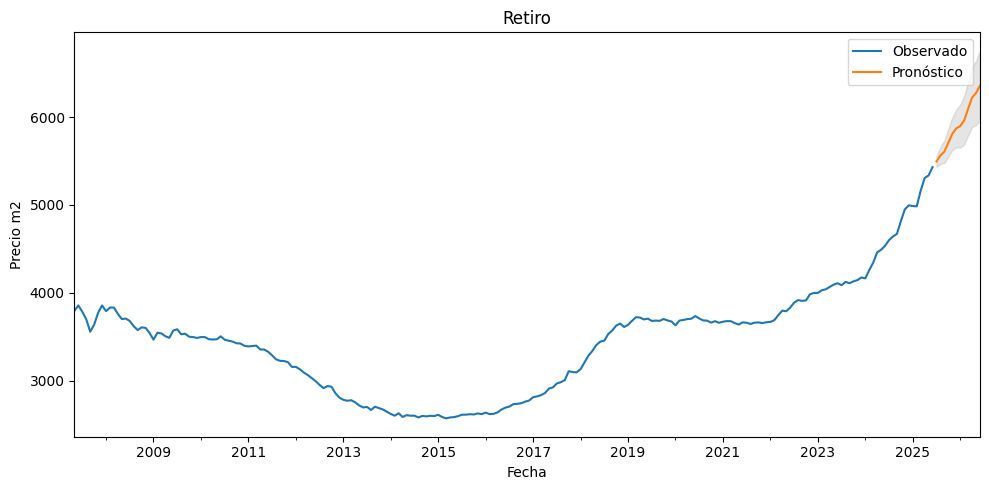

Entrenando modelo para distrito: Villa de Vallecas


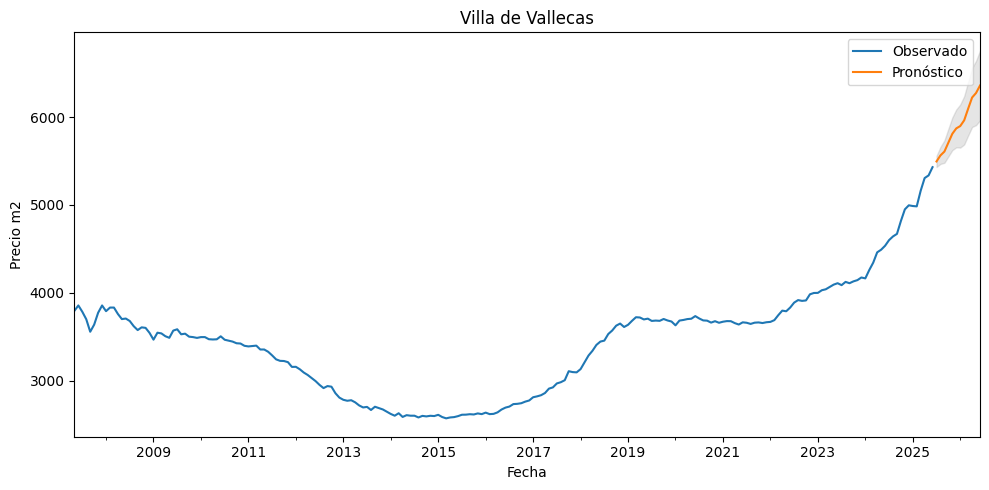

Entrenando modelo para distrito: Barajas


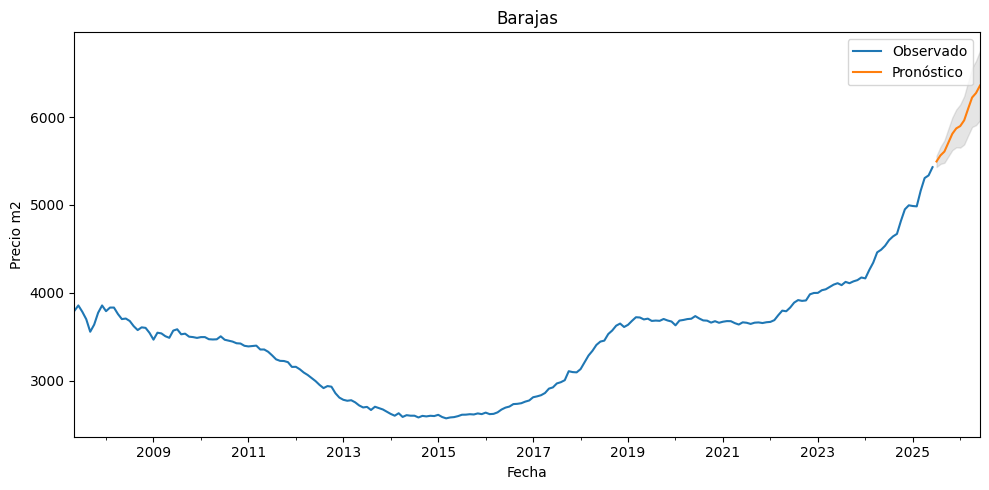

Entrenando modelo para distrito: Moratalaz


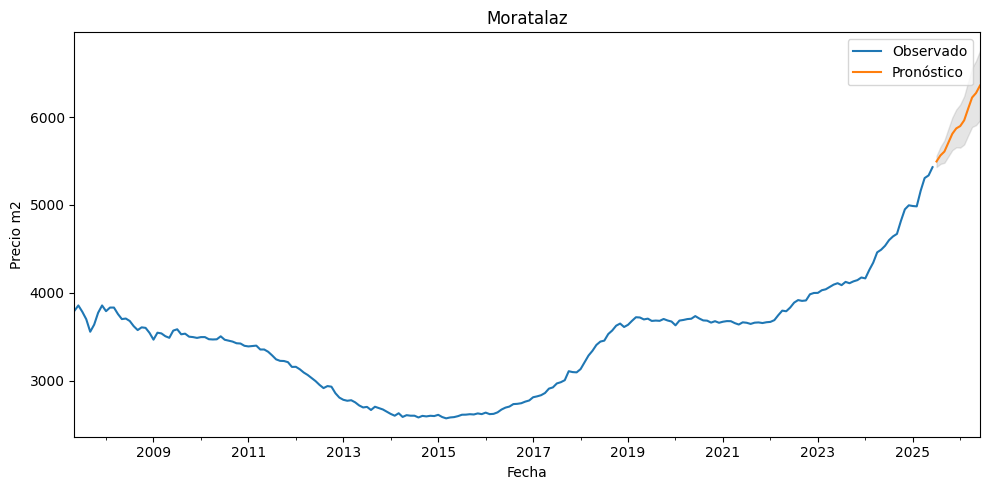

Entrenando modelo para distrito: Vicálvaro


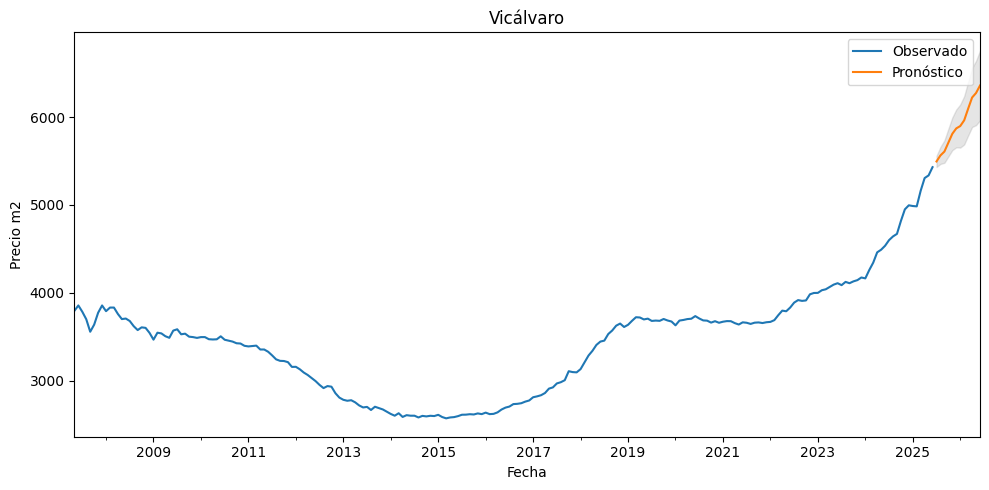

In [123]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")


# Extraemos lista de distritos únicos
distritos = df_total['Distrito'].unique()

# Diccionario para guardar resultados
resultados_sarima = {}

for distrito in distritos:
    print(f"Entrenando modelo para distrito: {distrito}")
    
    
    # Ajustar modelo SARIMA simple 
    modelo = SARIMAX(df_distrito['Precio m2'],
                     order=(1, 1, 1),
                     seasonal_order=(1, 1, 1, 12),
                     enforce_stationarity=False,
                     enforce_invertibility=False)
    
    resultado = modelo.fit(disp=False)
    
    # Guardamos resultados
    resultados_sarima[distrito] = resultado

    # Hacer predicción a 12 meses
    pred = resultado.get_forecast(steps=12)
    pred_ci = pred.conf_int()

    # Graficar resultados
    ax = df_distrito['Precio m2'].plot(label='Observado', figsize=(10, 5), title=distrito)
    pred.predicted_mean.plot(ax=ax, label='Pronóstico')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='gray', alpha=0.2)
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Precio m2')
    plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
# Convertir lista a DataFrame y guardar
df_predicciones2 = pd.DataFrame(resultados_sarima)
df_predicciones2.to_csv("predicciones_sarima.csv", index=False, encoding="utf-8-sig")

print("✅ Predicciones guardadas en 'predicciones_sarima.csv'")

## Evaluar modelo de predicción


Entrenando SARIMA para: Tetuán
SARIMA - Tetuán
MAE : 221.15  (6.42 % del precio medio)
RMSE: 254.86 (7.39 % del precio medio)
MAPE: 4.31%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 3447.27 €/m²


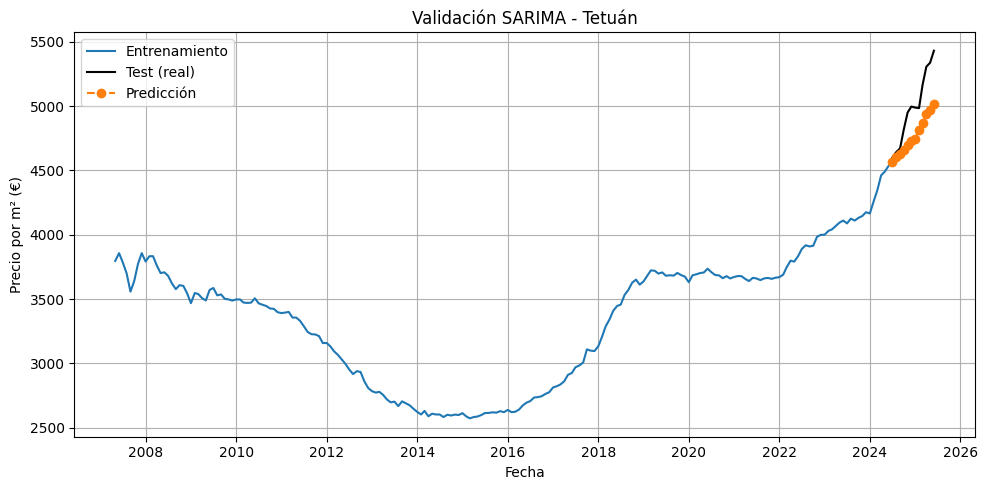


Entrenando SARIMA para: Carabanchel
SARIMA - Carabanchel
MAE : 133.61  (5.95 % del precio medio)
RMSE: 177.30 (7.90 % del precio medio)
MAPE: 4.30%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 2243.95 €/m²


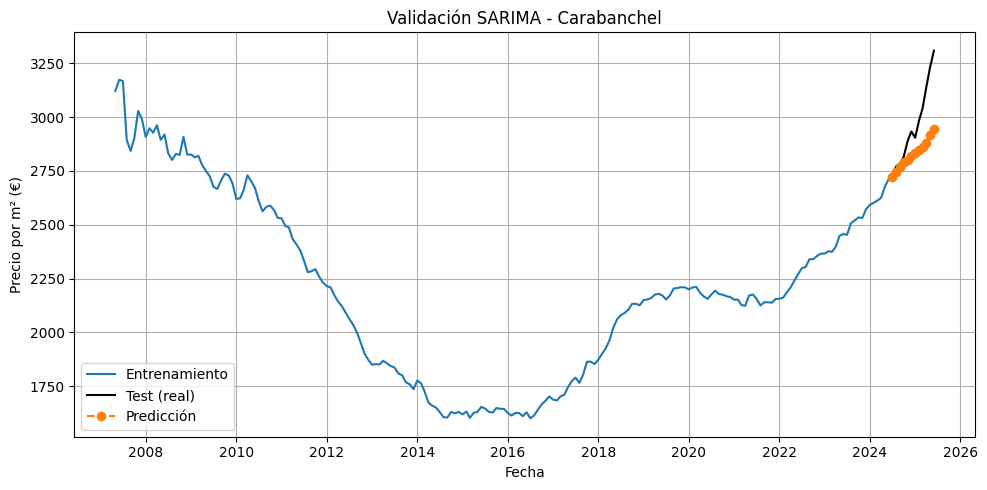


Entrenando SARIMA para: Centro
SARIMA - Centro
MAE : 489.82  (11.07 % del precio medio)
RMSE: 558.55 (12.62 % del precio medio)
MAPE: 7.14%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 4426.69 €/m²


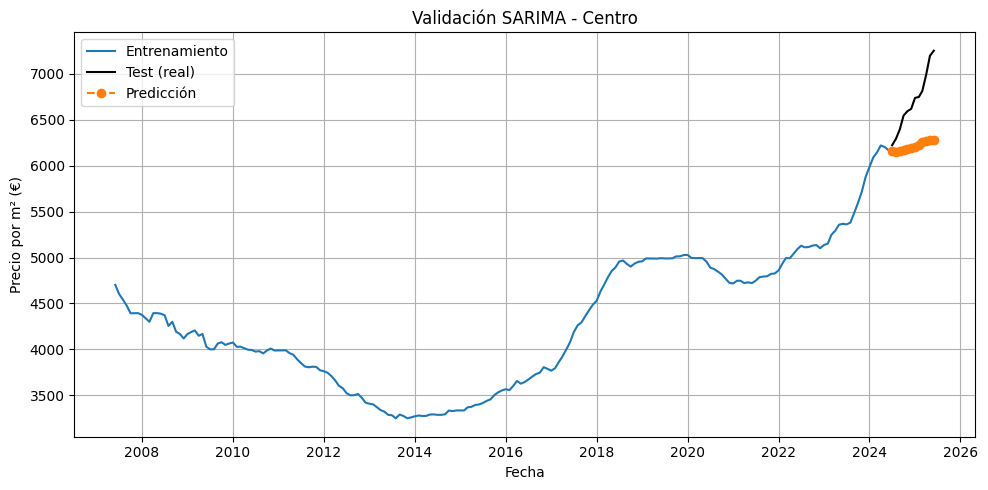


Entrenando SARIMA para: Puente de Vallecas
SARIMA - Puente de Vallecas
MAE : 171.20  (8.66 % del precio medio)
RMSE: 204.98 (10.37 % del precio medio)
MAPE: 6.39%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 1975.95 €/m²


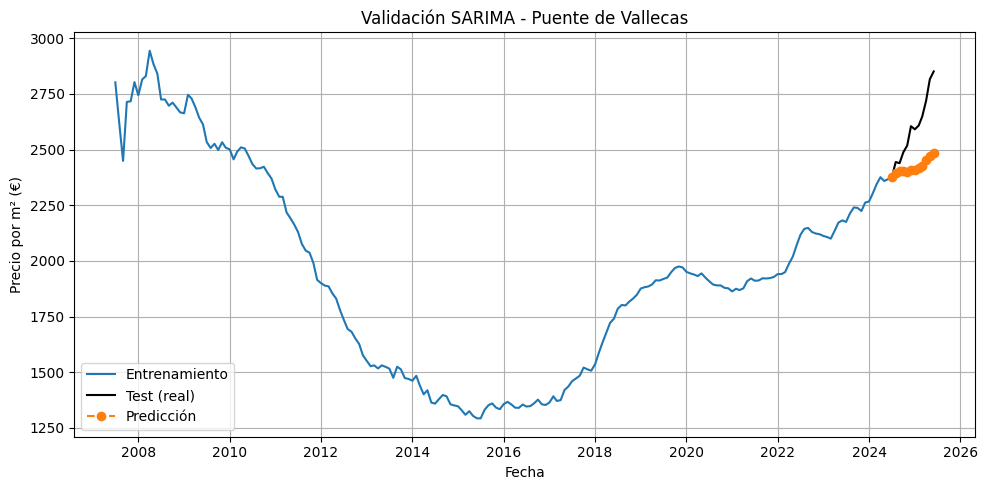


Entrenando SARIMA para: Ciudad Lineal
SARIMA - Ciudad Lineal
MAE : 293.06  (9.75 % del precio medio)
RMSE: 344.63 (11.46 % del precio medio)
MAPE: 6.91%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 3006.33 €/m²


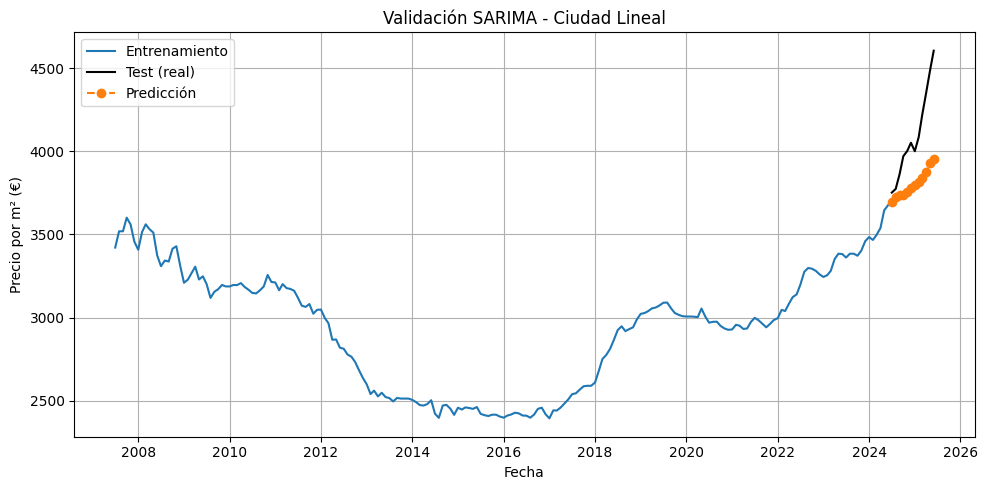


Entrenando SARIMA para: San Blas
SARIMA - San Blas
MAE : 205.67  (7.84 % del precio medio)
RMSE: 256.45 (9.77 % del precio medio)
MAPE: 6.06%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 2624.69 €/m²


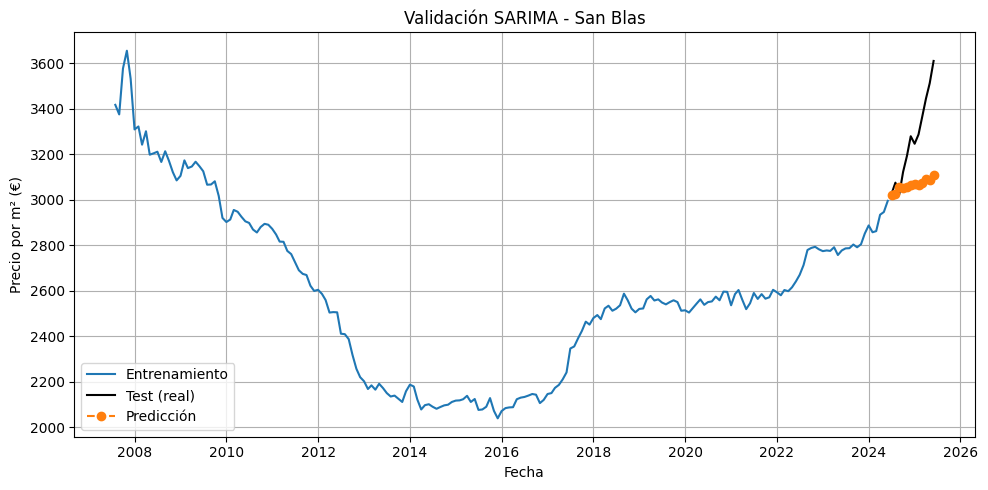


Entrenando SARIMA para: Moncloa
SARIMA - Moncloa
MAE : 319.94  (8.45 % del precio medio)
RMSE: 367.13 (9.70 % del precio medio)
MAPE: 5.86%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 3785.82 €/m²


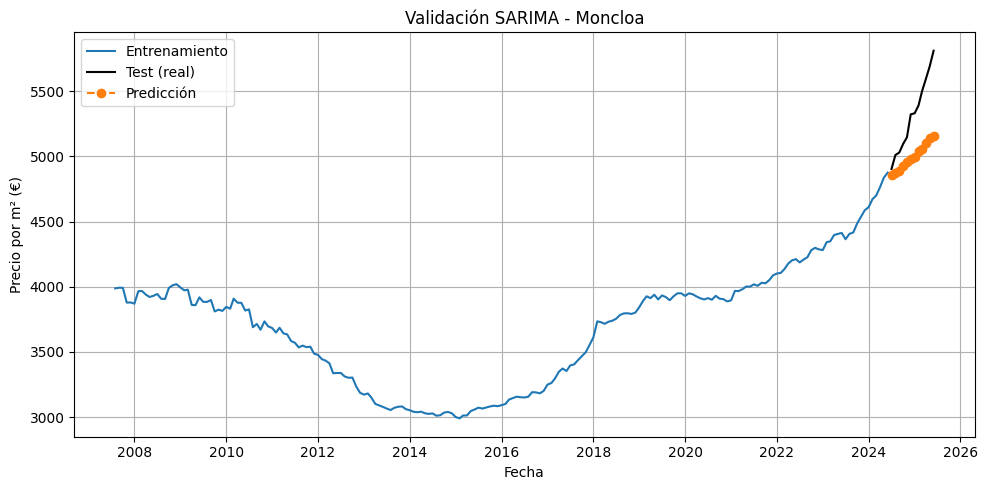


Entrenando SARIMA para: Fuencarral
SARIMA - Fuencarral
MAE : 267.87  (7.99 % del precio medio)
RMSE: 342.31 (10.21 % del precio medio)
MAPE: 5.79%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 3352.71 €/m²


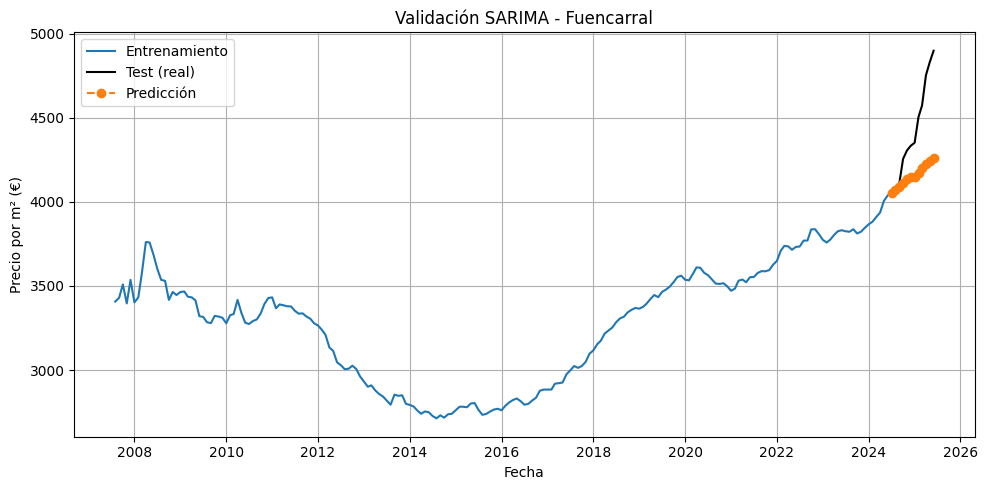


Entrenando SARIMA para: Hortaleza
SARIMA - Hortaleza
MAE : 208.95  (5.99 % del precio medio)
RMSE: 267.74 (7.68 % del precio medio)
MAPE: 4.37%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 3487.28 €/m²


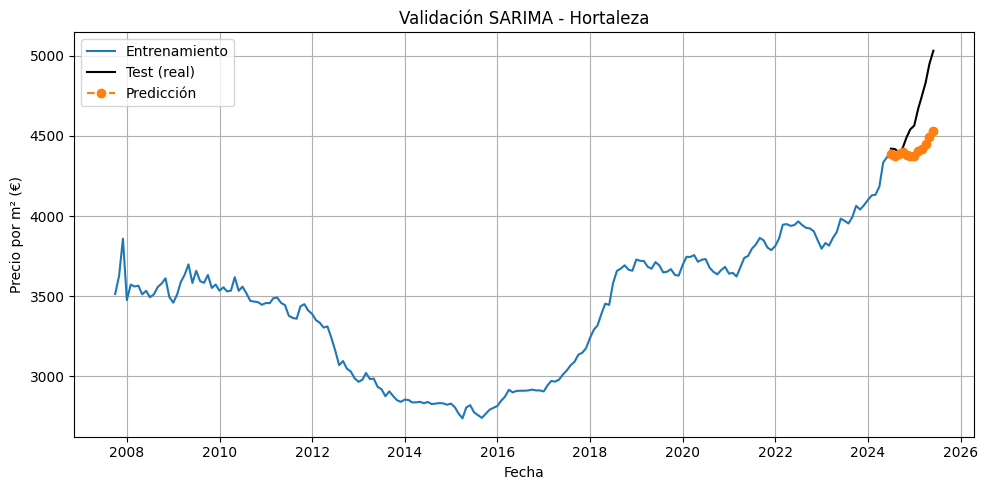


Entrenando SARIMA para: Chamartín
SARIMA - Chamartín
MAE : 327.93  (6.83 % del precio medio)
RMSE: 404.35 (8.42 % del precio medio)
MAPE: 4.70%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 4804.63 €/m²


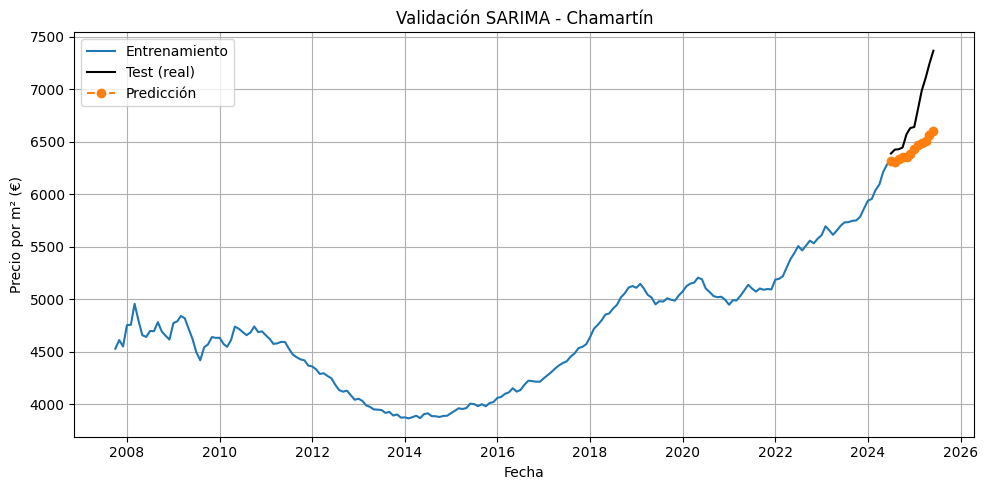


Entrenando SARIMA para: Usera
SARIMA - Usera
MAE : 245.30  (11.81 % del precio medio)
RMSE: 266.61 (12.83 % del precio medio)
MAPE: 8.65%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 2077.24 €/m²


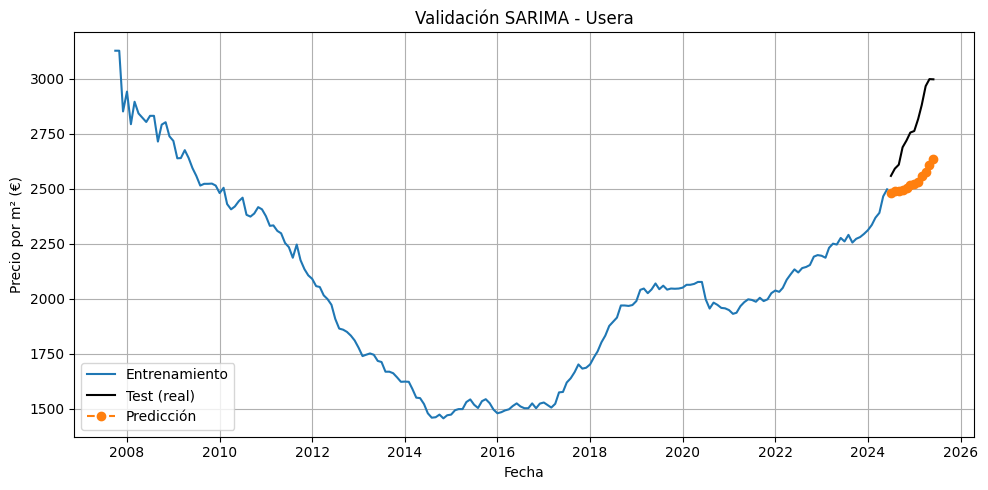


Entrenando SARIMA para: Salamanca
SARIMA - Salamanca
MAE : 542.44  (10.21 % del precio medio)
RMSE: 632.93 (11.91 % del precio medio)
MAPE: 5.87%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 5314.17 €/m²


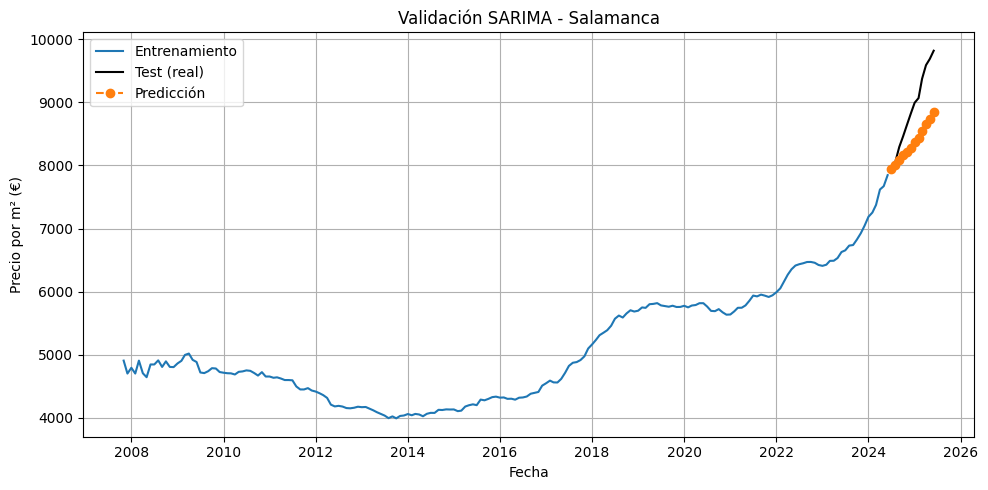


Entrenando SARIMA para: Latina
SARIMA - Latina
MAE : 279.98  (12.25 % del precio medio)
RMSE: 330.99 (14.49 % del precio medio)
MAPE: 8.50%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 2284.87 €/m²


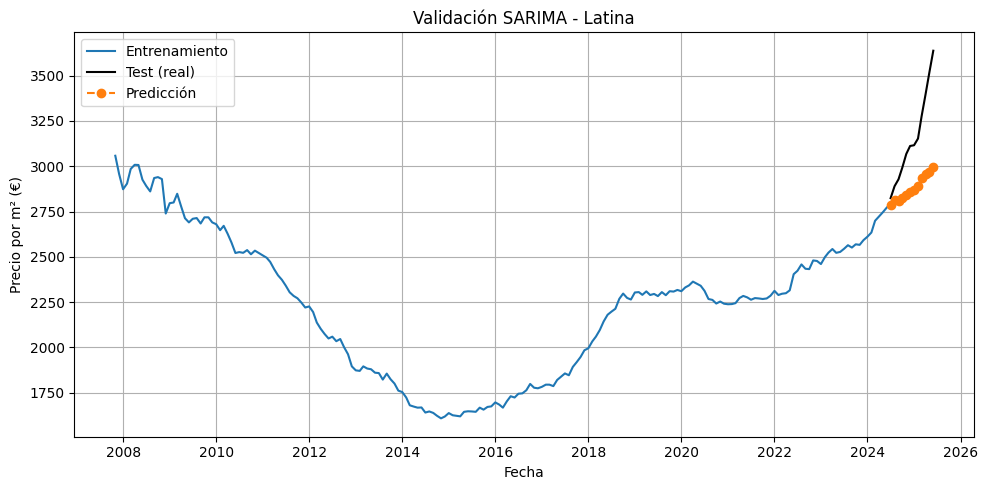


Entrenando SARIMA para: Arganzuela
SARIMA - Arganzuela
MAE : 148.31  (4.06 % del precio medio)
RMSE: 191.02 (5.22 % del precio medio)
MAPE: 2.73%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 3656.17 €/m²


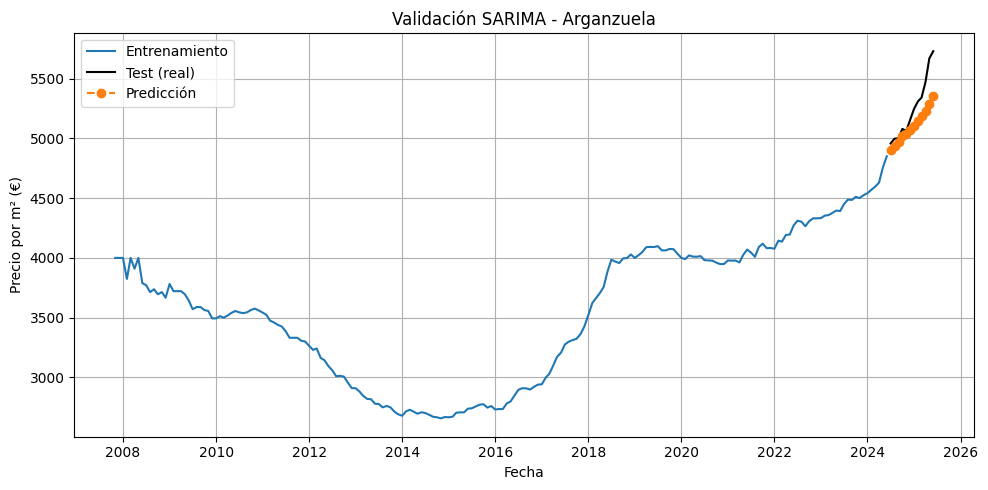


Entrenando SARIMA para: Villaverde
SARIMA - Villaverde
MAE : 80.38  (4.44 % del precio medio)
RMSE: 101.06 (5.58 % del precio medio)
MAPE: 3.57%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 1812.32 €/m²


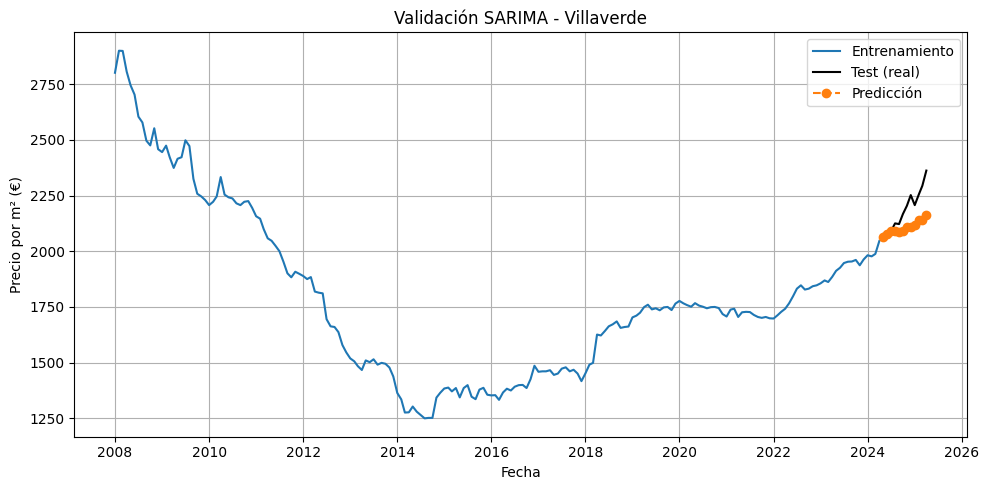


Entrenando SARIMA para: Chamberí
SARIMA - Chamberí
MAE : 367.40  (7.57 % del precio medio)
RMSE: 441.21 (9.09 % del precio medio)
MAPE: 4.76%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 4855.17 €/m²


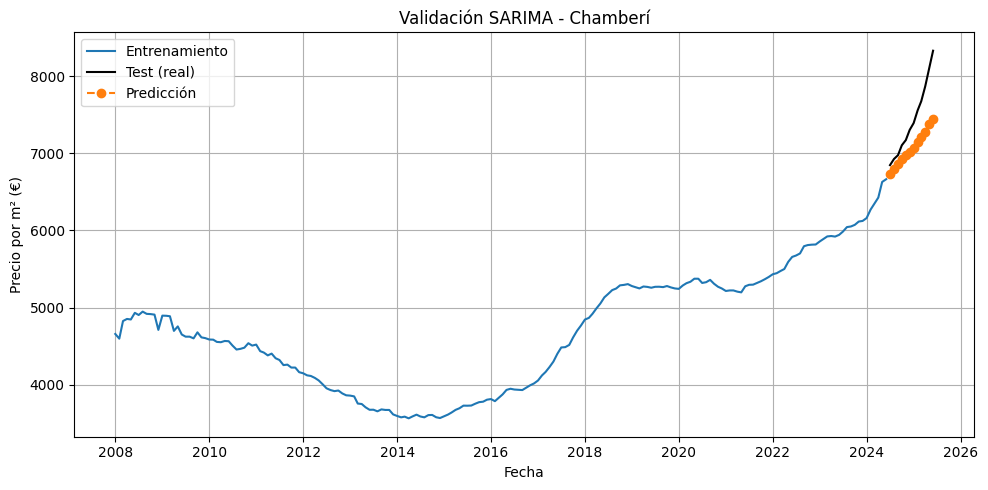


Entrenando SARIMA para: Retiro
SARIMA - Retiro
MAE : 850.31  (20.20 % del precio medio)
RMSE: 949.75 (22.56 % del precio medio)
MAPE: 12.47%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 4209.12 €/m²


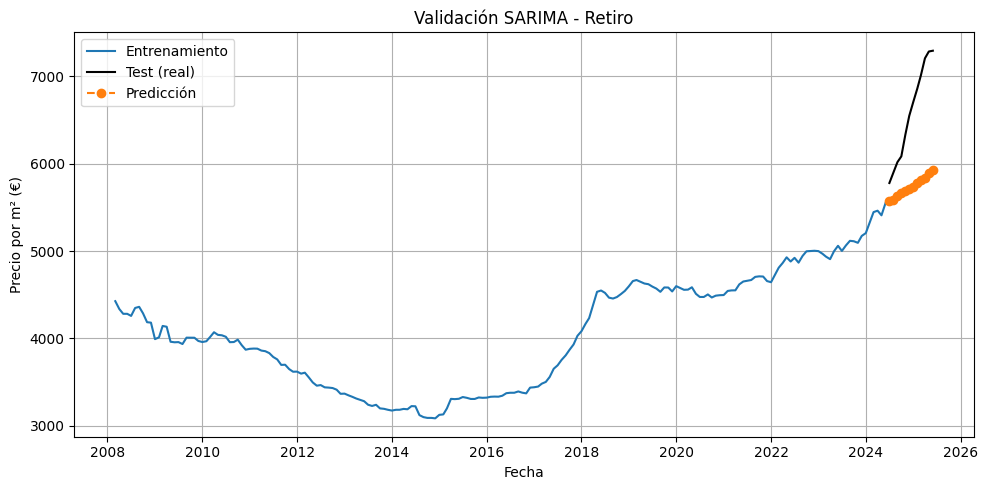


Entrenando SARIMA para: Villa de Vallecas
SARIMA - Villa de Vallecas
MAE : 148.05  (6.17 % del precio medio)
RMSE: 177.33 (7.39 % del precio medio)
MAPE: 4.77%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 2399.32 €/m²


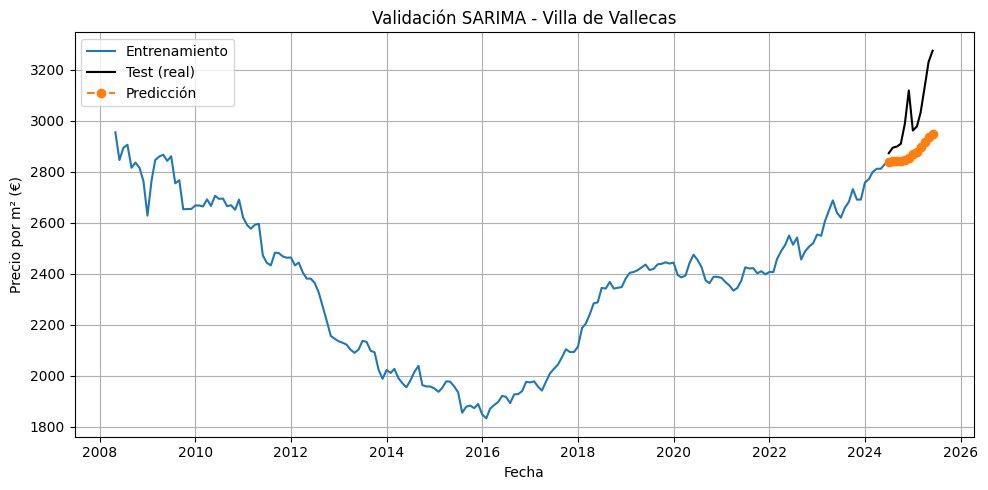


Entrenando SARIMA para: Barajas
SARIMA - Barajas
MAE : 225.73  (7.28 % del precio medio)
RMSE: 288.92 (9.32 % del precio medio)
MAPE: 5.44%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 3101.27 €/m²


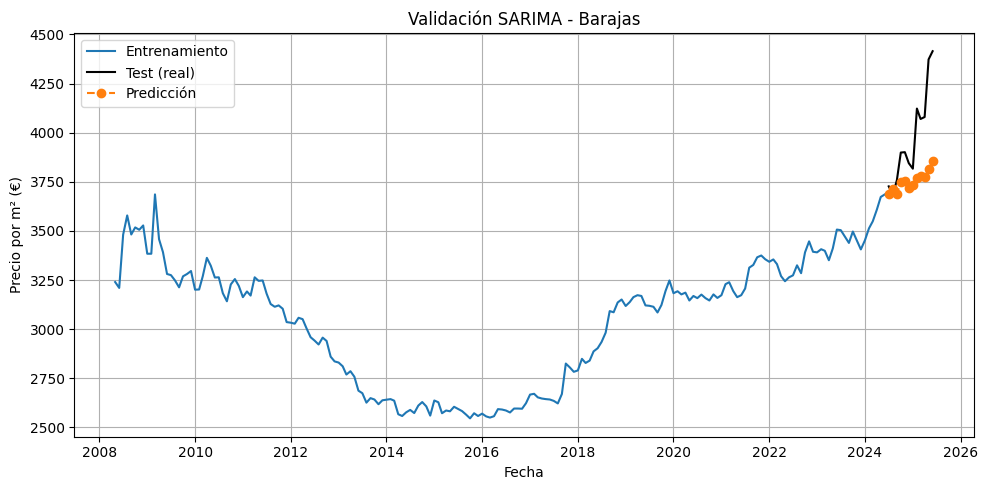


Entrenando SARIMA para: Moratalaz
SARIMA - Moratalaz
MAE : 283.02  (11.67 % del precio medio)
RMSE: 344.37 (14.20 % del precio medio)
MAPE: 7.84%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 2425.56 €/m²


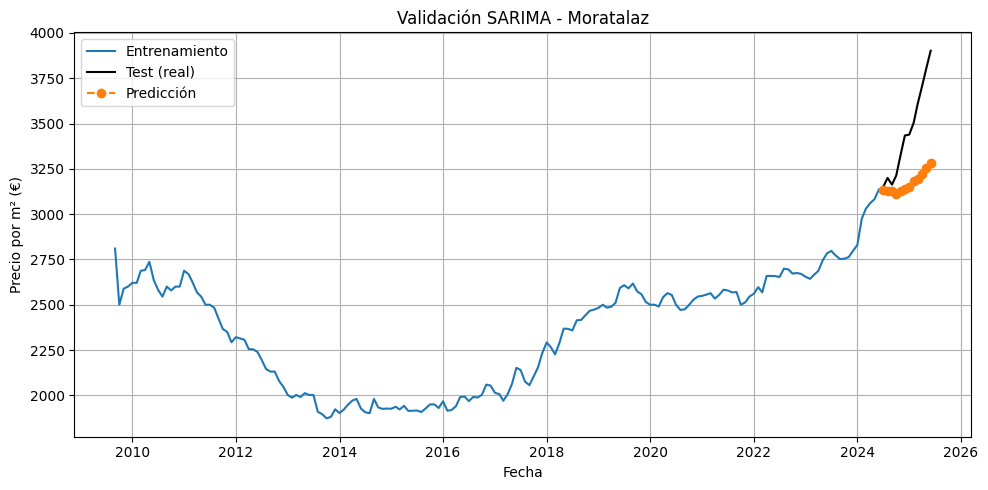


Entrenando SARIMA para: Vicálvaro
SARIMA - Vicálvaro
MAE : 225.65  (9.94 % del precio medio)
RMSE: 250.30 (11.03 % del precio medio)
MAPE: 6.96%
Ljung-Box p-value: 0.0000 -> No pasa
Precio medio: 2269.54 €/m²


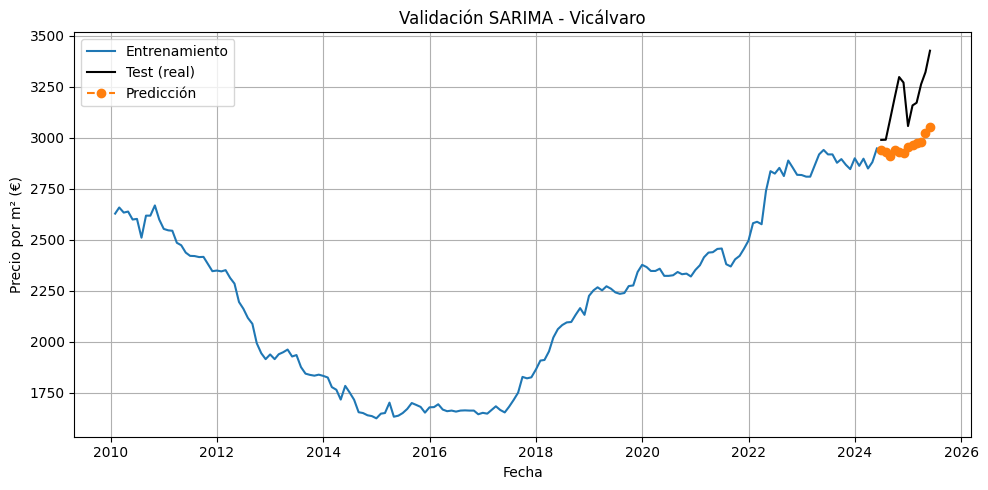

In [132]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# Asegurar índice temporal
df_total = df_total.copy()

# Configuración
n_test = 12
resultados_sarima = {}

# Iterar por distrito
for distrito in df_total['Distrito'].unique():
    print(f"\nEntrenando SARIMA para: {distrito}")
    
    # Serie temporal mensual
    serie = df_total[df_total['Distrito'] == distrito]['Precio m2']
    serie = serie.asfreq('MS').interpolate()

    if len(serie) <= n_test + 12:
        print(f"Serie muy corta para {distrito}, saltando...")
        continue

    train = serie[:-n_test]
    test = serie[-n_test:]

    # Ajustar modelo SARIMA
    try:
        modelo = SARIMAX(train,
                         order=(1, 1, 1),
                         seasonal_order=(1, 1, 1, 12),
                         enforce_stationarity=False,
                         enforce_invertibility=False).fit(disp=False)
    except:
        print(f"Error al ajustar SARIMA para {distrito}, saltando...")
        continue

    pred = modelo.forecast(steps=n_test)

    # Métricas
    mae = mean_absolute_error(test, pred)
    rmse = np.sqrt(mean_squared_error(test, pred))
    mape = np.mean(np.abs((test - pred) / test)) * 100

    precio_medio = serie.mean()
    pct_mae = (mae / precio_medio) * 100
    pct_rmse = (rmse / precio_medio) * 100

    # Test de Ljung-Box sobre los residuos
    residuos = modelo.resid
    lb_test = acorr_ljungbox(residuos, lags=[12], return_df=True)  # lag 12 para datos mensuales
    p_value = lb_test['lb_pvalue'].iloc[0]
    pasa_ljungbox = p_value > 0.05  

    resultados_sarima[distrito] = {
        'MAE': mae,
        'RMSE': rmse,
        'MAPE': mape,
        'MAE %': pct_mae,
        'RMSE %': pct_rmse,
        'Precio Medio': precio_medio,
        'Ljung-Box OK': pasa_ljungbox,
        'p-value Ljung-Box': p_value,
        'Test Real': test,
        'Predicción': pred
    }

    # Mostrar métricas
    print(f"SARIMA - {distrito}")
    print(f"MAE : {mae:.2f}  ({pct_mae:.2f} % del precio medio)")
    print(f"RMSE: {rmse:.2f} ({pct_rmse:.2f} % del precio medio)")
    print(f"MAPE: {mape:.2f}%")
    print(f"Ljung-Box p-value: {p_value:.4f} -> {'Pasa' if pasa_ljungbox else 'No pasa'}")
    print(f"Precio medio: {precio_medio:.2f} €/m²")

    # --- Visualización ---
    plt.figure(figsize=(10, 5))
    plt.plot(train, label='Entrenamiento')
    plt.plot(test, label='Test (real)', color='black')
    plt.plot(pred, label='Predicción', linestyle='--', marker='o')

    #leyenda_texto = (
      #  f"Precio medio: {precio_medio:.2f} €/m²\n"
      #  f"MAE: {mae:.2f} ({pct_mae:.2f}%)\n"
      #  f"RMSE: {rmse:.2f} ({pct_rmse:.2f}%)\n"
       # f"Ljung-Box: {'OK' if pasa_ljungbox else 'NO'}"
    #)
    #plt.text(
      #  0.01, 0.97, leyenda_texto,
       # transform=plt.gca().transAxes,
      #  fontsize=10,
      #  verticalalignment='top',
      #  bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray')
   # )

    plt.title(f"Validación SARIMA - {distrito}")
    plt.xlabel("Fecha")
    plt.ylabel("Precio por m² (€)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [133]:
# === Tabla de métricas por distrito ===
cols = ['Precio Medio', 'MAE', 'MAE %', 'RMSE', 'RMSE %', 'MAPE']
df_metricas = (
    pd.DataFrame.from_dict(resultados_sarima, orient='index')[cols]
      .sort_values(by='MAPE')        # ordena de mejor a peor (menor % error)
      .round(2)
)

print(df_metricas)

# Guardar a CSV
df_metricas.to_csv("metricas_sarima_por_distrito.csv", encoding="utf-8-sig")

                    Precio Medio     MAE  MAE %    RMSE  RMSE %   MAPE
Arganzuela               3656.17  148.31   4.06  191.02    5.22   2.73
Villaverde               1812.32   80.38   4.44  101.06    5.58   3.57
Carabanchel              2243.95  133.61   5.95  177.30    7.90   4.30
Tetuán                   3447.27  221.15   6.42  254.86    7.39   4.31
Hortaleza                3487.28  208.95   5.99  267.74    7.68   4.37
Chamartín                4804.63  327.93   6.83  404.35    8.42   4.70
Chamberí                 4855.17  367.40   7.57  441.21    9.09   4.76
Villa de Vallecas        2399.32  148.05   6.17  177.33    7.39   4.77
Barajas                  3101.27  225.73   7.28  288.92    9.32   5.44
Fuencarral               3352.71  267.87   7.99  342.31   10.21   5.79
Moncloa                  3785.82  319.94   8.45  367.13    9.70   5.86
Salamanca                5314.17  542.44  10.21  632.93   11.91   5.87
San Blas                 2624.69  205.67   7.84  256.45    9.77   6.06
Puente

## 3. Optimización de SARIMA por AIC

Buscando mejor modelo para distrito: Tetuán
Mejor modelo para Tetuán: SARIMA(2, 2, 2)x(1, 1, 1, 12) - AIC:1849.7607033157622


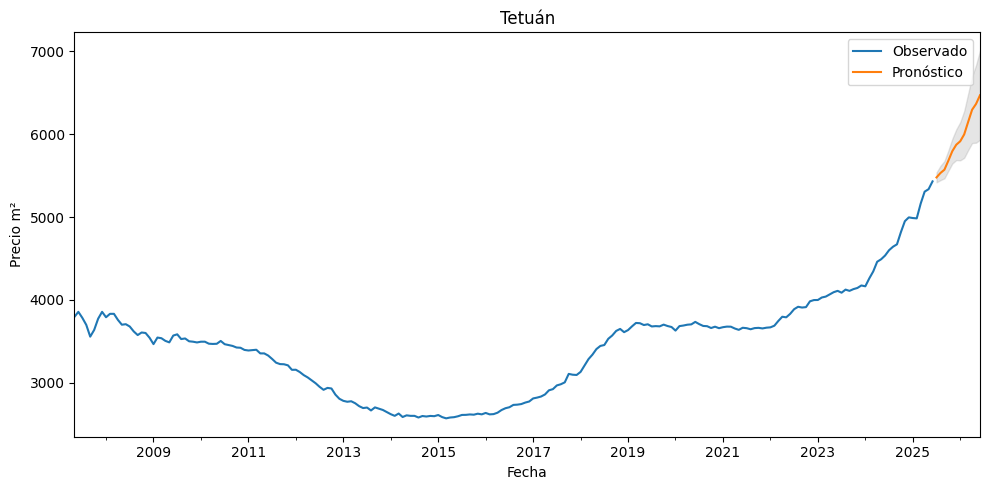

Buscando mejor modelo para distrito: Carabanchel
Mejor modelo para Carabanchel: SARIMA(0, 2, 2)x(1, 1, 1, 12) - AIC:1781.858821183449


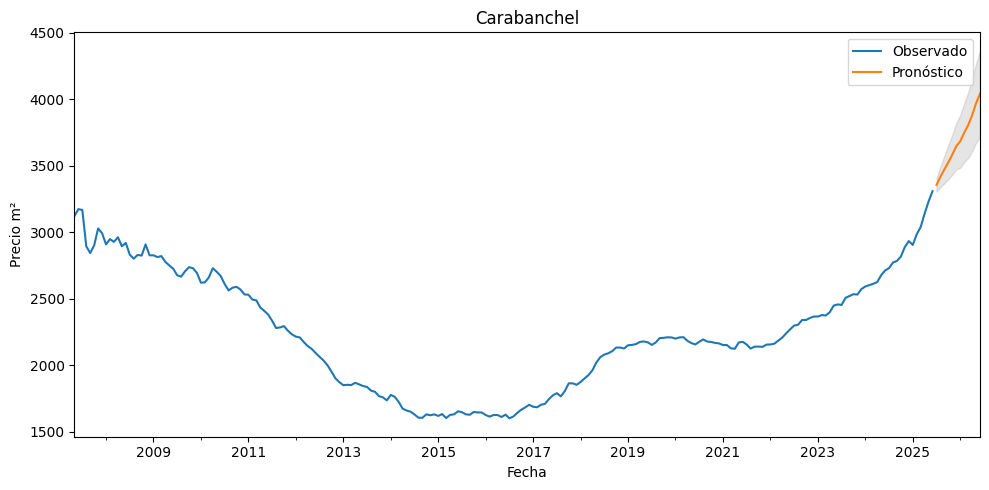

Buscando mejor modelo para distrito: Centro
Mejor modelo para Centro: SARIMA(0, 2, 2)x(0, 1, 1, 12) - AIC:1893.8556725155468


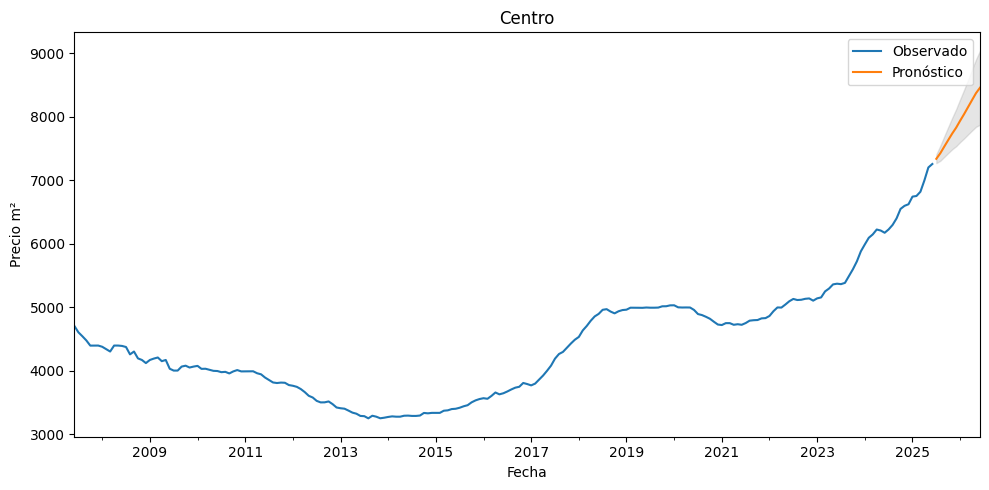

Buscando mejor modelo para distrito: Puente de Vallecas
Mejor modelo para Puente de Vallecas: SARIMA(2, 2, 2)x(1, 1, 1, 12) - AIC:1742.4633588123577


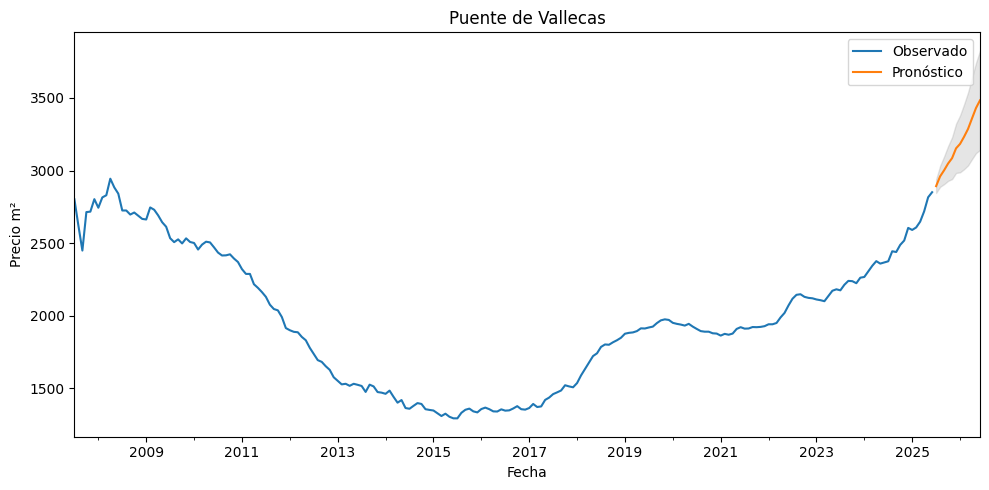

Buscando mejor modelo para distrito: Ciudad Lineal
Mejor modelo para Ciudad Lineal: SARIMA(2, 2, 2)x(1, 1, 1, 12) - AIC:1864.3575814309418


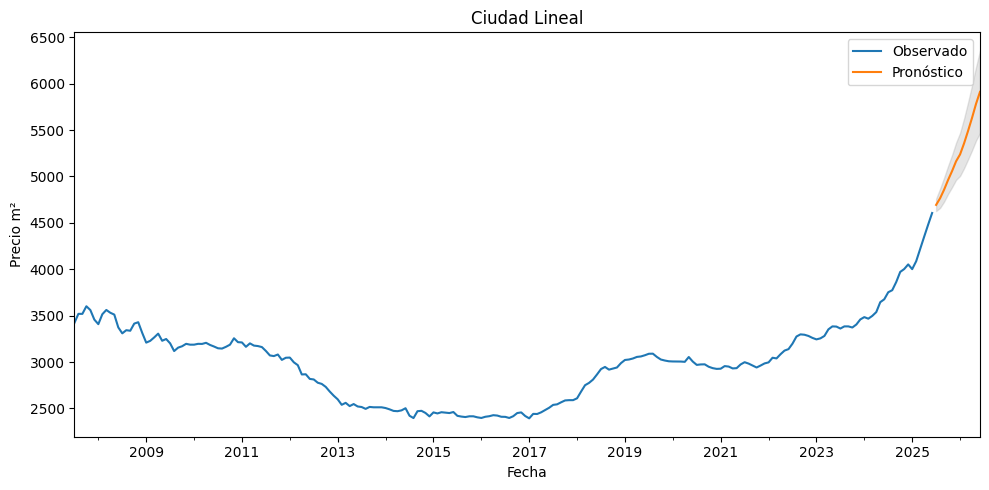

Buscando mejor modelo para distrito: San Blas
Mejor modelo para San Blas: SARIMA(1, 2, 2)x(1, 1, 1, 12) - AIC:1844.0150349546063


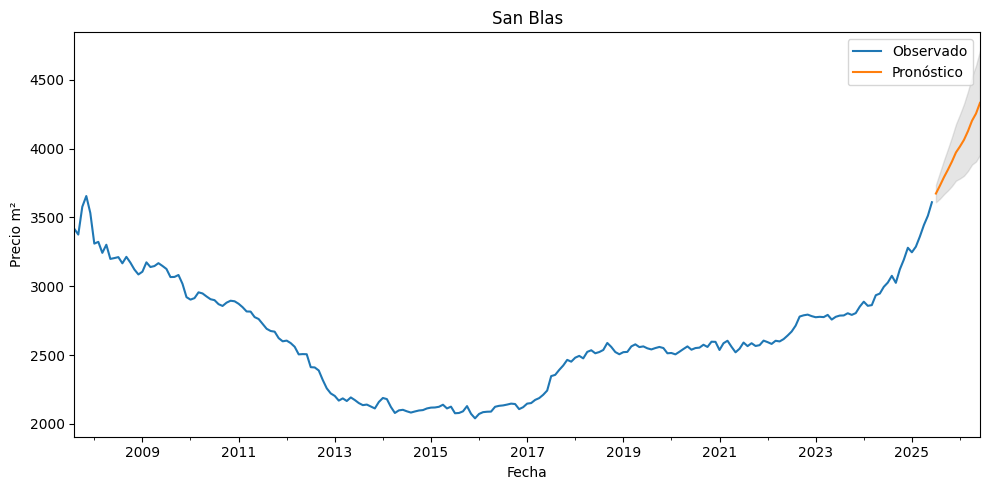

Buscando mejor modelo para distrito: Moncloa
Mejor modelo para Moncloa: SARIMA(1, 2, 2)x(0, 1, 1, 12) - AIC:1812.1076667228115


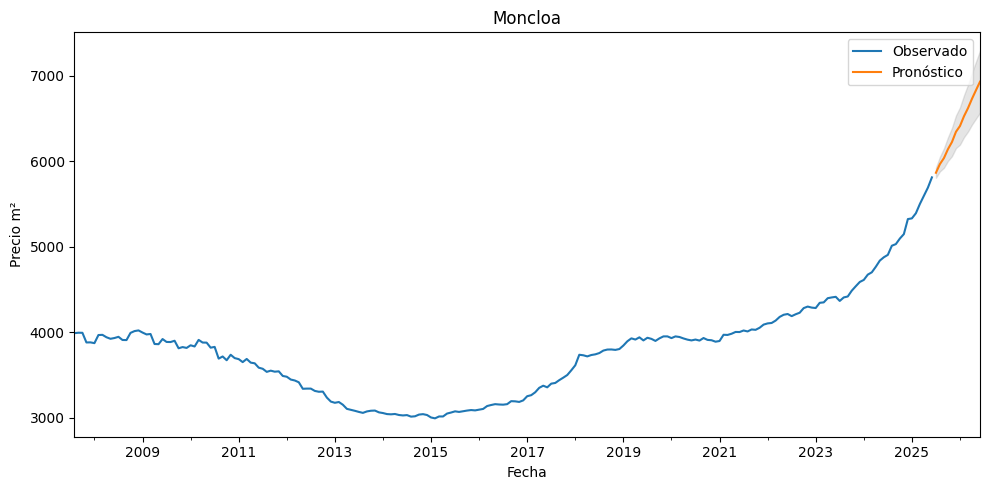

Buscando mejor modelo para distrito: Fuencarral
Mejor modelo para Fuencarral: SARIMA(0, 2, 2)x(1, 1, 1, 12) - AIC:1809.64332530993


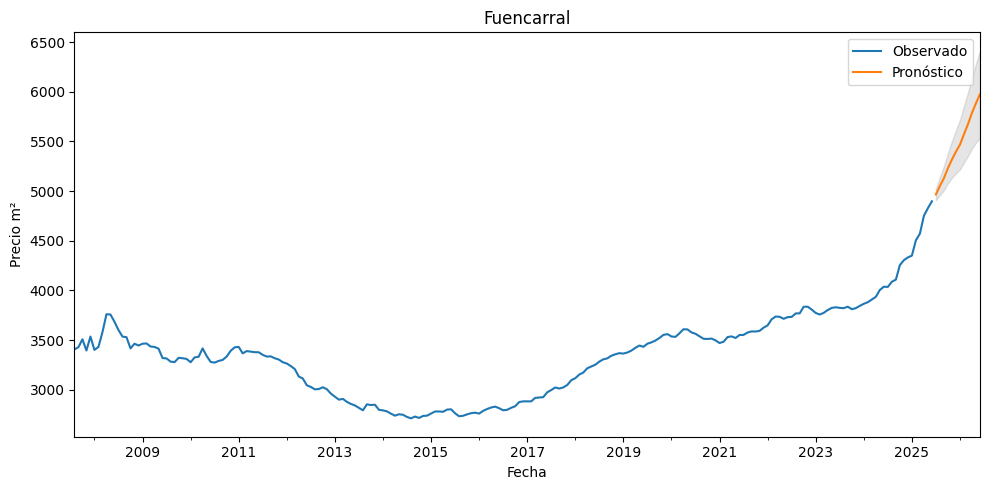

Buscando mejor modelo para distrito: Hortaleza
Mejor modelo para Hortaleza: SARIMA(2, 2, 2)x(0, 1, 1, 12) - AIC:1887.2998292888497


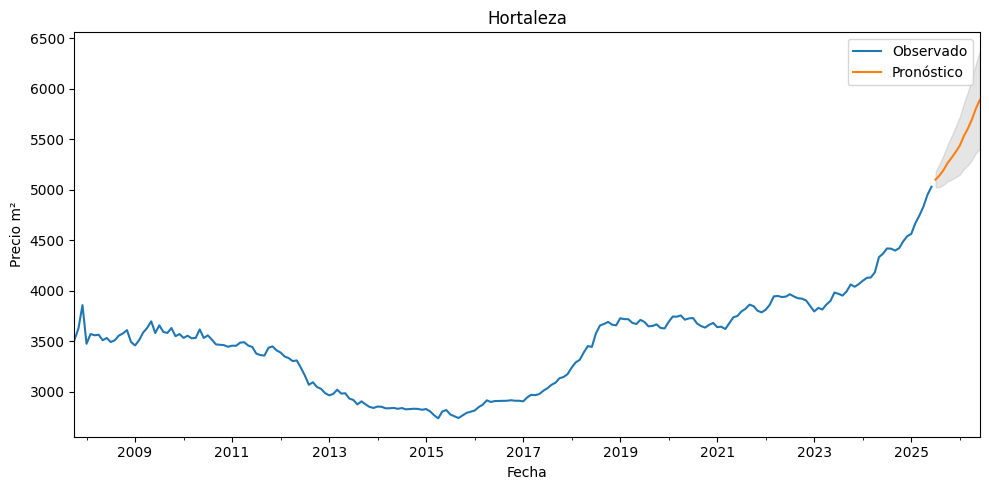

Buscando mejor modelo para distrito: Chamartín
Mejor modelo para Chamartín: SARIMA(2, 2, 2)x(1, 1, 1, 12) - AIC:1924.0379249876173


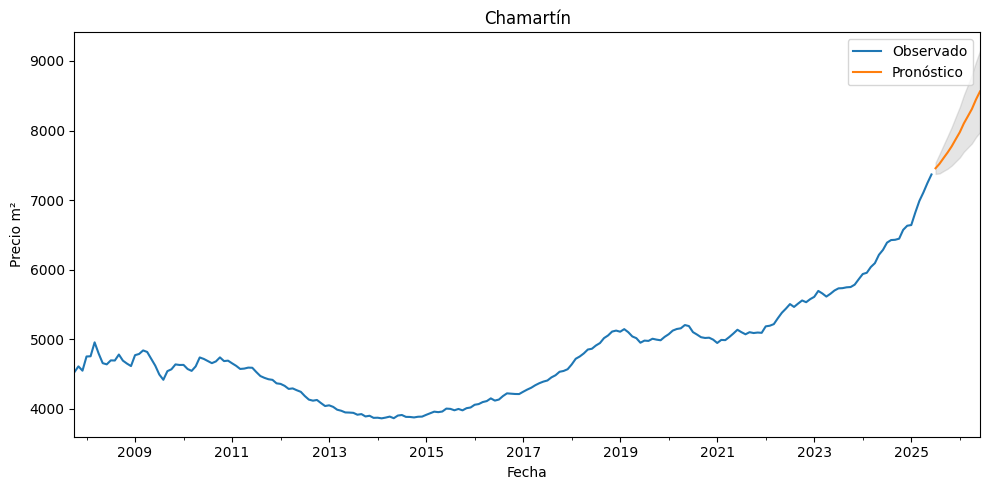

Buscando mejor modelo para distrito: Usera
Mejor modelo para Usera: SARIMA(1, 2, 2)x(1, 1, 1, 12) - AIC:1733.8098530362975


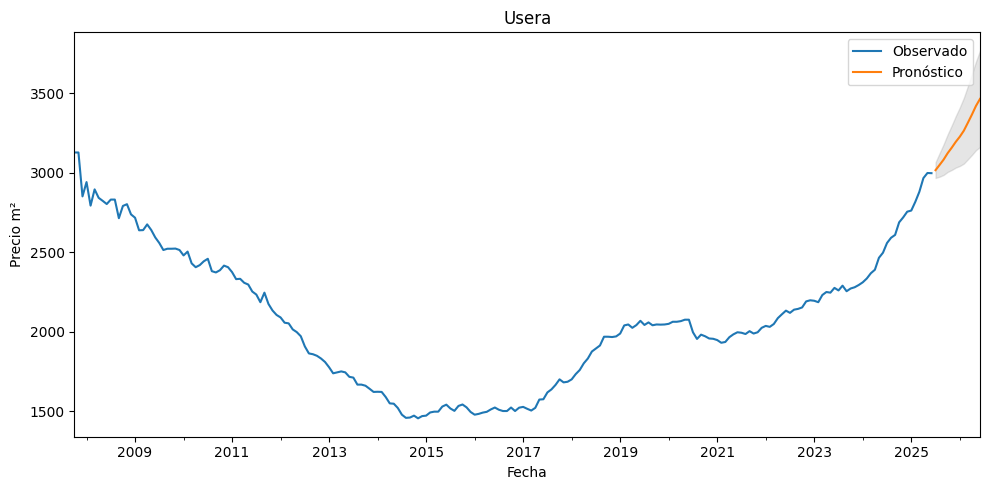

Buscando mejor modelo para distrito: Salamanca
Mejor modelo para Salamanca: SARIMA(0, 2, 2)x(1, 1, 1, 12) - AIC:1948.208261699157


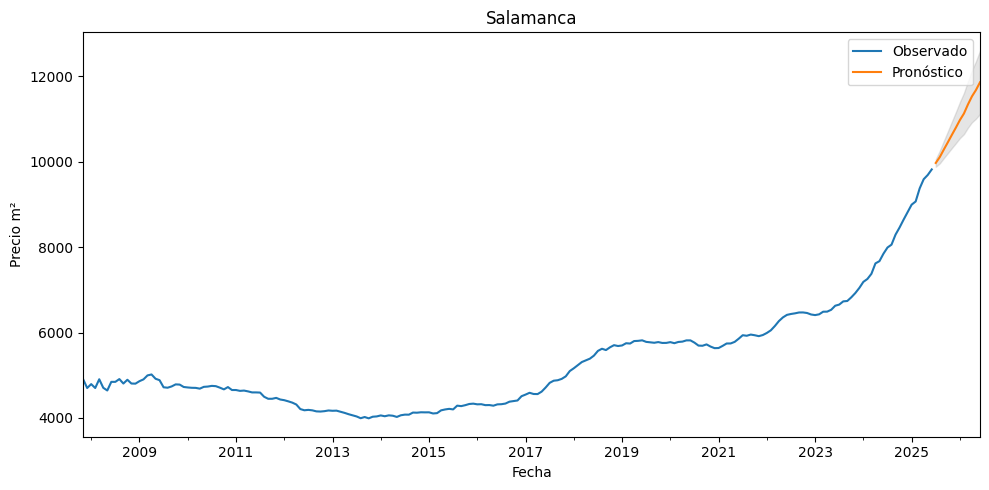

Buscando mejor modelo para distrito: Latina
Mejor modelo para Latina: SARIMA(1, 2, 2)x(0, 1, 1, 12) - AIC:1729.4773438444786


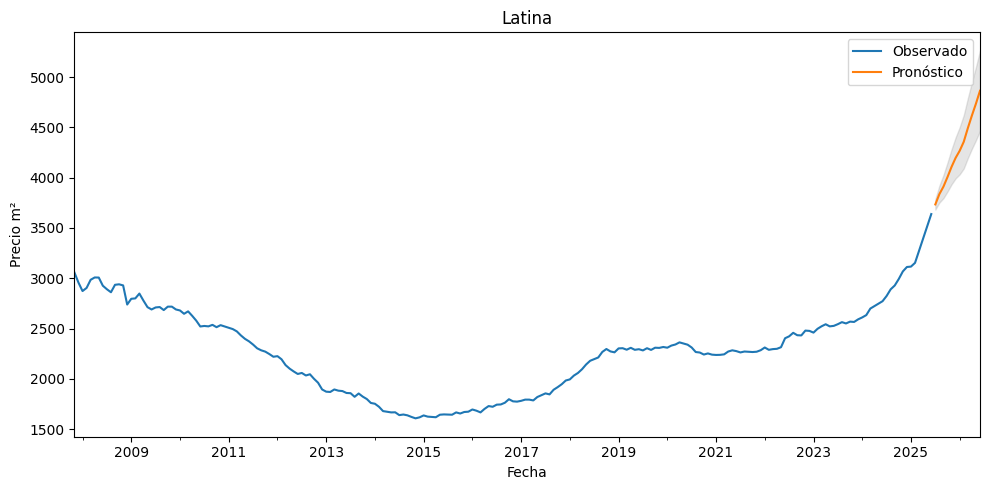

Buscando mejor modelo para distrito: Arganzuela
Mejor modelo para Arganzuela: SARIMA(1, 2, 2)x(1, 1, 1, 12) - AIC:1816.0379092474905


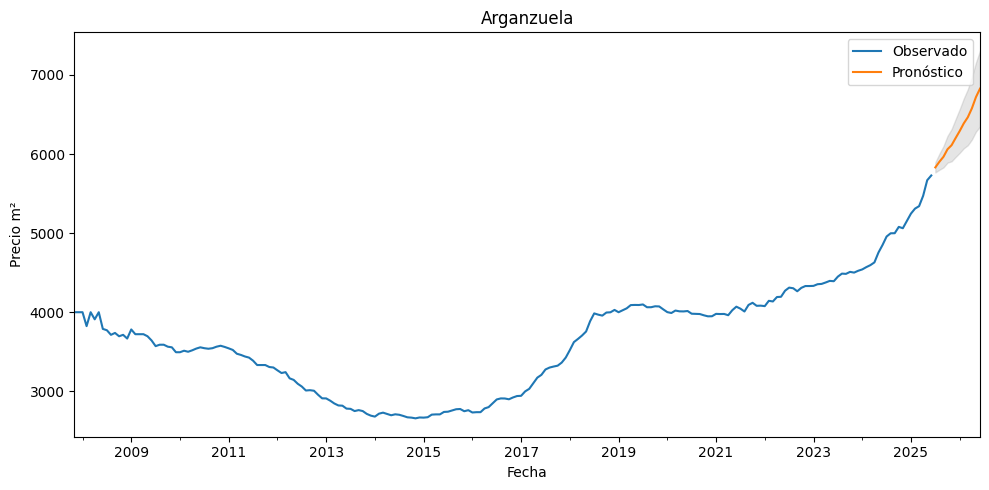

Buscando mejor modelo para distrito: Villaverde
Mejor modelo para Villaverde: SARIMA(0, 2, 2)x(0, 1, 1, 12) - AIC:1740.3208475216293


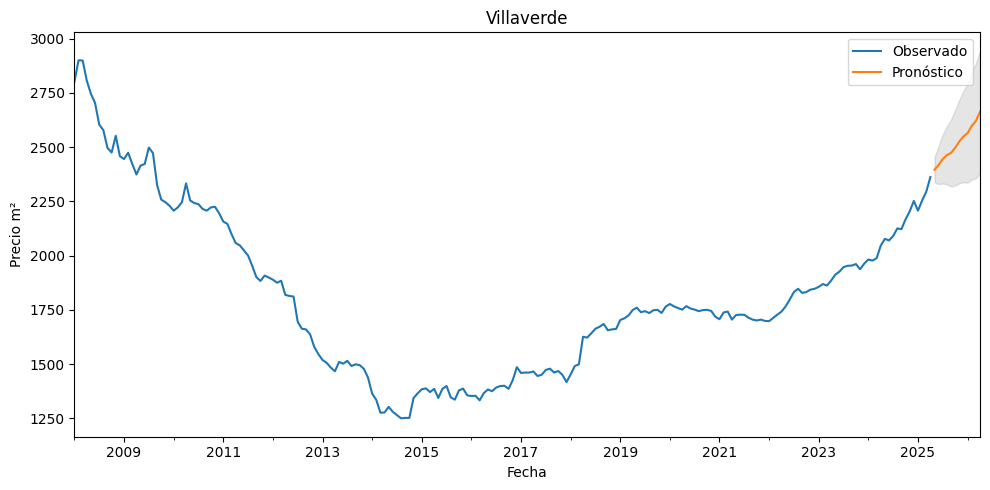

Buscando mejor modelo para distrito: Chamberí
Mejor modelo para Chamberí: SARIMA(0, 2, 2)x(1, 1, 1, 12) - AIC:1837.9325466932708


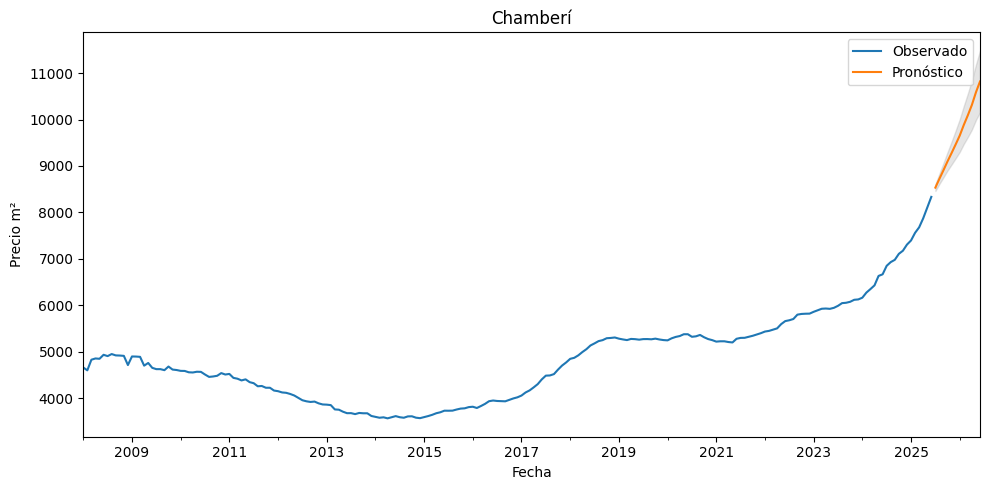

Buscando mejor modelo para distrito: Retiro
Mejor modelo para Retiro: SARIMA(0, 2, 2)x(1, 1, 1, 12) - AIC:1919.3087675074958


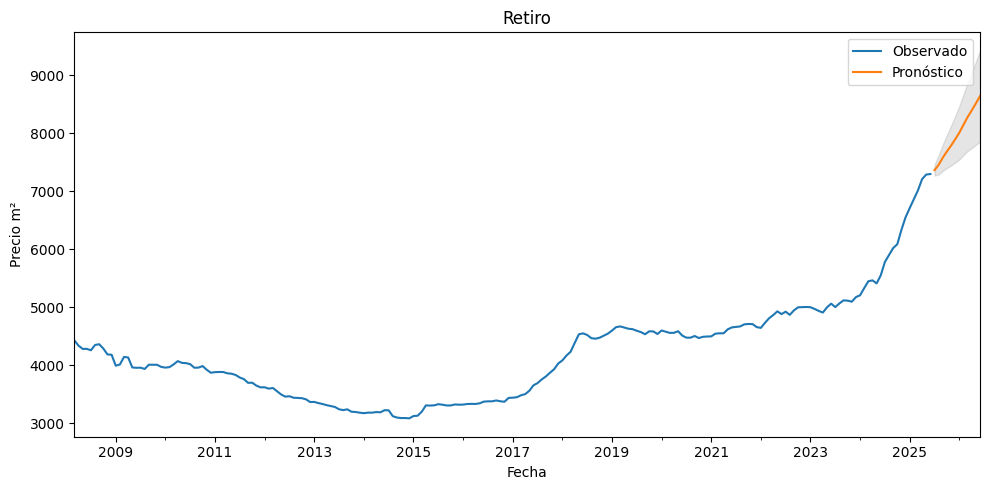

Buscando mejor modelo para distrito: Villa de Vallecas
Mejor modelo para Villa de Vallecas: SARIMA(0, 2, 2)x(1, 1, 1, 12) - AIC:1794.555309515401


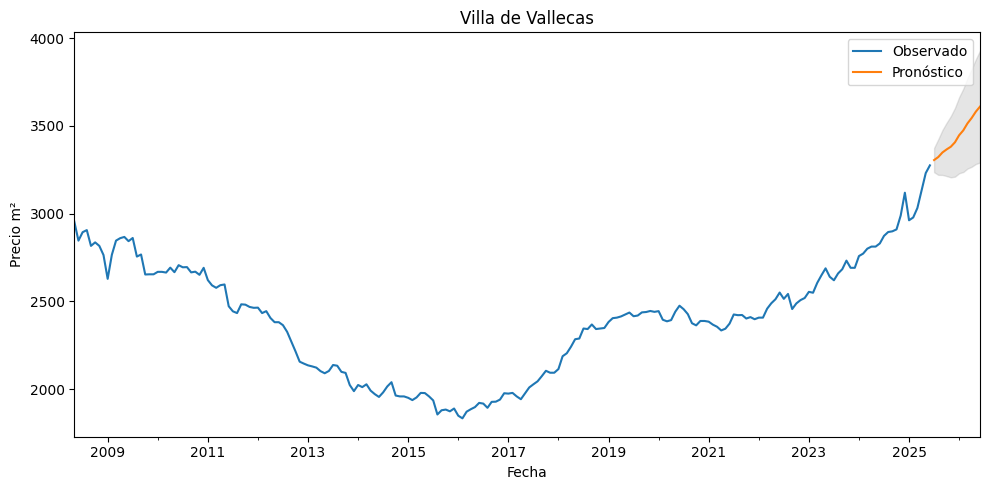

Buscando mejor modelo para distrito: Barajas
Mejor modelo para Barajas: SARIMA(2, 2, 2)x(1, 1, 1, 12) - AIC:1911.7139318182406


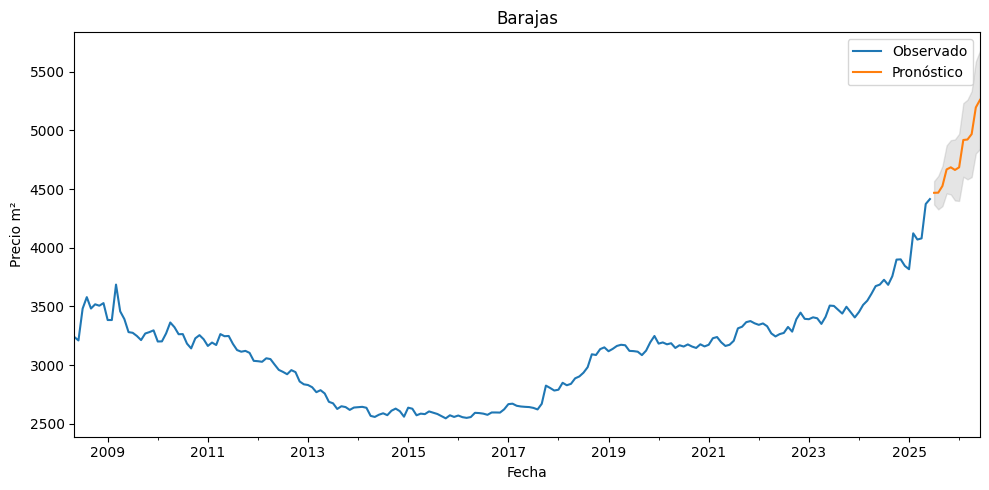

Buscando mejor modelo para distrito: Moratalaz
Mejor modelo para Moratalaz: SARIMA(2, 2, 2)x(0, 1, 1, 12) - AIC:1632.9368315741137


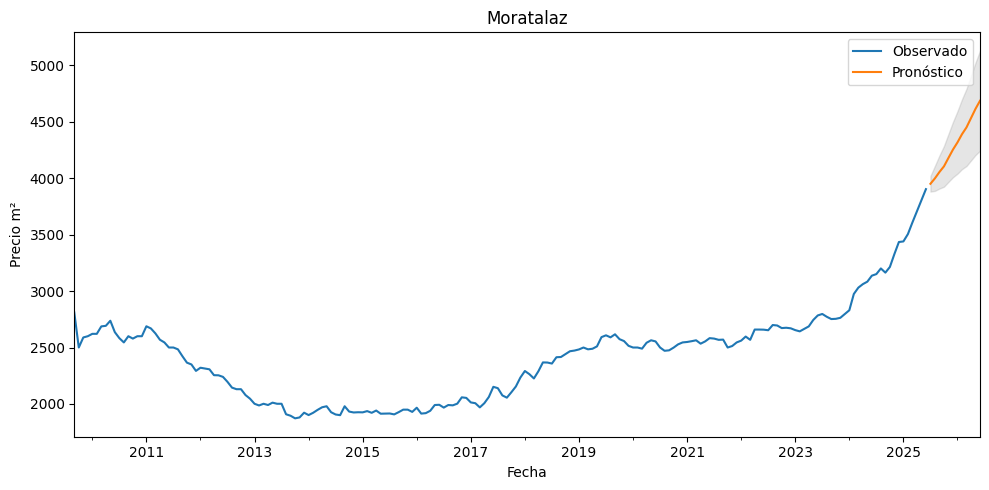

Buscando mejor modelo para distrito: Vicálvaro
Mejor modelo para Vicálvaro: SARIMA(1, 2, 2)x(0, 1, 1, 12) - AIC:1641.321366125587


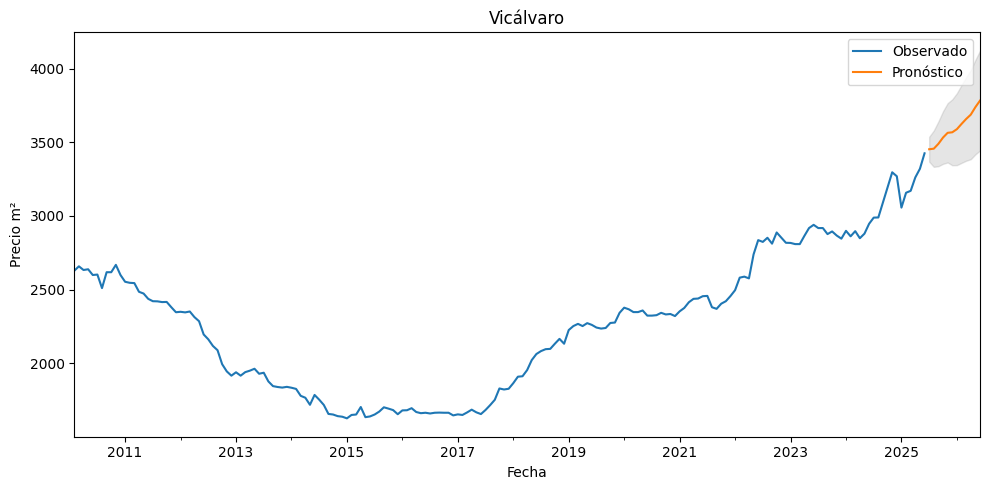

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
import itertools

warnings.filterwarnings("ignore")

# Lista de distritos únicos
distritos = df_total['Distrito'].unique()

# Diccionario para guardar el mejor modelo por distrito
mejores_modelos = {}
predicciones_autoarima = []  

# Definir rangos de búsqueda
p = d = q = range(0, 3)  
P = D = Q = range(0, 2)   
m = 12  # periodicidad estacional (12 = mensual con ciclo anual)

pdq = list(itertools.product(p, d, q))
seasonal_pdq = list(itertools.product(P, D, Q, [m]))

for distrito in distritos:
    print(f"Buscando mejor modelo para distrito: {distrito}")
    
    # Filtrar datos y asegurar orden
    df_distrito = df_total[df_total['Distrito'] == distrito].copy()
    serie = df_distrito['Precio m2'].asfreq('MS').dropna()
    
    mejor_aic = float("inf")
    mejor_modelo = None
    mejor_param = None
    mejor_seasonal = None
    
    # Grid search manual
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                modelo = SARIMAX(
                    serie,
                    order=param,
                    seasonal_order=param_seasonal,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                resultado = modelo.fit(disp=False)
                
                if resultado.aic < mejor_aic:
                    mejor_aic = resultado.aic
                    mejor_modelo = resultado
                    mejor_param = param
                    mejor_seasonal = param_seasonal
            except:
                continue
    
    print(f"Mejor modelo para {distrito}: SARIMA{mejor_param}x{mejor_seasonal} - AIC:{mejor_aic}")
    mejores_modelos[distrito] = mejor_modelo
    
    # Pronóstico a 12 pasos
    pred = mejor_modelo.get_forecast(steps=12)
    pred_ci = pred.conf_int()
    
    # Guardar predicciones en la lista
    predicciones_autoarima.append({
        'Distrito': distrito,
        'Predicciones': pred.predicted_mean,
        'IC_inferior': pred_ci.iloc[:, 0],
        'IC_superior': pred_ci.iloc[:, 1]
    })
    
    # Graficar
    ax = serie.plot(label='Observado', figsize=(10, 5), title=distrito)
    pred.predicted_mean.plot(ax=ax, label='Pronóstico')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='gray', alpha=0.2)
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Precio m²')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [20]:
filas = []
for item in predicciones_autoarima:
    filas.append(pd.DataFrame({
        'Distrito': item['Distrito'],
        'Fecha':   item['Predicciones'].index,           # índice de fechas del forecast
        'Prediccion': item['Predicciones'].values,       # valores del forecast
        'IC_inferior': item['IC_inferior'].values,       # intervalo inferior
        'IC_superior': item['IC_superior'].values        # intervalo superior
    }))

df_predicciones2 = pd.concat(filas, ignore_index=True)


# Guardar CSV "una predicción por línea"
df_predicciones2.to_csv(r"C:\Users\evahr\Downloads\TFM_Series_Temporales\predicciones_autoarima.csv", index=False, encoding="utf-8-sig")
print("✅ Predicciones guardadas en 'predicciones_autoarima.csv'")

✅ Predicciones guardadas en 'predicciones_autoarima.csv'


In [20]:
# Convertir lista a DataFrame y guardar
df_predicciones2 = pd.DataFrame(predicciones_autoarima)
df_predicciones2.to_csv("predicciones_autoarima.csv", index=False, encoding="utf-8-sig")

print("✅ Predicciones guardadas en 'predicciones_autoarima.csv'")

✅ Predicciones guardadas en 'predicciones_autoarima.csv'


## Representación de la predicción 

In [23]:
# Leer el archivo
predicciones_autoarima = pd.read_csv(
    "C:/Users/evahr/Downloads/TFM_Series_Temporales/predicciones_autoarima.csv"
)

# Mostrar las primeras filas
print(predicciones_autoarima.head())


  Distrito       Fecha   Prediccion  IC_inferior  IC_superior
0   Tetuán  2025-07-01  5477.710177  5418.007043  5537.413311
1   Tetuán  2025-08-01  5530.906340  5444.719651  5617.093029
2   Tetuán  2025-09-01  5570.526705  5466.777529  5674.275881
3   Tetuán  2025-10-01  5679.646384  5557.182656  5802.110111
4   Tetuán  2025-11-01  5794.306800  5645.670532  5942.943069


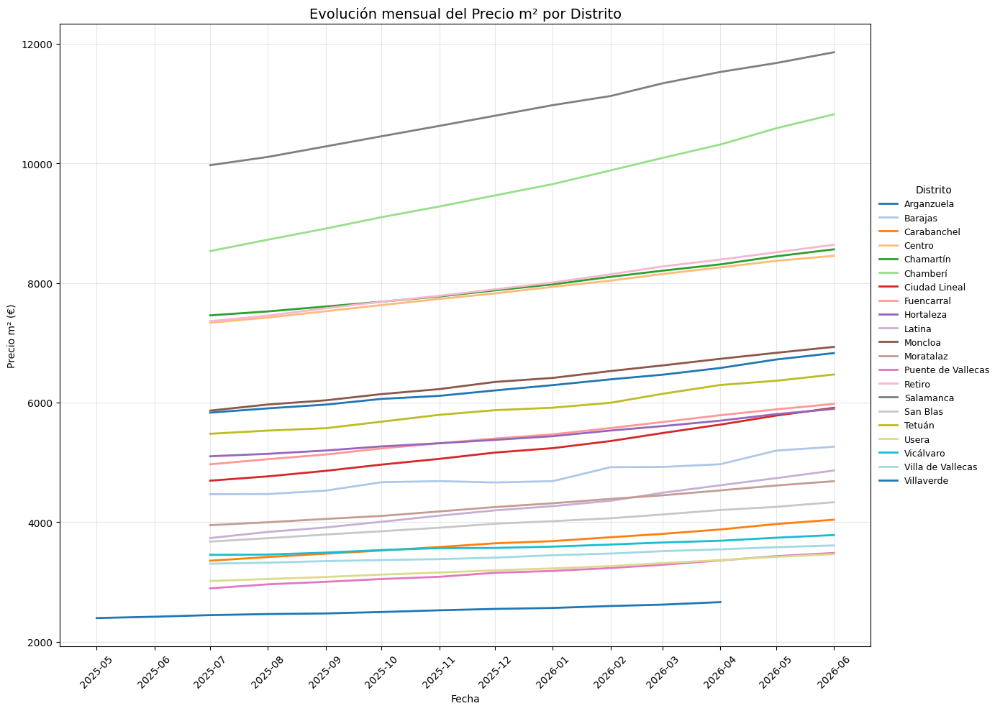

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.dates as mdates

# --- Config ---
df = predicciones_autoarima.copy()

# Normaliza nombres de columnas posibles
#col_fecha = "Fecha" if "Fecha" in df.columns else "Mes"
col_precio = "Prediccion" if "Prediccion" in df.columns else "Precio m2"

# Tipos correctos y orden
df[col_fecha] = pd.to_datetime(df[col_fecha])
df[col_precio] = pd.to_numeric(df[col_precio], errors="coerce")
df.sort_values([ "Distrito", col_fecha ], inplace=True)

# Si hay una lista de distritos definida, filtramos
try:
    distritos = list(distritos_lista)
    df = df[df["Distrito"].isin(distritos)]
except NameError:
    distritos = df["Distrito"].unique().tolist()

# Paleta clara y visual (tab20). Si hay >20, repetimos ciclo.
n = len(distritos)
cmap = cm.get_cmap("tab20", min(max(n,1), 20))
colors = [cmap(i % 20) for i in range(n)]

# --- Gráfico ---
plt.figure(figsize=(14, 10))

for i, (distrito, g) in enumerate(df.groupby("Distrito")):
    plt.plot(
        g[col_fecha],
        g[col_precio],
        label=distrito,
        color=colors[i],
        linewidth=2
    )

# Personalización
plt.title("Evolución mensual del Precio m² por Distrito", fontsize=14)
plt.xlabel("Fecha")
plt.ylabel("Precio m² (€)")

# Eje X mensual y formato AAAA-MM
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
plt.xticks(rotation=45)

plt.grid(True, alpha=0.3)
plt.legend(
    title="Distrito",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=9,
    ncol=1,
    frameon=False
)
plt.tight_layout()
plt.show()

## Representación histórica + predicción

Buscando mejor modelo para distrito: Tetuán
Mejor modelo para Tetuán: SARIMA(2, 2, 2)x(1, 1, 1, 12) - AIC:390.67587955371147
Buscando mejor modelo para distrito: Carabanchel
Mejor modelo para Carabanchel: SARIMA(1, 2, 2)x(0, 1, 1, 12) - AIC:345.6693635324642
Buscando mejor modelo para distrito: Centro
Mejor modelo para Centro: SARIMA(2, 2, 2)x(1, 1, 1, 12) - AIC:408.5307926765646
Buscando mejor modelo para distrito: Puente de Vallecas
Mejor modelo para Puente de Vallecas: SARIMA(0, 2, 2)x(0, 1, 1, 12) - AIC:361.48575872404035
Buscando mejor modelo para distrito: Ciudad Lineal
Mejor modelo para Ciudad Lineal: SARIMA(0, 2, 2)x(0, 1, 1, 12) - AIC:391.4975197966506
Buscando mejor modelo para distrito: San Blas
Mejor modelo para San Blas: SARIMA(0, 2, 2)x(0, 1, 1, 12) - AIC:385.7310755687439
Buscando mejor modelo para distrito: Moncloa
Mejor modelo para Moncloa: SARIMA(0, 2, 2)x(0, 1, 1, 12) - AIC:376.41292985982165
Buscando mejor modelo para distrito: Fuencarral
Mejor modelo para Fuencarra

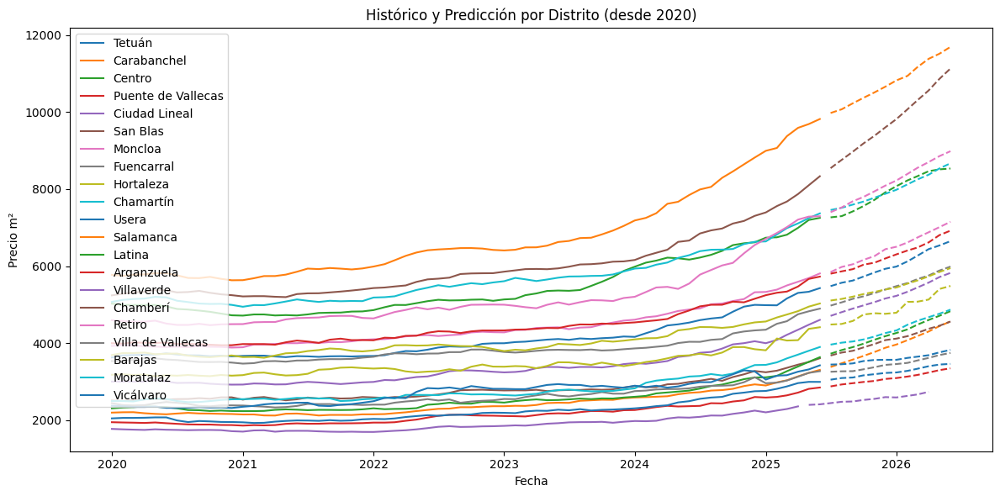

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
import itertools

warnings.filterwarnings("ignore")

# Lista de distritos
distritos = df_total['Distrito'].unique()

# Diccionario para guardar el mejor modelo por distrito
mejores_modelos = {}
predicciones_todas = []

# Definir rangos de búsqueda
p = d = q = range(0, 3)
P = D = Q = range(0, 2)
m = 12

pdq = list(itertools.product(p, d, q))
seasonal_pdq = list(itertools.product(P, D, Q, [m]))

# Entrenamiento y predicción
for distrito in distritos:
    print(f"Buscando mejor modelo para distrito: {distrito}")
    
    df_distrito = df_total[df_total['Distrito'] == distrito].copy()
    serie = df_distrito['Precio m2'].asfreq('MS').dropna()
    
    # 🔹 Filtrar desde enero 2020
    serie = serie[serie.index >= "2020-01-01"]
    
    mejor_aic = float("inf")
    mejor_modelo = None
    mejor_param = None
    mejor_seasonal = None
    
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                modelo = SARIMAX(
                    serie,
                    order=param,
                    seasonal_order=param_seasonal,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                resultado = modelo.fit(disp=False)
                
                if resultado.aic < mejor_aic:
                    mejor_aic = resultado.aic
                    mejor_modelo = resultado
                    mejor_param = param
                    mejor_seasonal = param_seasonal
            except:
                continue
    
    print(f"Mejor modelo para {distrito}: SARIMA{mejor_param}x{mejor_seasonal} - AIC:{mejor_aic}")
    mejores_modelos[distrito] = mejor_modelo
    
    pred = mejor_modelo.get_forecast(steps=12)
    predicciones_todas.append((distrito, serie, pred.predicted_mean))

# ---------- GRAFICAR TODO EN UN SOLO PLOT ----------
plt.figure(figsize=(12, 6))
colores = plt.cm.tab10.colors  

for i, (distrito, historico, prediccion) in enumerate(predicciones_todas):
    color = colores[i % len(colores)]
    
    # Histórico (con etiqueta)
    plt.plot(historico.index, historico.values, color=color, label=distrito)
    
    # Predicción (sin etiqueta)
    plt.plot(prediccion.index, prediccion.values, linestyle="--", color=color)

plt.title("Histórico y Predicción por Distrito (desde 2020)")
plt.xlabel("Fecha")
plt.ylabel("Precio m²")
plt.legend()
plt.tight_layout()
plt.show()



## Evaluar modelo de predicción


Entrenando Optimización de SARIMA por AIC para: Tetuán


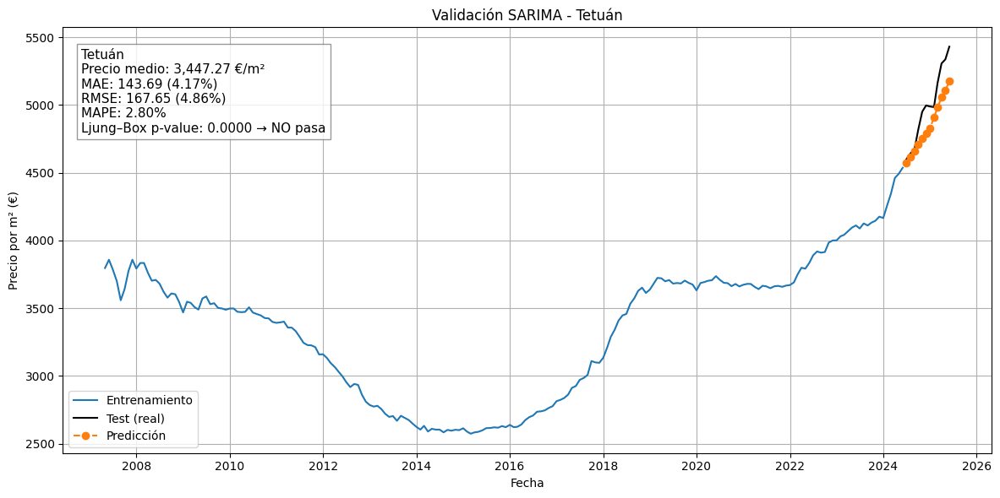


Entrenando Optimización de SARIMA por AIC para: Carabanchel


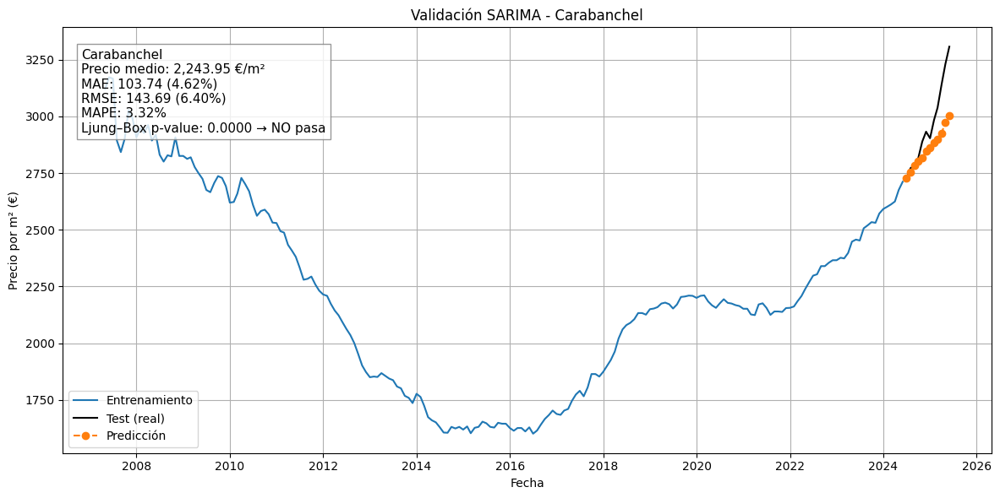


Entrenando Optimización de SARIMA por AIC para: Centro


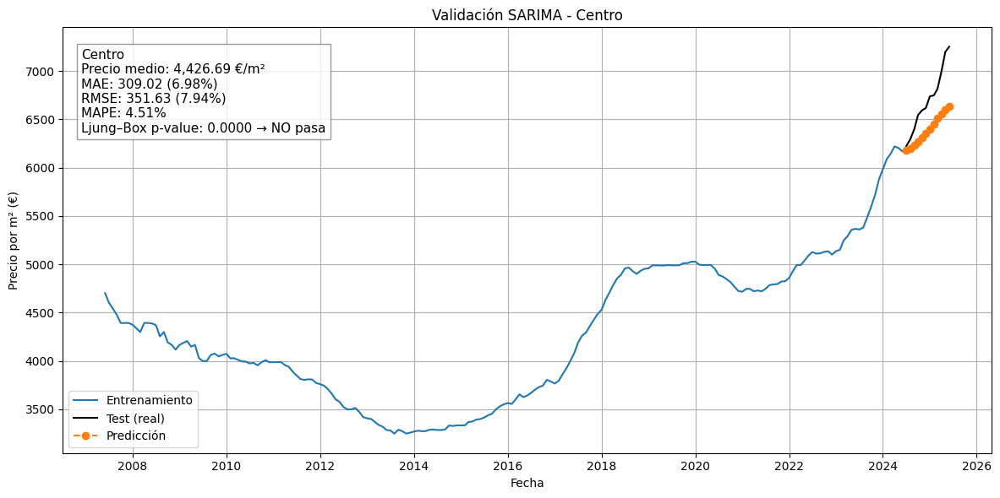


Entrenando Optimización de SARIMA por AIC para: Puente de Vallecas


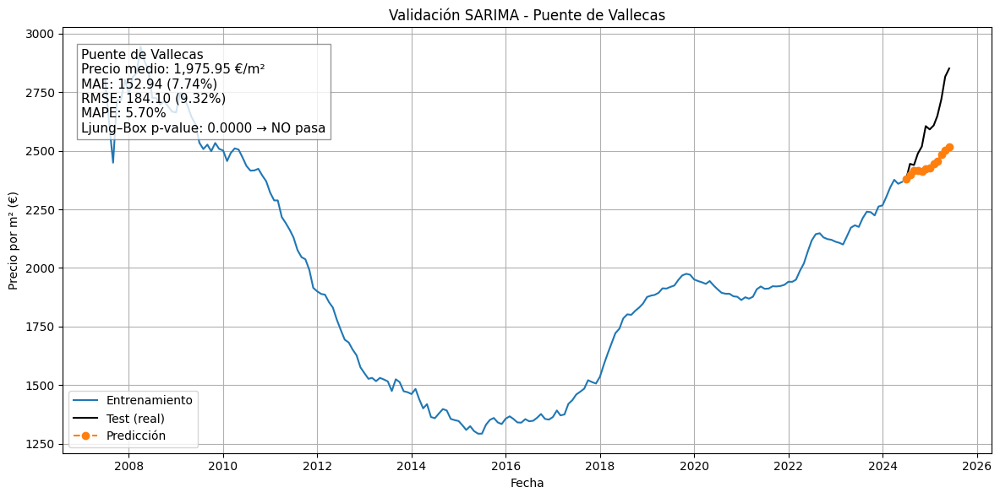


Entrenando Optimización de SARIMA por AIC para: Ciudad Lineal


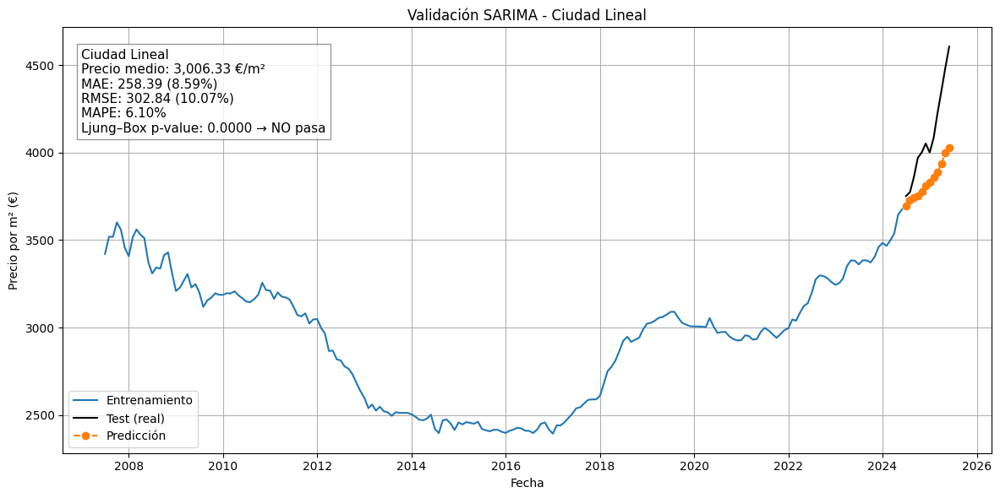


Entrenando Optimización de SARIMA por AIC para: San Blas


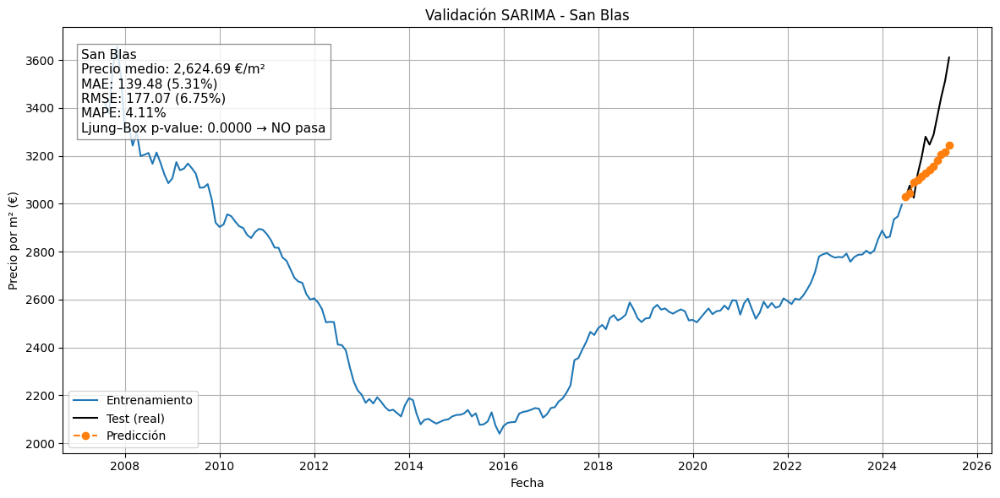


Entrenando Optimización de SARIMA por AIC para: Moncloa


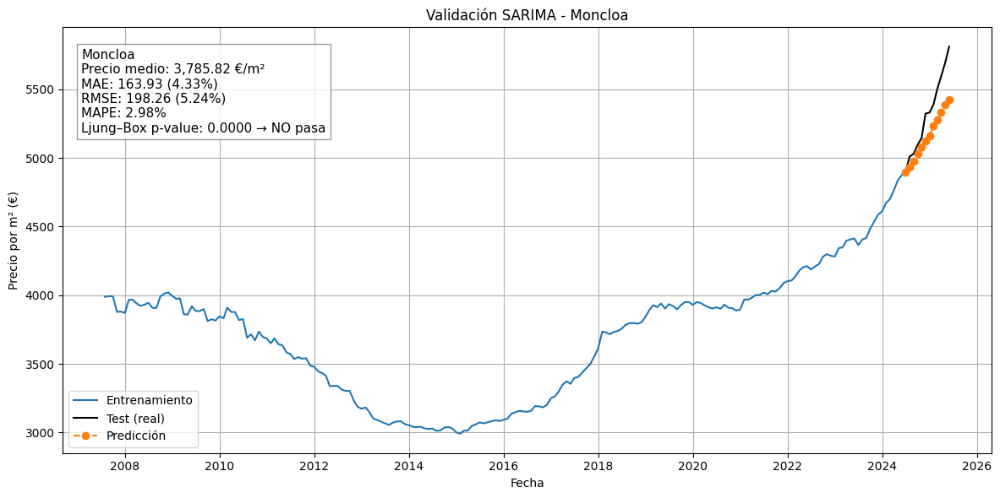


Entrenando Optimización de SARIMA por AIC para: Fuencarral


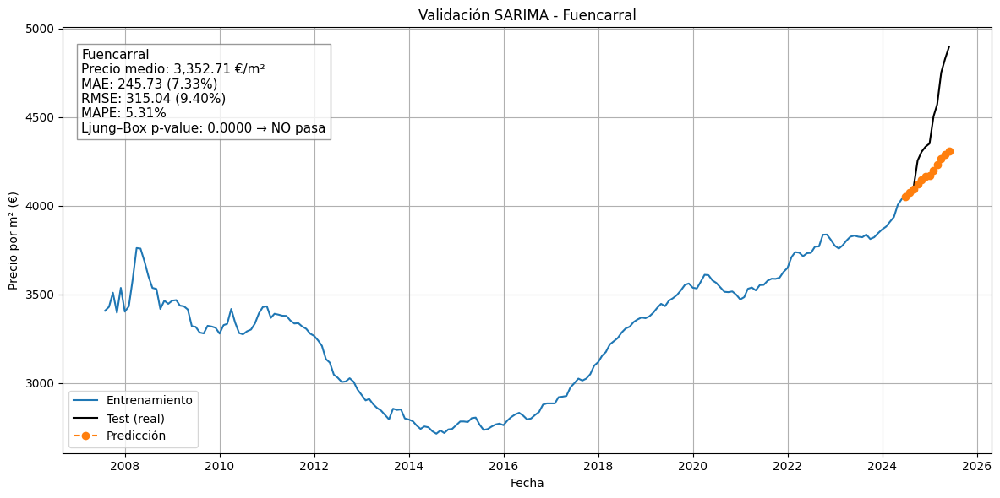


Entrenando Optimización de SARIMA por AIC para: Hortaleza


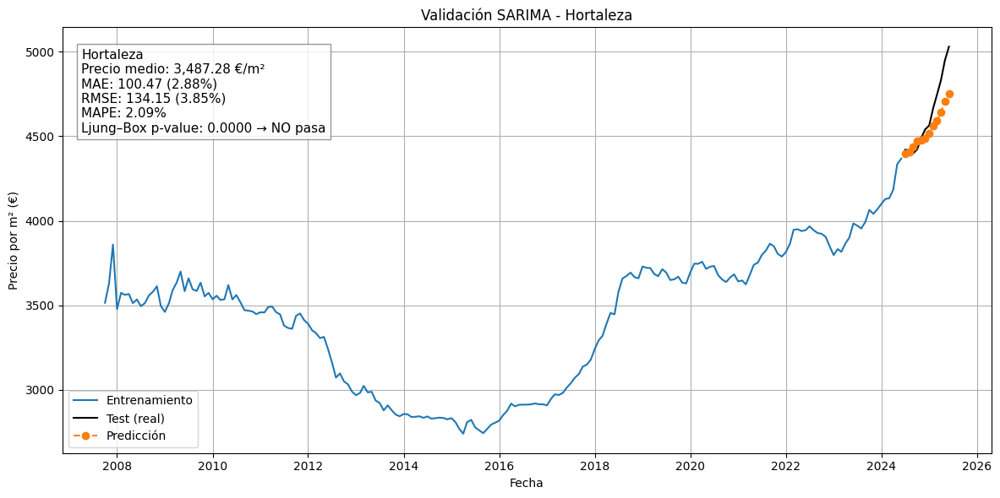


Entrenando Optimización de SARIMA por AIC para: Chamartín


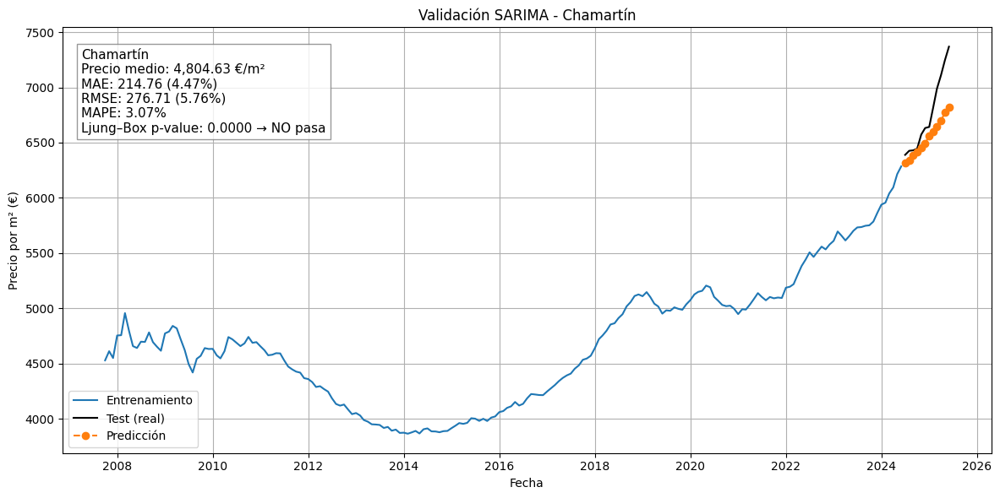


Entrenando Optimización de SARIMA por AIC para: Usera


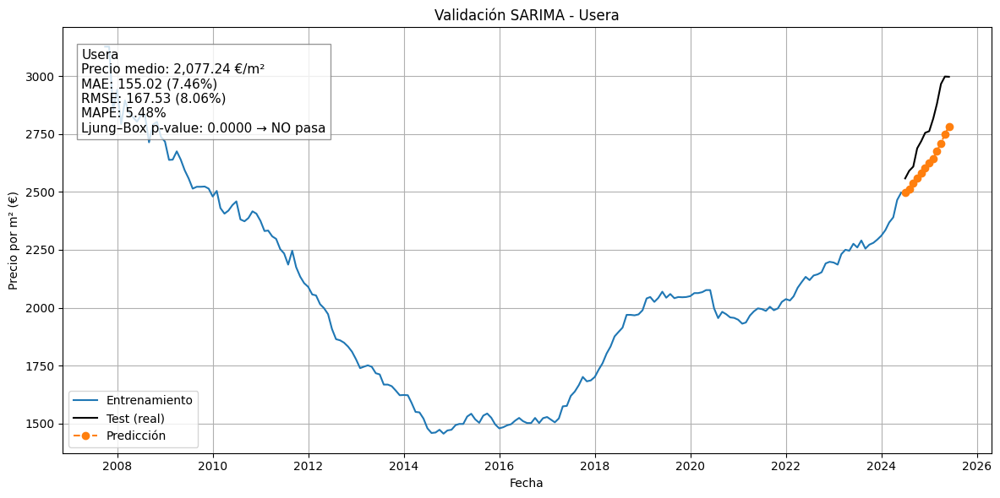


Entrenando Optimización de SARIMA por AIC para: Salamanca


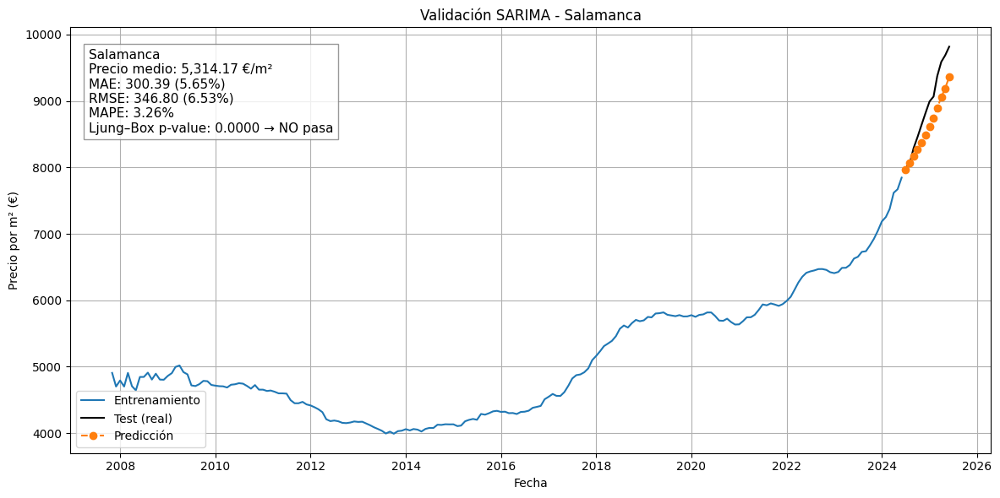


Entrenando Optimización de SARIMA por AIC para: Latina


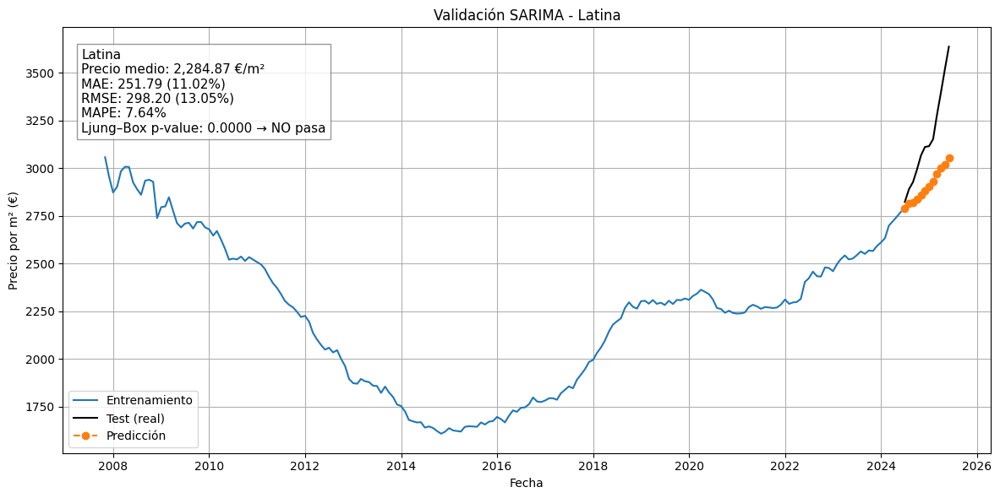


Entrenando Optimización de SARIMA por AIC para: Arganzuela


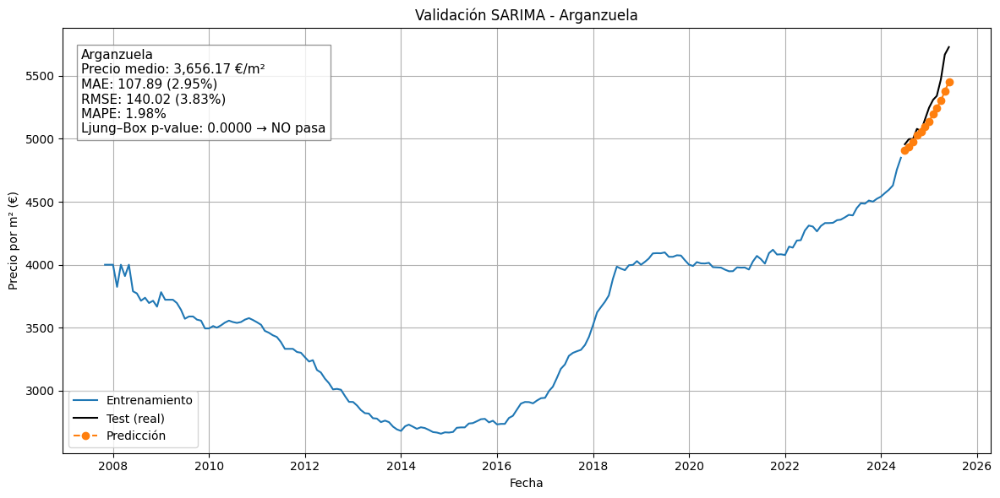


Entrenando Optimización de SARIMA por AIC para: Villaverde


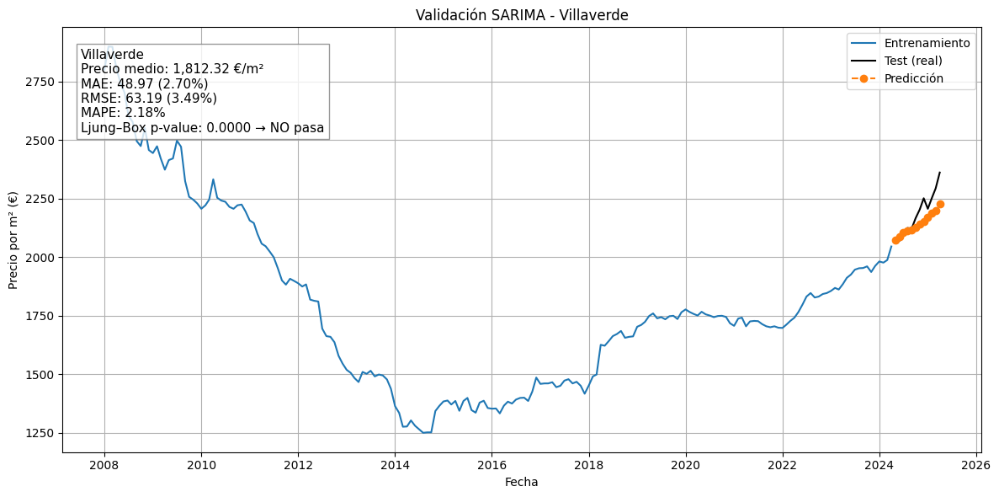


Entrenando Optimización de SARIMA por AIC para: Chamberí


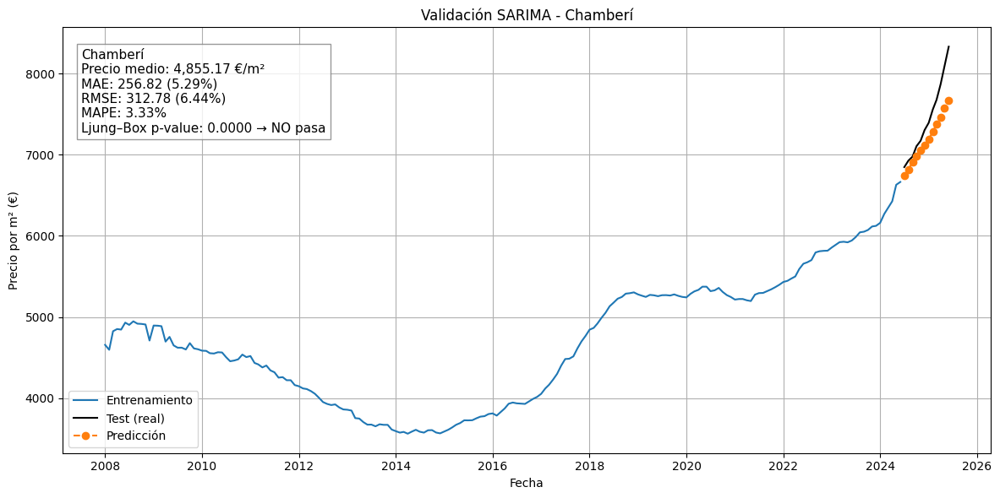


Entrenando Optimización de SARIMA por AIC para: Retiro


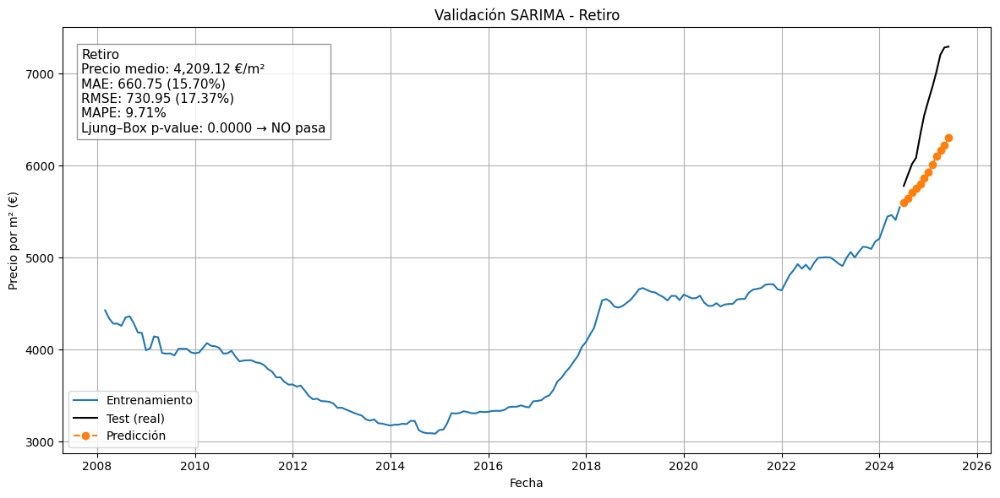


Entrenando Optimización de SARIMA por AIC para: Villa de Vallecas


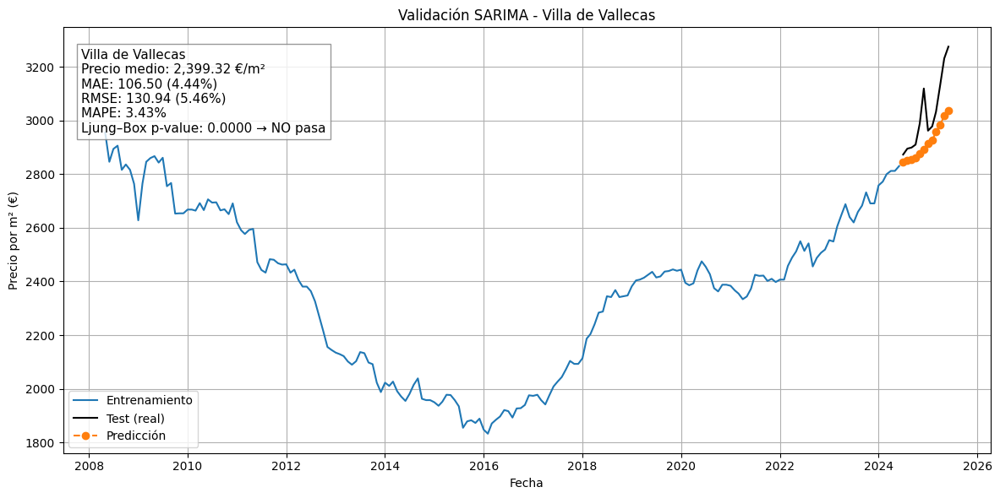


Entrenando Optimización de SARIMA por AIC para: Barajas


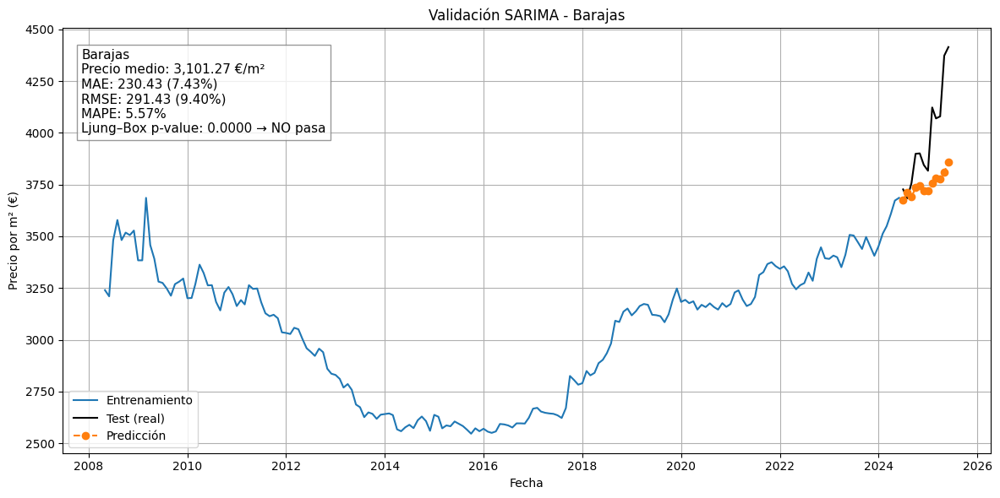


Entrenando Optimización de SARIMA por AIC para: Moratalaz


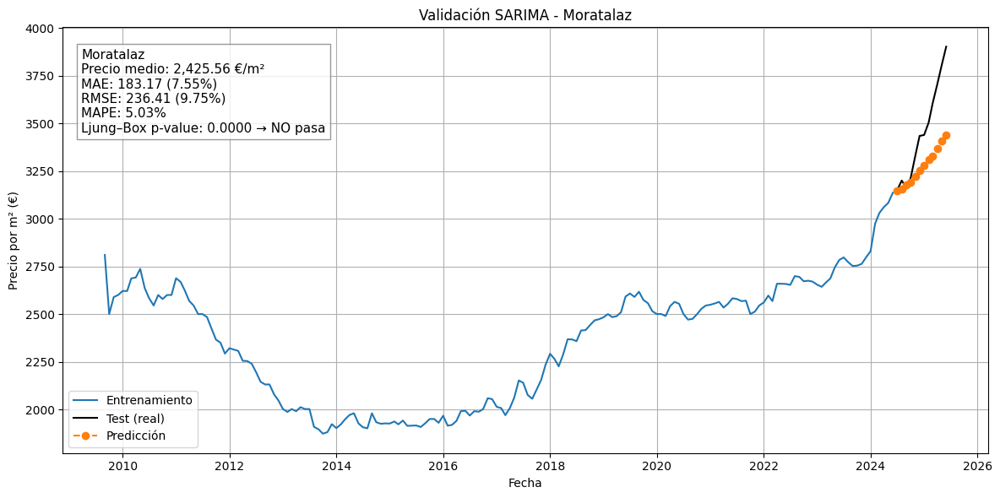


Entrenando Optimización de SARIMA por AIC para: Vicálvaro


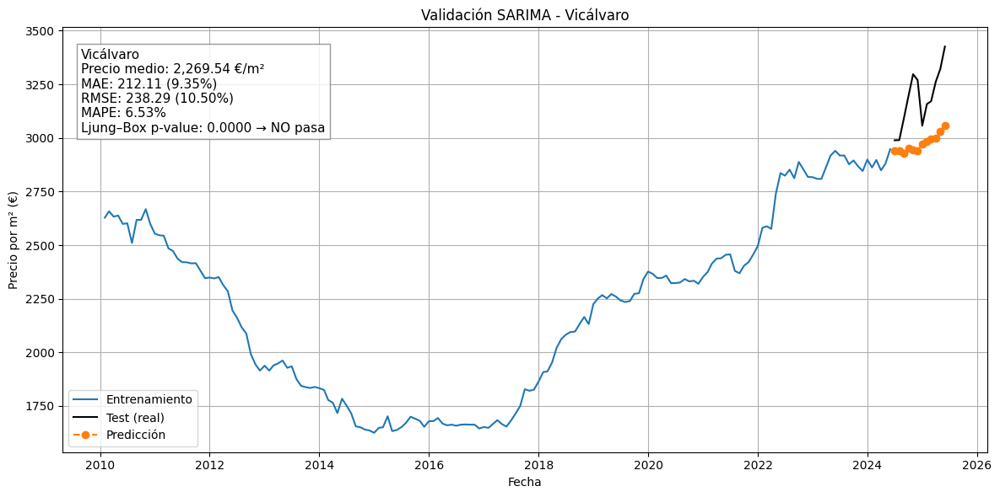

In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.metrics import mean_squared_error, mean_absolute_error
import itertools
import warnings
warnings.filterwarnings("ignore")

# Distritos
distritos = df_total['Distrito'].unique()

# Rango búsqueda
p = d = q = range(0, 3)
P = D = Q = range(0, 2)
m = 12
pdq = list(itertools.product(p, d, q))
seasonal_pdq = list(itertools.product(P, D, Q, [m]))

n_test = 12
resultados_autoarima = {}  

for distrito in distritos:
    print(f"\nEntrenando Optimización de SARIMA por AIC para: {distrito}")

    serie = (
        df_total[df_total['Distrito'] == distrito]['Precio m2']
        .asfreq('MS').interpolate()
    )

    if len(serie) <= n_test + 12:
        print("Serie muy corta, salto…")
        continue

    train, test = serie[:-n_test], serie[-n_test:]
    mejor_aic, mejor_modelo, mejor_param, mejor_seasonal = np.inf, None, None, None

    # Grid search por AIC
    for param in pdq:
        for seas in seasonal_pdq:
            try:
                res = SARIMAX(
                    train,
                    order=param,
                    seasonal_order=seas,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                ).fit(disp=False)
                if res.aic < mejor_aic:
                    mejor_aic, mejor_modelo = res.aic, res
                    mejor_param, mejor_seasonal = param, seas
            except:
                pass

    # Pronóstico con índice temporal correcto
    pred_index = pd.date_range(start=test.index[0], periods=n_test, freq='MS')
    pred = pd.Series(mejor_modelo.forecast(steps=n_test), index=pred_index)

    # --- Métricas ---
    mae  = mean_absolute_error(test, pred)
    rmse = np.sqrt(mean_squared_error(test, pred))
    mape = np.mean(np.abs((test - pred) / test)) * 100

    precio_medio = serie.mean()
    pct_mae  = (mae  / precio_medio) * 100
    pct_rmse = (rmse / precio_medio) * 100

    # --- Ljung–Box ---
    resid = mejor_modelo.resid.dropna()
    lags = min(12, max(1, len(resid) - 1))
    p_lb = acorr_ljungbox(resid, lags=[lags], return_df=True)['lb_pvalue'].iloc[0]
    pasa_lb = p_lb > 0.05

    # Guardar en resultados
    resultados_autoarima[distrito] = {
        "mejor_param": mejor_param,
        "mejor_seasonal": mejor_seasonal,
        "aic": mejor_aic,
        "mape": mape,
        "mae": mae,
        "rmse": rmse,
        "p_lb": p_lb,
        "pasa_lb": pasa_lb
    }

    # --------- GRÁFICO ----------
    fig, ax = plt.subplots(figsize=(12, 6))
    fig.subplots_adjust(left=0.35)  

    # Series
    ax.plot(train, label='Entrenamiento', color='tab:blue')
    ax.plot(test,  label='Test (real)', color='black')
    ax.plot(pred,  label='Predicción', linestyle='--', marker='o', color='tab:orange')

    # Texto interno
    texto_interno = (
        f"{distrito}\n"
        f"Precio medio: {precio_medio:,.2f} €/m²\n"
        f"MAE: {mae:,.2f} ({pct_mae:.2f}%)\n"
        f"RMSE: {rmse:,.2f} ({pct_rmse:.2f}%)\n"
        f"MAPE: {mape:.2f}%\n"
        f"Ljung–Box p-value: {p_lb:.4f} → {'PASA' if pasa_lb else 'NO pasa'}"
    )
    ax.text(
        0.02, 0.95, texto_interno, transform=ax.transAxes,
        fontsize=11, va='top',
        bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray')
    )

   # # Texto externo
    #texto_izq = (
        #f"{distrito}\n"
        #f"MAPE: {mape:.2f}%\n"
        #f"Ljung–Box p-value: {p_lb:.4f} → {'PASA' if pasa_lb else 'NO pasa'}"
    #)
   # fig.text(
      #  0.02, 0.92, texto_izq, va='top', ha='left',
      #  fontsize=11, family='monospace'
   # )

    # Formato gráfico
    ax.set_title(f"Validación SARIMA - {distrito}")
    ax.set_xlabel("Fecha")
    ax.set_ylabel("Precio por m² (€)")
    ax.grid(True)
    ax.legend()
    plt.tight_layout()
    plt.show()

In [20]:
# === Tabla de métricas por distrito ===
df_metricas = pd.DataFrame.from_dict(resultados_autoarima, orient='index')

# Renombrar columnas para que coincidan con la tabla
df_metricas.rename(columns={
    "mae": "MAE",
    "rmse": "RMSE",
    "mape": "MAPE",
    "p_lb": "Ljung-Box p-value",
    "pasa_lb": "Pasa Ljung-Box"
}, inplace=True)

# Añadir columnas calculadas
df_metricas["Precio Medio"] = df_metricas.index.map(
    lambda d: df_total[df_total['Distrito'] == d]["Precio m2"].mean()
)
df_metricas["MAE %"]  = (df_metricas["MAE"]  / df_metricas["Precio Medio"]) * 100
df_metricas["RMSE %"] = (df_metricas["RMSE"] / df_metricas["Precio Medio"]) * 100

# Ordenar por MAPE (mejor a peor)
df_metricas = df_metricas[
    ["Precio Medio", "MAE", "MAE %", "RMSE", "RMSE %", "MAPE"]
].sort_values(by="MAPE").round(2)

# Mostrar
print(df_metricas)

# Guardar a CSV
df_metricas.to_csv("metricas_sarima_por_distrito.csv", encoding="utf-8-sig")


                    Precio Medio     MAE  MAE %    RMSE  RMSE %  MAPE
Arganzuela               3656.17  107.89   2.95  140.02    3.83  1.98
Hortaleza                3487.28  100.47   2.88  134.15    3.85  2.09
Villaverde               1812.32   48.97   2.70   63.19    3.49  2.18
Tetuán                   3447.27  143.69   4.17  167.65    4.86  2.80
Moncloa                  3785.82  163.93   4.33  198.26    5.24  2.98
Chamartín                4804.63  214.76   4.47  276.71    5.76  3.07
Salamanca                5314.17  300.39   5.65  346.80    6.53  3.26
Carabanchel              2243.95  103.74   4.62  143.69    6.40  3.32
Chamberí                 4855.17  256.82   5.29  312.78    6.44  3.33
Villa de Vallecas        2399.32  106.50   4.44  130.94    5.46  3.43
San Blas                 2624.69  139.48   5.31  177.07    6.75  4.11
Centro                   4426.69  309.02   6.98  351.63    7.94  4.51
Moratalaz                2425.56  183.17   7.55  236.41    9.75  5.03
Fuencarral          